Installations

In [ ]:
!pip install powerlaw
!pip install python-igraph
!pip install numpy==1.23.5 # in the new version of numpy, there is a problem with np.array

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 59.5 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.25.2
    Uninstalling numpy-1.25.2:
      Successfully uninstalled numpy-1.25.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
chex 0.1.86 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
pandas-stubs 2.0.3.230814 requires numpy>=1.25.0; python_version >= "3.9", but you have numpy 1.23.5 which is incompatible.


**Graph U-Nets Integration**
<br>
We integrate into preproc_data method the gpool operation. We will not use the coarse graph of misc-gan that generated in parse_data (R, P, W and c values). We used gpool operation instead.

In the fist approach, in the test method of cycle-gan class, after generating the new coarse graph, we will apply gunpool operation on it. The generate_network iterate on each layer and it executes the test method of cycle-gan.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

In [ ]:
class GNet(nn.Module):
    def __init__(self, in_dim, n_classes, args):
        super(GNet, self).__init__()
        self.n_act = getattr(nn, args.act_n)()
        self.c_act = getattr(nn, args.act_c)()
        self.s_gcn = GCN(in_dim, args.l_dim, self.n_act, args.drop_n)
        self.g_unet = GraphUnet(
            args.ks, args.l_dim, args.l_dim, args.l_dim, self.n_act,
            args.drop_n)
        self.out_l_1 = nn.Linear(3*args.l_dim*(args.l_num+1), args.h_dim)
        self.out_l_2 = nn.Linear(args.h_dim, n_classes)
        self.out_drop = nn.Dropout(p=args.drop_c)
        Initializer.weights_init(self)

    def forward(self, gs, hs, labels):
        hs = self.embed(gs, hs)
        logits = self.classify(hs)
        return self.metric(logits, labels)

    def embed(self, gs, hs):
        o_hs = []
        for g, h in zip(gs, hs):
            h = self.embed_one(g, h)
            o_hs.append(h)
        hs = torch.stack(o_hs, 0)
        return hs

    def embed_one(self, g, h):
        g = norm_g(g)
        h = self.s_gcn(g, h)
        hs = self.g_unet(g, h)
        h = self.readout(hs)
        return h

    def readout(self, hs):
        h_max = [torch.max(h, 0)[0] for h in hs]
        h_sum = [torch.sum(h, 0) for h in hs]
        h_mean = [torch.mean(h, 0) for h in hs]
        h = torch.cat(h_max + h_sum + h_mean)
        return h

    def classify(self, h):
        h = self.out_drop(h)
        h = self.out_l_1(h)
        h = self.c_act(h)
        h = self.out_drop(h)
        h = self.out_l_2(h)
        return F.log_softmax(h, dim=1)

    def metric(self, logits, labels):
        loss = F.nll_loss(logits, labels)
        _, preds = torch.max(logits, 1)
        acc = torch.mean((preds == labels).float())
        return loss, acc


In [ ]:
class GraphUnet(nn.Module):

    def __init__(self, ks, in_dim, out_dim, dim, act, drop_p):
        super(GraphUnet, self).__init__()
        self.ks = ks
        self.bottom_gcn = GCN(dim, dim, act, drop_p)
        self.down_gcns = nn.ModuleList()
        self.up_gcns = nn.ModuleList()
        self.pools = nn.ModuleList()
        self.unpools = nn.ModuleList()
        self.l_n = len(ks)
        for i in range(self.l_n):
            self.down_gcns.append(GCN(dim, dim, act, drop_p))
            self.up_gcns.append(GCN(dim, dim, act, drop_p))
            self.pools.append(Pool(ks[i], dim, drop_p))
            self.unpools.append(Unpool(dim, dim, drop_p))

    def forward(self, g, h):
        adj_ms = []
        indices_list = []
        down_outs = []
        hs = []
        org_h = h
        for i in range(self.l_n):
            h = self.down_gcns[i](g, h)
            adj_ms.append(g)
            down_outs.append(h)
            g, h, idx = self.pools[i](g, h)
            indices_list.append(idx)
        h = self.bottom_gcn(g, h)
        for i in range(self.l_n):
            up_idx = self.l_n - i - 1
            g, idx = adj_ms[up_idx], indices_list[up_idx]
            g, h = self.unpools[i](g, h, down_outs[up_idx], idx)
            h = self.up_gcns[i](g, h)
            h = h.add(down_outs[up_idx])
            hs.append(h)
        h = h.add(org_h)
        hs.append(h)
        return hs


class GCN(nn.Module):

    def __init__(self, in_dim, out_dim, act, p):
        super(GCN, self).__init__()
        self.proj = nn.Linear(in_dim, out_dim)
        self.act = act
        self.drop = nn.Dropout(p=p) if p > 0.0 else nn.Identity()

    def forward(self, g, h):
        h = self.drop(h)
        h = torch.matmul(g, h)
        h = self.proj(h)
        h = self.act(h)
        return h

class Pool(nn.Module):

    def __init__(self, k, in_dim, p):
        super(Pool, self).__init__()
        self.k = k
        self.sigmoid = nn.Sigmoid()
        self.proj = nn.Linear(in_dim, 1)
        self.drop = nn.Dropout(p=p) if p > 0 else nn.Identity()

    def forward(self, g, h):
        Z = self.drop(h)
        weights = self.proj(Z).squeeze()
        scores = self.sigmoid(weights)
        return top_k_graph(scores, g, h, self.k)


class Unpool(nn.Module):
    def __init__(self, *args):
        super(Unpool, self).__init__()

    def forward(self, g, h, pre_h, idx):
        new_h = h.new_zeros([g.shape[0], h.shape[1]])
        # Subset h to match the size of idx
        h_subset = h[:len(idx)]
        # Debug: Print shapes before assignment
        print(f"Shape of new_h before assignment: {new_h.shape}")
        print(f"Shape of h_subset: {h_subset.shape}")
        print(f"Shape of idx: {idx.shape}")
        new_h[idx] = h_subset
        return g, new_h
    '''def forward(self, g, h, pre_h, idx):
        new_h = h.new_zeros([g.shape[0], h.shape[1]])
        new_h[idx] = h
        return g, new_h'''


def top_k_graph(scores, g, h, k):
    num_nodes = g.shape[0]
    values, idx = torch.topk(scores, max(2, int(k*num_nodes)))
    new_h = h[idx, :]
    values = torch.unsqueeze(values, -1)
    new_h = torch.mul(new_h, values)
    un_g = g.bool().float()
    un_g = torch.matmul(un_g, un_g).bool().float()
    un_g = un_g[idx, :]
    un_g = un_g[:, idx]
    g = norm_g(un_g)
    return g, new_h, idx


def norm_g(g):
    degrees = torch.sum(g, 1)
    g = g / degrees
    return g

In [ ]:
class Initializer(object):

    @classmethod
    def _glorot_uniform(cls, w):
        if len(w.size()) == 2:
            fan_in, fan_out = w.size()
        elif len(w.size()) == 3:
            fan_in = w.size()[1] * w.size()[2]
            fan_out = w.size()[0] * w.size()[2]
        else:
            fan_in = np.prod(w.size())
            fan_out = np.prod(w.size())
        limit = np.sqrt(6.0 / (fan_in + fan_out))
        w.uniform_(-limit, limit)

    @classmethod
    def _param_init(cls, m):
        if isinstance(m, nn.parameter.Parameter):
            cls._glorot_uniform(m.data)
        elif isinstance(m, nn.Linear):
            m.bias.data.zero_()
            cls._glorot_uniform(m.weight.data)

    @classmethod
    def weights_init(cls, m):
        for p in m.modules():
            if isinstance(p, nn.ParameterList):
                for pp in p:
                    cls._param_init(pp)
            else:
                cls._param_init(p)

        for name, p in m.named_parameters():
            if '.' not in name:
                cls._param_init(p)

In [ ]:
class GNetArgs:
    seed = 1
    data = 'PROTEINS'
    fold = 1
    num_epochs = 100
    batch = 32
    lr = 0.001
    deg_as_tag = 0
    l_num = 3
    h_dim = 128
    l_dim = 48
    drop_n = 0.5
    drop_c = 0.5
    act_n = 'ELU'
    act_c = 'ELU'
    ks = [0.9, 0.8, 0.7]
    acc_file = 're'
    in_dim = 3  # Set to 3 because of the size of Graph Data of PROTEINS
    save_model = '/content/drive/MyDrive/TrainedGraphU-Nets/proteins_graph_unet_model.pth' # Change here the path

gnet_args = GNetArgs()
net = GNet(in_dim=gnet_args.in_dim, n_classes=2, args=gnet_args)

def load_model_parameters(model, model_path):
    pretrained_dict = torch.load(model_path)
    model_dict = model.state_dict()
    pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and model_dict[k].size() == v.size()}
    model_dict.update(pretrained_dict)
    model.load_state_dict(model_dict)

model_path = gnet_args.save_model
load_model_parameters(net, model_path)
net.eval()

# for g-unets integration
global_params = {
    "down_outs_list": [],
    "indices_list_list": []
}

Imports

In [ ]:
import tensorflow as tf
import numpy as np
import pickle as pkl
import argparse
import networkx as nx
import scipy.sparse as sp
import scipy.io as sio
import sys
import os
from collections import namedtuple
import math
import time
from google.colab import drive
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from scipy.sparse.csgraph import connected_components
from __future__ import division
from __future__ import print_function
import copy
import powerlaw
import collections
import igraph
import tf_slim as slim # import tensorflow.contrib.slim as slim also legacy and goolge colab removed it
from tensorflow.python.framework import ops

print(np.__version__)

1.23.5


In [ ]:
class Args:
  def __init__(self, version=-1):
    self.demo = False
    self.dataset_A = f'cora_{version}.mat' if version > -1 else 'cora.mat'  # path of the data set
    self.checkpoint = f'/content/Misc-Gan_Project/checkpoint_training_cora_{version}' if version > -1 else '/content/Misc-Gan_Project/checkpoint_training_cora'  # path of the checkpoint
    self.filename = f'cora_output_network_{version}' if version > -1 else 'cora_output_network'  # the filename of output network
    self.output_dir = f'/content/Misc-Gan_Project/output_dir_cora_{version}' if version > -1 else '/content/Misc-Gan_Project/output_dir_cora'  # results are saved here
    self.epoch = 250  # number of epoch
    self.layer = 5  # number of layers
    self.clusters = 2  # number of clusters (2 or 3)
    self.use_resnet = True  # generation network using reidule block
    self.use_lsgan = True  # gan loss defined in lsgan
    self.which_direction = 'BtoA'  # AtoB or BtoA
    self.which_stage = 'training'  # training stage or testing stage
    self.starting_layer = 1  # the starting layer
    self.shuffle = True  # Shuffle the graph
    self.gpu = False  # Use gpu to train the model or not
    self.kernel_number = 32  # Shuffle the graph
    self.iter = 5  # Iterations of residule_block function for generator to train graph

args = Args()

Gae Module

initializations.py

In [ ]:
def weight_variable_glorot(input_dim, output_dim, name=""):
    """Create a weight variable with Glorot & Bengio (AISTATS 2010)
    initialization.
    """
    init_range = np.sqrt(6.0 / (input_dim + output_dim))
    initial = tf.compat.v1.random_uniform([input_dim, output_dim], minval=-init_range,
                                maxval=init_range, dtype=tf.compat.v1.float32)
    return tf.compat.v1.Variable(initial, name=name)


input_data.py

In [ ]:
def parse_index_file(filename):
    index = []
    for line in open(filename):
        index.append(int(line.strip()))
    return index

In [ ]:
def load_data(dataset):
    # load the data: x, tx, allx, graph
    names = ['x', 'tx', 'allx', 'graph']
    objects = []
    for i in range(len(names)):
        objects.append(pkl.load(open("/content/drive/MyDrive/Misc-Gan_Project/data/ind.{}.{}".format(dataset, names[i]))))
    x, tx, allx, graph = tuple(objects)
    test_idx_reorder = parse_index_file("/content/drive/MyDrive/Misc-Gan_Project/data/ind.{}.test.index".format(dataset))
    test_idx_range = np.sort(test_idx_reorder)

    if dataset == 'citeseer':
        # Fix citeseer dataset (there are some isolated nodes in the graph)
        # Find isolated nodes, add them as zero-vecs into the right position
        test_idx_range_full = range(min(test_idx_reorder), max(test_idx_reorder)+1)
        tx_extended = sp.lil_matrix((len(test_idx_range_full), x.shape[1]))
        tx_extended[test_idx_range-min(test_idx_range), :] = tx
        tx = tx_extended

    features = sp.vstack((allx, tx)).tolil()
    features[test_idx_reorder, :] = features[test_idx_range, :]
    adj = nx.adjacency_matrix(nx.from_dict_of_lists(graph))
    return adj, features

In [ ]:
def load_network_data(filename):
    network_A = sio.loadmat('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(filename))
    A = network_A['A']
    R = network_A['R'].transpose()
    edges = network_A['edges']
    return A, R, edges

layers.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

# global unique layer ID dictionary for layer name assignment
_LAYER_UIDS = {}

In [ ]:
def get_layer_uid(layer_name=''):
    """Helper function, assigns unique layer IDs
    """
    if layer_name not in _LAYER_UIDS:
        _LAYER_UIDS[layer_name] = 1
        return 1
    else:
        _LAYER_UIDS[layer_name] += 1
        return _LAYER_UIDS[layer_name]

In [ ]:
def dropout_sparse(x, keep_prob, num_nonzero_elems):
    """Dropout for sparse tensors. Currently fails for very large sparse tensors (>1M elements)
    """
    noise_shape = [num_nonzero_elems]
    random_tensor = keep_prob
    random_tensor += tf.compat.v1.random_uniform(noise_shape)
    dropout_mask = tf.cast(tf.compat.v1.floor(random_tensor), dtype=tf.compat.v1.bool)
    pre_out = tf.compat.v1.sparse_retain(x, dropout_mask)
    return pre_out * (1./keep_prob)

In [ ]:
class Layer(object):
    """Base layer class. Defines basic API for all layer objects.

    # Properties
        name: String, defines the variable scope of the layer.

    # Methods
        _call(inputs): Defines computation graph of layer
            (i.e. takes input, returns output)
        __call__(inputs): Wrapper for _call()
    """
    def __init__(self, **kwargs):
        allowed_kwargs = {'name', 'logging'}
        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg
        name = kwargs.get('name')
        if not name:
            layer = self.__class__.__name__.lower()
            name = layer + '_' + str(get_layer_uid(layer))
        self.name = name
        self.vars = {}
        logging = kwargs.get('logging', False)
        self.logging = logging
        self.issparse = False

    def _call(self, inputs):
        return inputs

    def __call__(self, inputs):
        with tf.compat.v1.name_scope(self.name):
            outputs = self._call(inputs)
            return outputs

In [ ]:
class GraphConvolution(Layer):
    """Basic graph convolution layer for undirected graph without edge labels."""
    def __init__(self, input_dim, output_dim, adj, dropout=0., act=tf.compat.v1.nn.relu, **kwargs):
        super(GraphConvolution, self).__init__(**kwargs)
        with tf.compat.v1.variable_scope(self.name + '_vars'):
            self.vars['weights'] = weight_variable_glorot(input_dim, output_dim, name="weights")
        self.dropout = dropout
        self.adj = adj
        self.act = act

    def _call(self, inputs):
        x = inputs
        x = tf.compat.v1.nn.dropout(x, 1-self.dropout)
        x = tf.compat.v1.matmul(x, self.vars['weights'])
        x = tf.compat.v1.sparse_tensor_dense_matmul(self.adj, x)
        outputs = self.act(x)
        return outputs

In [ ]:

class GraphConvolutionSparse(Layer):
    """Graph convolution layer for sparse inputs."""
    def __init__(self, input_dim, output_dim, adj, features_nonzero, dropout=0., act=tf.compat.v1.nn.relu, **kwargs):
        super(GraphConvolutionSparse, self).__init__(**kwargs)
        with tf.compat.v1.variable_scope(self.name + '_vars'):
            self.vars['weights'] = weight_variable_glorot(input_dim, output_dim, name="weights")
        self.dropout = dropout
        self.adj = adj
        self.act = act
        self.issparse = True
        self.features_nonzero = features_nonzero

    def _call(self, inputs):
        x = inputs
        x = dropout_sparse(x, 1-self.dropout, self.features_nonzero)
        x = tf.compat.v1.sparse_tensor_dense_matmul(x, self.vars['weights'])
        x = tf.compat.v1.sparse_tensor_dense_matmul(self.adj, x)
        outputs = self.act(x)
        return outputs


In [ ]:
class InnerProductDecoder(Layer):
    """Decoder model layer for link prediction."""
    def __init__(self, input_dim, dropout=0., act=tf.compat.v1.nn.sigmoid, **kwargs):
        super(InnerProductDecoder, self).__init__(**kwargs)
        self.dropout = dropout
        self.act = act

    def _call(self, inputs):
        inputs = tf.compat.v1.nn.dropout(inputs, 1-self.dropout)
        x = tf.compat.v1.transpose(inputs)
        x = tf.compat.v1.matmul(inputs, x)
        x = tf.compat.v1.reshape(x, [-1])
        outputs = self.act(x)
        return outputs

model.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

class Model(object):
    def __init__(self, **kwargs):
        allowed_kwargs = {'name', 'logging'}
        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg

        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg
        name = kwargs.get('name')
        if not name:
            name = self.__class__.__name__.lower()
        self.name = name

        logging = kwargs.get('logging', False)
        self.logging = logging

        self.vars = {}

    def _build(self):
        raise NotImplementedError

    def build(self):
        """ Wrapper for _build() """
        with tf.compat.v1.variable_scope(self.name):
            self._build()
        variables = tf.compat.v1.get_collection(tf.compat.v1.GraphKeys.GLOBAL_VARIABLES, scope=self.name)
        self.vars = {var.name: var for var in variables}

    def fit(self):
        pass

    def predict(self):
        pass

In [ ]:
class GCNModelAE(Model):
    def __init__(self, placeholders, num_features, features_nonzero, **kwargs):
        super(GCNModelAE, self).__init__(**kwargs)

        self.inputs = placeholders['features']
        self.input_dim = num_features
        self.features_nonzero = features_nonzero
        self.adj = placeholders['adj']
        self.dropout = placeholders['dropout']
        self.build()

    def _build(self):
        self.hidden1 = GraphConvolutionSparse(input_dim=self.input_dim,
                                              output_dim=FLAGS.hidden1,
                                              adj=self.adj,
                                              features_nonzero=self.features_nonzero,
                                              act=tf.compat.v1.nn.relu,
                                              dropout=self.dropout,
                                              logging=self.logging)(self.inputs)

        self.embeddings = GraphConvolution(input_dim=FLAGS.hidden1,
                                           output_dim=FLAGS.hidden2,
                                           adj=self.adj,
                                           act=lambda x: x,
                                           dropout=self.dropout,
                                           logging=self.logging)(self.hidden1)

        self.z_mean = self.embeddings

        self.reconstructions = InnerProductDecoder(input_dim=FLAGS.hidden2,
                                      act=lambda x: x,
                                      logging=self.logging)(self.embeddings)

In [ ]:
class GCNModelVAE(Model):
    def __init__(self, placeholders, num_features, num_nodes, features_nonzero, **kwargs):
        super(GCNModelVAE, self).__init__(**kwargs)

        self.inputs = placeholders['features']
        self.input_dim = num_features
        self.features_nonzero = features_nonzero
        self.n_samples = num_nodes
        self.adj = placeholders['adj']
        self.dropout = placeholders['dropout']
        self.build()

    def _build(self):
        self.hidden1 = GraphConvolutionSparse(input_dim=self.input_dim,
                                              output_dim=FLAGS.hidden1,
                                              adj=self.adj,
                                              features_nonzero=self.features_nonzero,
                                              act=tf.compat.v1.nn.relu,
                                              dropout=self.dropout,
                                              logging=self.logging)(self.inputs)

        self.z_mean = GraphConvolution(input_dim=FLAGS.hidden1,
                                       output_dim=FLAGS.hidden2,
                                       adj=self.adj,
                                       act=lambda x: x,
                                       dropout=self.dropout,
                                       logging=self.logging)(self.hidden1)

        self.z_log_std = GraphConvolution(input_dim=FLAGS.hidden1,
                                          output_dim=FLAGS.hidden2,
                                          adj=self.adj,
                                          act=lambda x: x,
                                          dropout=self.dropout,
                                          logging=self.logging)(self.hidden1)

        self.z = self.z_mean + tf.compat.v1.random_normal([self.n_samples, FLAGS.hidden2]) * tf.compat.v1.exp(self.z_log_std)

        self.reconstructions = InnerProductDecoder(input_dim=FLAGS.hidden2,
                                      act=lambda x: x,
                                      logging=self.logging)(self.z)

optimizer.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

class OptimizerAE(object):
    def __init__(self, preds, labels, pos_weight, norm):
        preds_sub = preds
        labels_sub = labels

        self.cost = norm * tf.compat.v1.reduce_mean(tf.compat.v1.nn.weighted_cross_entropy_with_logits(logits=preds_sub, targets=labels_sub, pos_weight=pos_weight))
        self.optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=FLAGS.learning_rate)  # Adam Optimizer

        self.opt_op = self.optimizer.minimize(self.cost)
        self.grads_vars = self.optimizer.compute_gradients(self.cost)

        self.correct_prediction = tf.compat.v1.equal(tf.compat.v1.cast(tf.compat.v1.greater_equal(tf.compat.v1.sigmoid(preds_sub), 0.5), tf.compat.v1.int32),
                                           tf.compat.v1.cast(labels_sub, tf.compat.v1.int32))
        self.accuracy = tf.compat.v1.reduce_mean(tf.compat.v1.cast(self.correct_prediction, tf.compat.v1.float32))


In [ ]:
class OptimizerVAE(object):
    def __init__(self, preds, labels, model, num_nodes, pos_weight, norm):
        preds_sub = preds
        labels_sub = labels

        self.cost = norm * tf.compat.v1.reduce_mean(tf.compat.v1.nn.weighted_cross_entropy_with_logits(logits=preds_sub, targets=labels_sub, pos_weight=pos_weight))
        self.optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=FLAGS.learning_rate)  # Adam Optimizer

        # Latent loss
        self.log_lik = self.cost
        self.kl = (0.5 / num_nodes) * tf.compat.v1.reduce_mean(tf.compat.v1.reduce_sum(1 + 2 * model.z_log_std - tf.compat.v1.square(model.z_mean) -
                                                                   tf.compat.v1.square(tf.compat.v1.exp(model.z_log_std)), 1))
        self.cost -= self.kl

        self.opt_op = self.optimizer.minimize(self.cost)
        self.grads_vars = self.optimizer.compute_gradients(self.cost)

        self.correct_prediction = tf.compat.v1.equal(tf.compat.v1.cast(tf.compat.v1.greater_equal(tf.compat.v1.sigmoid(preds_sub), 0.5), tf.compat.v1.int32),
                                           tf.compat.v1.cast(labels_sub, tf.compat.v1.int32))
        self.accuracy = tf.compat.v1.reduce_mean(tf.compat.v1.cast(self.correct_prediction, tf.compat.v1.float32))

preprocessing.py

In [ ]:
def sparse_to_tuple(sparse_mx):
    if not sp.isspmatrix_coo(sparse_mx):
        sparse_mx = sparse_mx.tocoo()
    coords = np.vstack((sparse_mx.row, sparse_mx.col)).transpose()
    values = sparse_mx.data
    shape = sparse_mx.shape
    return coords, values, shape

In [ ]:
def preprocess_graph(adj):
    adj = sp.coo_matrix(adj)
    adj_ = adj + sp.eye(adj.shape[0])
    rowsum = np.array(adj_.sum(1))
    degree_mat_inv_sqrt = sp.diags(np.power(rowsum, -0.5).flatten())
    adj_normalized = adj_.dot(degree_mat_inv_sqrt).transpose().dot(degree_mat_inv_sqrt).tocoo()
    return sparse_to_tuple(adj_normalized)

In [ ]:
def construct_feed_dict(adj_normalized, adj, features, placeholders):
    # construct feed dictionary
    feed_dict = dict()
    feed_dict.update({placeholders['features']: features})
    feed_dict.update({placeholders['adj']: adj_normalized})
    feed_dict.update({placeholders['adj_orig']: adj})
    return feed_dict

In [ ]:
def mask_test_edges(adj):
    # Function to build test set with 10% positive links
    # NOTE: Splits are randomized and results might slightly deviate from reported numbers in the paper.
    # TODO: Clean up.

    # Remove diagonal elements
    adj = adj - sp.dia_matrix((adj.diagonal()[np.newaxis, :], [0]), shape=adj.shape)
    adj.eliminate_zeros()
    # Check that diag is zero:
    # assert np.diag(adj.todense()).sum() == 0

    adj_triu = sp.triu(adj)
    adj_tuple = sparse_to_tuple(adj_triu)
    edges = adj_tuple[0]
    # edges_all = sparse_to_tuple(adj)[0]
    # num_test = int(np.floor(edges.shape[0] / 10.))
    # num_val = int(np.floor(edges.shape[0] / 20.))

    # all_edge_idx = range(edges.shape[0])
    # np.random.shuffle(all_edge_idx)
    # val_edge_idx = all_edge_idx[:num_val]
    # test_edge_idx = all_edge_idx[num_val:(num_val + num_test)]
    # test_edges = edges[test_edge_idx]
    # val_edges = edges[val_edge_idx]
    # train_edges = np.delete(edges, np.hstack([test_edge_idx, val_edge_idx]), axis=0)
    train_edges = edges

    # def ismember(a, b, tol=5):
    #     rows_close = np.all(np.round(a - b[:, None], tol) == 0, axis=-1)
    #     return np.any(rows_close)
    #
    # test_edges_false = []
    # while len(test_edges_false) < len(test_edges):
    #     idx_i = np.random.randint(0, adj.shape[0])
    #     idx_j = np.random.randint(0, adj.shape[0])
    #     if idx_i == idx_j:
    #         continue
    #     if ismember([idx_i, idx_j], edges_all):
    #         continue
    #     if test_edges_false:
    #         if ismember([idx_j, idx_i], np.array(test_edges_false)):
    #             continue
    #         if ismember([idx_i, idx_j], np.array(test_edges_false)):
    #             continue
    #     test_edges_false.append([idx_i, idx_j])

    # val_edges_false = []
    # while len(val_edges_false) < len(val_edges):
    #     idx_i = np.random.randint(0, adj.shape[0])
    #     idx_j = np.random.randint(0, adj.shape[0])
    #     if idx_i == idx_j:
    #         continue
    #     if ismember([idx_i, idx_j], train_edges):
    #         continue
    #     if ismember([idx_j, idx_i], train_edges):
    #         continue
    #     if ismember([idx_i, idx_j], val_edges):
    #         continue
    #     if ismember([idx_j, idx_i], val_edges):
    #         continue
    #     if val_edges_false:
    #         if ismember([idx_j, idx_i], np.array(val_edges_false)):
    #             continue
    #         if ismember([idx_i, idx_j], np.array(val_edges_false)):
    #             continue
    #     val_edges_false.append([idx_i, idx_j])
    #
    # assert ~ismember(test_edges_false, edges_all)
    # assert ~ismember(val_edges_false, edges_all)
    # assert ~ismember(val_edges, train_edges)
    # assert ~ismember(test_edges, train_edges)
    # assert ~ismember(val_edges, test_edges)

    data = np.ones(train_edges.shape[0])

    # Re-build adj matrix
    adj_train = sp.csr_matrix((data, (train_edges[:, 0], train_edges[:, 1])), shape=adj.shape)
    adj_train = adj_train + adj_train.T

    # NOTE: these edge lists only contain single direction of edge!
    return adj_train, train_edges #, val_edges, val_edges_false, test_edges, test_edges_false

utils_network.py

In [ ]:
# new added functions for cyclegan
class ImagePool(object):
    def __init__(self, maxsize=50):
        self.maxsize = maxsize
        self.num_img = 0
        self.images = []

    def __call__(self, image):
        if self.maxsize <= 0:
            return image
        if self.num_img < self.maxsize:
            self.images.append(image)
            self.num_img += 1
            return image
        if np.random.rand() > 0.5:
            idx = int(np.random.rand()*self.maxsize)
            tmp1 = copy.copy(self.images[idx])[0]
            self.images[idx][0] = image[0]
            idx = int(np.random.rand()*self.maxsize)
            tmp2 = copy.copy(self.images[idx])[1]
            self.images[idx][1] = image[1]
            return [tmp1, tmp2]
        else:
            return image

In [ ]:
# --- loading dataset --- #
def load_mat_file():
    network_A = sio.loadmat('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A))
    A = network_A['A']
    P = network_A['P'].transpose()
    W = network_A['W']
    R = network_A['R'].transpose()
    edges = network_A['edges']
    cluster_info = network_A['IDX'].flatten()
    c = network_A['c'][0]
    clusters_info = []
    prev = 1
    for j in range(len(c)):
        idx = np.zeros(R[j, 0].shape[1], dtype=np.int16)
        for i in range(len(idx)):
            if i+1 not in c[j][0]:
                idx[i] = prev
            else:
                idx[i] = cluster_info[i]
                prev = idx[i]
        clusters_info.append(np.array(idx))
    clusters_info = np.array(clusters_info)
    indices = [[] for _ in range(len(clusters_info))]
    min_value = np.min(clusters_info[0])
    for j in range(len(clusters_info)):
        index = [[] for _ in range(args.clusters)]
        for c in range(args.clusters):
            for i in range(len(clusters_info[j])):
                if clusters_info[j][i] == c + min_value:
                    index[c].append(i)
        indices[j] = np.array(index)
    indices = np.array(indices)
    return A, P, W, R, indices, edges

In [ ]:
def gpool_operation(A_copy, net, gnet_args):
    A_copy_tensor = torch.tensor(A_copy, dtype=torch.float32)
    feature_tensor = torch.randn((A_copy_tensor.shape[0], gnet_args.l_dim), dtype=torch.float32)

    down_outs = []
    indices_list = []

    with torch.no_grad():
        for j in range(net.g_unet.l_n):
            feature_tensor = net.g_unet.down_gcns[j](A_copy_tensor, feature_tensor)
            down_outs.append(feature_tensor.clone())
            A_copy_tensor, feature_tensor, coarsening_indices = net.g_unet.pools[j](A_copy_tensor, feature_tensor)
            indices_list.append(coarsening_indices)

        coarsened_graph, coarsened_features = A_copy_tensor, feature_tensor

    return coarsened_graph, coarsened_features, down_outs, indices_list

def preproc_data(sess, net, gnet_args):
    init_op = tf.compat.v1.global_variables_initializer()
    sess.run(init_op)
    A, P, W, R, indices, edges = load_mat_file()

    # Preserve the original graph
    A_copy = np.array(A.todense(), copy=True) if hasattr(A, 'todense') else np.array(A, copy=True)
    data_A = dict()
    data_B = dict()
    A_layer = []

    global_params["down_outs_list"].clear()
    global_params["indices_list_list"].clear()

    for i in range(1, args.layer + 1):
        # Store the intermediate coarse graph before G-Pool operation
        A_layer.append(A_copy.copy())

        # Perform G-Pool operation
        coarsened_graph, coarsened_features, down_outs, indices_list = gpool_operation(A_copy, net, gnet_args)
        A_copy = coarsened_graph.detach().numpy()

        # Ensure shuffle_list indices are within the valid range
        shuffle_list = np.array(indices[i-1][0] + indices[i-1][1])
        shuffle_list = shuffle_list[shuffle_list < A_copy.shape[0]]

        if args.shuffle:
            data_A['l{}_{}'.format(i, 1)] = zero_padding(A_copy[shuffle_list, :][:, shuffle_list])
            data_B['l{}_{}'.format(i, 1)] = zero_padding(W[0, i - 1].todense()[shuffle_list, :][:, shuffle_list])
        else:
            data_A['l{}_{}'.format(i, 1)] = zero_padding(A_copy)
            data_B['l{}_{}'.format(i, 1)] = zero_padding(W[0, i - 1].todense())

        global_params["down_outs_list"].append(down_outs)
        global_params["indices_list_list"].append(indices_list)

    return data_A, data_B, indices, P, A_layer, edges, R

In [ ]:
# --- add zero padding such that height and the width of the adjacent matrix can be divided by 4 --- #
def zero_padding(data):
    dim = data.shape[1]
    if dim % 4 != 0:
        dim = (int(dim / 4) + 1) * 4
        new_data = np.zeros((1, dim, dim, 1), dtype=np.float16)
        max = np.max(data)
        if max > 1:
            data = np.divide(data, max)
        new_data[0, :data.shape[1], :data.shape[1], 0] = data
        return new_data
    else:
        new_data = np.zeros((1, dim, dim, 1), dtype=np.float16)
        max = np.max(data)
        if max > 1:
            data = np.divide(data, max)
        if len(data.shape) == 2:
            new_data[0, :dim, :dim, 0] = data
        else:
            new_data[0, :dim, :dim, :] = data
        return new_data

In [ ]:
def squares(g):
    """
    Count the number of squares for each node
    Parameters
    ----------
    g: igraph Graph object
       The input graph.

    Returns
    -------
    List with N entries (N is number of nodes) that give the number of squares a node is part of.
    """

    cliques = g.cliques(min=4, max=4)
    result = [0] * g.vcount()
    for i, j, k, l in cliques:
        result[i] += 1
        result[j] += 1
        result[k] += 1
        result[l] += 1
    return result

In [ ]:
def statistics_degrees(A_in):
    """
    Compute min, max, mean degree

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    d_max. d_min, d_mean
    """

    degrees = A_in.sum(axis=0)
    return np.max(degrees), np.min(degrees), np.mean(degrees)

In [ ]:
def statistics_LCC(A_in):
    """
    Compute the size of the largest connected component (LCC)

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Size of LCC

    """

    unique, counts = np.unique(connected_components(A_in)[1], return_counts=True)
    LCC = np.where(connected_components(A_in)[1] == np.argmax(counts))[0]
    return LCC

In [ ]:
def statistics_wedge_count(A_in):
    """
    Compute the wedge count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    The wedge count.
    """

    degrees = A_in.sum(axis=0)
    return float(np.sum(np.array([0.5 * x * (x - 1) for x in degrees])))

In [ ]:
def statistics_claw_count(A_in):
    """
    Compute the claw count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Claw count
    """

    degrees = A_in.sum(axis=0)
    return float(np.sum(np.array([1 / 6. * x * (x - 1) * (x - 2) for x in degrees])))

In [ ]:
def statistics_triangle_count(A_in):
    """
    Compute the triangle count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Triangle count
    """

    A_graph = nx.from_numpy_array(A_in)
    triangles = nx.triangles(A_graph)
    t = np.sum(list(triangles.values())) / 3
    return int(t)

In [ ]:
def statistics_square_count(A_in):
    """
    Compute the square count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Square count
    """

    A_igraph = igraph.Graph.Adjacency((A_in > 0).tolist()).as_undirected()
    return int(np.sum(squares(A_igraph)) / 4)

In [ ]:
def statistics_power_law_alpha(A_in):
    """
    Compute the power law coefficient of the degree distribution of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Power law coefficient
    """

    degrees = A_in.sum(axis=0)
    return powerlaw.Fit(degrees, xmin=max(np.min(degrees), 1)).power_law.alpha

In [ ]:

def statistics_gini(A_in):
    """
    Compute the Gini coefficient of the degree distribution of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Gini coefficient
    """

    n = A_in.shape[0]
    degrees = A_in.sum(axis=0)
    degrees_sorted = np.sort(degrees)
    G = (2 * np.sum(np.array([i * degrees_sorted[i] for i in range(len(degrees))]))) / (n * np.sum(degrees)) - (
            n + 1) / n
    return float(G)

In [ ]:
def statistics_edge_distribution_entropy(A_in):
    """
    Compute the relative edge distribution entropy of the input graph.

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Rel. edge distribution entropy
    """

    degrees = A_in.sum(axis=0)
    m = 0.5 * np.sum(np.square(A_in))
    n = A_in.shape[0]

    H_er = 1 / np.log(n) * np.sum(-degrees / (2 * float(m)) * np.log((degrees + .0001) / (2 * float(m))))
    return H_er

In [ ]:
def statistics_cluster_props(A, Z_obs):
    def get_blocks(A_in, Z_obs, normalize=True):
        block = Z_obs.T.dot(A_in.dot(Z_obs))
        counts = np.sum(Z_obs, axis=0)
        blocks_outer = counts[:, None].dot(counts[None, :])
        if normalize:
            blocks_outer = np.multiply(block, 1 / blocks_outer)
        return blocks_outer

    in_blocks = get_blocks(A, Z_obs)
    diag_mean = np.multiply(in_blocks, np.eye(in_blocks.shape[0])).mean()
    offdiag_mean = np.multiply(in_blocks, 1 - np.eye(in_blocks.shape[0])).mean()
    return diag_mean, offdiag_mean

In [ ]:
def statistics_compute_cpl(A):
    """Compute characteristic path length."""
    P = sp.csgraph.shortest_path(sp.csr_matrix(A))
    return P[((1 - np.isinf(P)) * (1 - np.eye(P.shape[0]))).astype(np.bool)].mean()

In [ ]:
def compute_graph_statistics(A_in, Z_obs=None):
    """

    Parameters
    ----------
    A_in: sparse matrix
          The input adjacency matrix.
    Z_obs: np.matrix [N, K], where K is the number of classes.
          Matrix whose rows are one-hot vectors indicating the class membership of the respective node.

    Returns
    -------
    Dictionary containing the following statistics:
             * Maximum, minimum, mean degree of nodes
             * Size of the largest connected component (LCC)
             * Wedge count
             * Claw count
             * Triangle count
             * Square count
             * Power law exponent
             * Gini coefficient
             * Relative edge distribution entropy
             * Assortativity
             * Clustering coefficient
             * Number of connected components
             * Intra- and inter-community density (if Z_obs is passed)
             * Characteristic path length
    """

    A = A_in.copy()

    # assert ((A == A.T).all())
    A_graph = nx.from_numpy_array(A).to_undirected()

    statistics = {}
    start_time = time.time()
    d_max, d_min, d_mean = statistics_degrees(A)
    print("--- %s seconds to compute statistics_degrees ---" % (time.time() - start_time))
    # Degree statistics
    statistics['d_max'] = d_max
    statistics['d_min'] = d_min
    statistics['d'] = d_mean

    # largest connected component
    start_time = time.time()
    LCC = statistics_LCC(A)
    print("--- %s seconds to compute statistics_LCC ---" % (time.time() - start_time))
    statistics['LCC'] = LCC.shape[0]
    # wedge count
    start_time = time.time()
    statistics['wedge_count'] = statistics_wedge_count(A)
    print("--- %s seconds to compute statistics_wedge_count ---" % (time.time() - start_time))
    start_time = time.time()
    # claw count
    statistics['claw_count'] = statistics_claw_count(A)
    print("--- %s seconds to compute statistics_claw_count ---" % (time.time() - start_time))
    start_time = time.time()
    # triangle count
    statistics['triangle_count'] = statistics_triangle_count(A)
    print("--- %s seconds to compute statistics_triangle_count ---" % (time.time() - start_time))
    # start_time = time.time()
    # # Square count
    # statistics['square_count'] = statistics_square_count(A)
    # print("--- %s seconds to compute statistics_square_count ---" % (time.time() - start_time))
    start_time = time.time()
    # power law exponent
    statistics['power_law_exp'] = statistics_power_law_alpha(A)
    print("--- %s seconds to compute statistics_power_law_alpha ---" % (time.time() - start_time))
    start_time = time.time()
    # gini coefficient
    statistics['gini'] = statistics_gini(A)
    print("--- %s seconds to compute statistics_gini ---" % (time.time() - start_time))
    start_time = time.time()
    # Relative edge distribution entropy
    statistics['rel_edge_distr_entropy'] = statistics_edge_distribution_entropy(A)
    print("--- %s seconds to compute statistics_edge_distribution_entropy ---" % (time.time() - start_time))
    start_time = time.time()
    # Assortativity
    statistics['assortativity'] = nx.degree_assortativity_coefficient(A_graph)
    print("--- %s seconds to compute degree_assortativity_coefficient ---" % (time.time() - start_time))
    # Clustering coefficient
    statistics['clustering_coefficient'] = 3 * statistics['triangle_count'] / statistics['claw_count']
    start_time = time.time()
    # Number of connected components
    statistics['n_components'] = connected_components(A)[0]
    print("--- %s seconds to compute connected_components ---" % (time.time() - start_time))
    start_time = time.time()
    if Z_obs is not None:
        # inter- and intra-community density
        intra, inter = statistics_cluster_props(A, Z_obs)
        statistics['intra_community_density'] = intra
        statistics['inter_community_density'] = inter
    print("--- %s seconds to compute statistics_cluster_props ---" % (time.time() - start_time))
    # start_time = time.time()
    # statistics['cpl'] = statistics_compute_cpl(A)
    # print("--- %s seconds to compute statistics_compute_cpl ---" % (time.time() - start_time))

    return statistics

ops.py

In [ ]:
def batch_norm(x, name="batch_norm"):
    return tf.compat.v1.contrib.layers.batch_norm(x, decay=0.9, updates_collections=None, epsilon=1e-5, scale=True, scope=name)

def instance_norm(input, name="instance_norm"):
    with tf.compat.v1.variable_scope(name):
        depth = input.get_shape()[3]
        scale = tf.compat.v1.get_variable("scale", [depth], initializer=tf.compat.v1.random_normal_initializer(1.0, 0.02, dtype=tf.compat.v1.float32))
        offset = tf.compat.v1.get_variable("offset", [depth], initializer=tf.compat.v1.constant_initializer(0.0))
        mean, variance = tf.compat.v1.nn.moments(input, axes=[1,2], keep_dims=True)
        epsilon = 1e-5
        inv = tf.compat.v1.rsqrt(variance + epsilon)
        normalized = (input-mean)*inv
        return scale*normalized + offset

def conv2d(input_, output_dim, ks=4, s=2, stddev=0.02, padding='SAME', name="conv2d"):
    with tf.compat.v1.variable_scope(name):
        return slim.conv2d(input_, output_dim, ks, s, padding=padding, activation_fn=None,
                            weights_initializer=tf.compat.v1.truncated_normal_initializer(stddev=stddev),
                            biases_initializer=None)

def deconv2d(input_, output_dim, ks=4, s=2, stddev=0.02, name="deconv2d"):
    with tf.compat.v1.variable_scope(name):
        return slim.conv2d_transpose(input_, output_dim, ks, s, padding='SAME', activation_fn=None,
                                    weights_initializer=tf.compat.v1.truncated_normal_initializer(stddev=stddev),
                                    biases_initializer=None)

def lrelu(x, leak=0.2, name="lrelu"):
    return tf.compat.v1.maximum(x, leak*x)

def linear(input_, output_size, scope=None, stddev=0.02, bias_start=0.0, with_w=False):

    with tf.variable_scope(scope or "Linear"):
        matrix = tf.compat.v1.get_variable("Matrix", [input_.get_shape()[-1], output_size], tf.compat.v1.float32,
                                 tf.compat.v1.random_normal_initializer(stddev=stddev))
        bias = tf.compat.v1.get_variable("bias", [output_size],
            initializer=tf.compat.v1.constant_initializer(bias_start))
        if with_w:
            return tf.compat.v1.matmul(input_, matrix) + bias, matrix, bias
        else:
            return tf.compat.v1.matmul(input_, matrix) + bias

module.py

In [ ]:
def discriminator(image, options, reuse=False, name="discriminator"):

    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        h0 = lrelu(conv2d(image, options.df_dim, name='d_h0_conv'))
        # h0 is (128 x 128 x self.df_dim)
        h1 = lrelu(instance_norm(conv2d(h0, options.df_dim*2, name='d_h1_conv'), 'd_bn1'))
        # h1 is (64 x 64 x self.df_dim*2)
        h2 = lrelu(instance_norm(conv2d(h1, options.df_dim*4, name='d_h2_conv'), 'd_bn2'))
        # h2 is (32x 32 x self.df_dim*4)
        h3 = lrelu(instance_norm(conv2d(h2, options.df_dim*8, s=1, name='d_h3_conv'), 'd_bn3'))
        # h3 is (32 x 32 x self.df_dim*8)
        h4 = conv2d(h3, 1, s=1, name='d_h3_pred')
        # h4 is (32 x 32 x 1)
        return h4


def generator_unet(image, options, reuse=False, name="generator"):

    dropout_rate = 0.5 if options.is_training else 1.0
    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        # image is (256 x 256 x input_c_dim)
        e1 = instance_norm(conv2d(image, options.gf_dim, name='g_e1_conv'))
        # e1 is (128 x 128 x self.gf_dim)
        e2 = instance_norm(conv2d(lrelu(e1), options.gf_dim*2, name='g_e2_conv'), 'g_bn_e2')
        # e2 is (64 x 64 x self.gf_dim*2)
        e3 = instance_norm(conv2d(lrelu(e2), options.gf_dim*4, name='g_e3_conv'), 'g_bn_e3')
        # e3 is (32 x 32 x self.gf_dim*4)
        e4 = instance_norm(conv2d(lrelu(e3), options.gf_dim*8, name='g_e4_conv'), 'g_bn_e4')
        # e4 is (16 x 16 x self.gf_dim*8)
        e5 = instance_norm(conv2d(lrelu(e4), options.gf_dim*8, name='g_e5_conv'), 'g_bn_e5')
        # e5 is (8 x 8 x self.gf_dim*8)
        e6 = instance_norm(conv2d(lrelu(e5), options.gf_dim*8, name='g_e6_conv'), 'g_bn_e6')
        # e6 is (4 x 4 x self.gf_dim*8)
        e7 = instance_norm(conv2d(lrelu(e6), options.gf_dim*8, name='g_e7_conv'), 'g_bn_e7')
        # e7 is (2 x 2 x self.gf_dim*8)
        e8 = instance_norm(conv2d(lrelu(e7), options.gf_dim*8, name='g_e8_conv'), 'g_bn_e8')
        # e8 is (1 x 1 x self.gf_dim*8)

        d1 = deconv2d(tf.compat.v1.nn.relu(e8), options.gf_dim*8, name='g_d1')
        d1 = tf.compat.v1.nn.dropout(d1, dropout_rate)
        d1 = tf.compat.v1.concat([instance_norm(d1, 'g_bn_d1'), e7], 3)
        # d1 is (2 x 2 x self.gf_dim*8*2)

        d2 = deconv2d(tf.compat.v1.nn.relu(d1), options.gf_dim*8, name='g_d2')
        d2 = tf.compat.v1.nn.dropout(d2, dropout_rate)
        d2 = tf.compat.v1.concat([instance_norm(d2, 'g_bn_d2'), e6], 3)
        # d2 is (4 x 4 x self.gf_dim*8*2)

        d3 = deconv2d(tf.compat.v1.nn.relu(d2), options.gf_dim*8, name='g_d3')
        d3 = tf.compat.v1.nn.dropout(d3, dropout_rate)
        d3 = tf.compat.v1.concat([instance_norm(d3, 'g_bn_d3'), e5], 3)
        # d3 is (8 x 8 x self.gf_dim*8*2)

        d4 = deconv2d(tf.compat.v1.nn.relu(d3), options.gf_dim*8, name='g_d4')
        d4 = tf.compat.v1.concat([instance_norm(d4, 'g_bn_d4'), e4], 3)
        # d4 is (16 x 16 x self.gf_dim*8*2)

        d5 = deconv2d(tf.compat.v1.nn.relu(d4), options.gf_dim*4, name='g_d5')
        d5 = tf.compat.v1.concat([instance_norm(d5, 'g_bn_d5'), e3], 3)
        # d5 is (32 x 32 x self.gf_dim*4*2)

        d6 = deconv2d(tf.compat.v1.nn.relu(d5), options.gf_dim*2, name='g_d6')
        d6 = tf.compat.v1.concat([instance_norm(d6, 'g_bn_d6'), e2], 3)
        # d6 is (64 x 64 x self.gf_dim*2*2)

        d7 = deconv2d(tf.compat.v1.nn.relu(d6), options.gf_dim, name='g_d7')
        d7 = tf.compat.v1.concat([instance_norm(d7, 'g_bn_d7'), e1], 3)
        # d7 is (128 x 128 x self.gf_dim*1*2)

        d8 = deconv2d(tf.compat.v1.nn.relu(d7), options.output_c_dim, name='g_d8')
        # d8 is (256 x 256 x output_c_dim)

        return tf.compat.v1.nn.tanh(d8)


def generator_resnet(image, options, reuse=False, name="generator"):
    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        def residule_block(x, dim, ks=4, s=1, name='res'):
            y = instance_norm(conv2d(x, dim, ks, s, padding='SAME', name=name+'_c1'), name+'_bn1')
            y = instance_norm(conv2d(y, dim, ks, s, padding='SAME', name=name+'_c2'), name+'_bn2')
            return y + x
        dim = 4
        if image.get_shape().as_list()[1] % 8 != 0:
            dim = 2
        c2 = tf.compat.v1.nn.relu(instance_norm(conv2d(image, options.gf_dim, 4, dim, name='g_e2_c'), 'g_e2_bn'))
        c3 = tf.compat.v1.nn.relu(instance_norm(conv2d(c2, options.gf_dim*2, 4, 2, name='g_e3_c'), 'g_e3_bn'))
        r = c3
        for i in range(options.iters):
            r = residule_block(r, options.gf_dim * 2, name='g_r{}'.format(i))

        d1 = deconv2d(r, options.gf_dim*2, 4, 2, name='g_d1_dc')
        d1 = tf.compat.v1.nn.relu(instance_norm(d1, 'g_d1_bn'))
        d2 = deconv2d(d1, options.output_c_dim, 4, dim, name='g_d2_dc')
        d2 = tf.compat.v1.nn.relu(instance_norm(d2, 'g_d2_bn'))
        return d2


def abs_criterion(in_, target):
    return tf.compat.v1.reduce_mean(tf.compat.v1.abs(in_ - target))


def mae_criterion(in_, target):
    return tf.compat.v1.reduce_mean((in_-target)**2)


def sce_criterion(logits, labels):
    return tf.compat.v1.reduce_mean(tf.compat.v1.nn.sigmoid_cross_entropy_with_logits(logits=logits, labels=labels))

train.py

In [ ]:
# Train on CPU (hide GPU) due to memory constraints
import os
os.environ['CUDA_VISIBLE_DEVICES'] = "-1"

def draw_graph(final_network, edges, output_dir):
    network_B = final_network
    print('Generating graph by GAE algorithm.')
    for l in range(len(network_B)):
        DD = np.sort(network_B[l].flatten())
        threshold = DD[edges[0, l]]
        # threshold = DD[edges[0, l]]
        network_C = np.array([[0 if network_B[l][i, j] < threshold else 1 for i in range(network_B[l].shape[0])] for j in range(network_B[l].shape[1])])
        G = nx.from_numpy_matrix(network_C)
        pos = nx.spring_layout(G)
        nx.draw_networkx_nodes(G, pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue', alpha=0.8)
        plt.savefig('./{}/GAE_graph_l_{}_no_edge'.format(output_dir, l+1), dpi=1000)
        if l > 1:
            nx.draw_networkx_edges(G, pos, alpha=0.1)
            plt.savefig('./{}/GAE_graph_l_{}_with_edge'.format(output_dir, l+1), dpi=1000)
        plt.close()

def gae(filename, output_dir):
    # Settings
    flags = tf.compat.v1.flags
    FLAGS = flags.FLAGS

    flag_names = [
        'learning_rate',
        'epochs',
        'hidden1',
        'hidden2',
        'weight_decay',
        'dropout',
        'filename',
        'model',
        'dataset',
        'features',
        'f'
    ]

    for flag_name in flag_names:
        try:
            # Attempt to delete the flag
            delattr(FLAGS, flag_name)
        except AttributeError:
            # If the flag does not exist, just pass and continue
            print(f"Flag {flag_name} not found. Continuing...")
            pass

    flags.DEFINE_string('f','','')
    flags.DEFINE_float('learning_rate', 0.01, 'Initial learning rate.')
    flags.DEFINE_integer('epochs', 200, 'Number of epochs to train.')
    flags.DEFINE_integer('hidden1', 32, 'Number of units in hidden layer 1.')
    flags.DEFINE_integer('hidden2', 16, 'Number of units in hidden layer 2.')
    flags.DEFINE_float('weight_decay', 0., 'Weight for L2 loss on embedding matrix.')
    flags.DEFINE_float('dropout', 0., 'Dropout rate (1 - keep probability).')
    flags.DEFINE_string('filename', 'email-Eu-core.mat', 'dataset')
    flags.DEFINE_string('model', 'gcn_vae', 'Model string.')
    flags.DEFINE_string('dataset', 'cora', 'Dataset string.')
    flags.DEFINE_integer('features', 0, 'Whether to use features (1) or not (0).')

    model_str = FLAGS.model
    # dataset_str = FLAGS.dataset

    # Load data
    # adj, features = load_data(dataset_str)
    adj, R, edges = load_network_data(filename)

    num_edges = np.sum(adj)
    length = adj.shape[0]
    A = np.array(adj, copy=True)
    adj = sp.csr_matrix(adj)
    # Store original adjacency matrix (without diagonal entries) for later
    adj_orig = adj
    adj_orig = adj_orig - sp.dia_matrix((adj_orig.diagonal()[np.newaxis, :], [0]), shape=adj_orig.shape)
    adj_orig.eliminate_zeros()

    adj_train, train_edges = mask_test_edges(adj)
    adj = adj_train

    if FLAGS.features == 0:
        features = sp.identity(adj.shape[0])  # featureless

    # Some preprocessing
    adj_norm = preprocess_graph(adj)

    # Define placeholders
    placeholders = {
        'features': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'adj': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'adj_orig': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'dropout': tf.compat.v1.placeholder_with_default(0., shape=())
    }

    num_nodes = adj.shape[0]

    features = sparse_to_tuple(features.tocoo())
    num_features = features[2][1]
    features_nonzero = features[1].shape[0]

    # Create model
    model = None
    if model_str == 'gcn_ae':
        model = GCNModelAE(placeholders, num_features, features_nonzero)
    elif model_str == 'gcn_vae':
        model = GCNModelVAE(placeholders, num_features, num_nodes, features_nonzero)

    pos_weight = float(adj.shape[0] * adj.shape[0] - adj.sum()) / adj.sum()
    norm = adj.shape[0] * adj.shape[0] / float((adj.shape[0] * adj.shape[0] - adj.sum()) * 2)

    # Optimizer
    with tf.compat.v1.name_scope('optimizer'):
        if model_str == 'gcn_ae':
            opt = OptimizerAE(preds=model.reconstructions,
                              labels=tf.compat.v1.reshape(tf.compat.v1.sparse_tensor_to_dense(placeholders['adj_orig'],
                                                                          validate_indices=False), [-1]),
                              pos_weight=pos_weight,
                              norm=norm)
        elif model_str == 'gcn_vae':
            opt = OptimizerVAE(preds=model.reconstructions,
                               labels=tf.compat.v1.reshape(tf.compat.v1.sparse_tensor_to_dense(placeholders['adj_orig'],
                                                                           validate_indices=False), [-1]),
                               model=model, num_nodes=num_nodes,
                               pos_weight=pos_weight,
                               norm=norm)

    # Initialize session
    sess = tf.compat.v1.Session()
    sess.run(tf.compat.v1.global_variables_initializer())
    adj_label = adj_train + sp.eye(adj_train.shape[0])
    adj_label = sparse_to_tuple(adj_label)

    # Train model
    for epoch in range(FLAGS.epochs):

        t = time.time()
        # Construct feed dictionary
        feed_dict = construct_feed_dict(adj_norm, adj_label, features, placeholders)
        feed_dict.update({placeholders['dropout']: FLAGS.dropout})
        # Run single weight update
        outs = sess.run([opt.opt_op, opt.cost, opt.accuracy], feed_dict=feed_dict)
        # Compute average loss
        # avg_cost = outs[1]
        # avg_accuracy = outs[2]
        #
        # if (epoch + 1) % 10 == 0:
        #     print("Epoch:", '%04d' % (epoch + 1), "train_loss=", "{:.5f}".format(avg_cost),
        #           "train_acc=", "{:.5f}".format(avg_accuracy), "time=", "{:.5f}".format(time.time() - t))

    print("GAE Optimization Finished!")

    feed_dict.update({placeholders['dropout']: 0})
    emb = sess.run(model.z_mean, feed_dict=feed_dict)
    def sigmoid(x):
        return 1 / (1 + np.exp(-x))
    # Predict on test set of edges
    adj_rec = np.dot(emb, emb.T)
    adj_rec = np.array(adj_rec)
    # adj_rec = adj_rec[1:length, :][:, 1:length]
    DD = np.sort(adj_rec.flatten())
    threshold = DD[int(-1*num_edges)]
    network_C = np.array([[0 if adj_rec[i, j] < threshold else 1 for i in range(adj_rec.shape[0])] for j in range(adj_rec.shape[1])], dtype=np.int8)
    # np.save('../data/GAE_network.npy', network_C[1:length, :][:, 1:length])
    os.chdir('../')
    np.save('{}/GAE_network.npy'.format(output_dir, filename), network_C[1:length, :][:, 1:length])





    A_copy = adj_rec
    final_network = [A_copy]
    # orinal_network = [A]
    for i in range(1, 5):
        adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
        R_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=R[i - 1, 0].shape)
        A_copy = sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(R_matrix, adjacent_matrix), tf.compat.v1.transpose(R_matrix)),
                               feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: A_copy})
        final_network.append(np.array(A_copy))

        # adjacent_matrix = tf.placeholder(tf.float32, shape=A.shape)
        # R_matrix = tf.placeholder(tf.float32, shape=R[i - 1, 0].shape)
        # A = sess.run(tf.matmul(tf.matmul(R_matrix, adjacent_matrix), tf.transpose(R_matrix)),
        #                        feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: A})
        # orinal_network.append(A)
    # draw_graph(final_network, edges, output_dir)
    network_B = final_network[0]
    print('Generating graph by GAE algorithm.')
    DD = np.sort(network_B.flatten())[::-1]
    threshold = DD[edges[0, 0]]
    network_C = np.array([[0 if network_B[i, j] < threshold else 1 for i in range(network_B.shape[0])] for j in range(network_B.shape[1])])
    _A_obs = network_C + network_C.T
    _A_obs[_A_obs > 1] = 1
    _A_obs = np.array(_A_obs)
    print('Computing metrics for graph generated by GAE')
    c = compute_graph_statistics(_A_obs)
    with open('{}/gae_network_statistics.pickle'.format(output_dir), 'wb') as handle:
        pkl.dump(c, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(c)

model_network.py

In [ ]:
class cyclegan(object):
    # --- cyclegan initialization  --- #
    def __init__(self, data_A, data_B):
        # need to modify the value
        self.output_dir = args.output_dir
        self.checkpoint_dir = args.checkpoint
        tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
        tfconfig.gpu_options.allow_growth = False
        tfconfig.gpu_options.per_process_gpu_memory_fraction = 0.5
        self.sess = tf.compat.v1.Session(config=tfconfig)
        self.starting_layer = args.starting_layer
        self.filename = args.filename
        self.shuffle = args.shuffle
        self.batch_size = 16  # Reduced batch size
        self.image_size = 64  # Reduced image size
        self.input_c_dim = 1
        self.output_c_dim = 1
        self.output_nc = 1
        self.L1_lambda = 10
        self.ngf = args.kernel_number
        self.ndf = args.kernel_number
        self.epoch = args.epoch
        self.phase = 'train'
        self.max_size = 5
        self.learning_rate = 0.0002
        self.print_freq = 1000
        self.save_freq = 100
        self.epoch_step = 100
        self.sample_dir = './sample'
        self.C = args.clusters
        self.direction = args.which_direction
        self.num_layer = args.layer
        # generate coarse network for each layer
        self.data_B = data_B
        self.data_A = data_A
        self.discriminator = discriminator
        if args.use_resnet:
            self.generator = generator_resnet
        else:
            self.generator = generator_unet
        if args.use_lsgan:
            self.criterionGAN = mae_criterion
        else:
            self.criterionGAN = sce_criterion
        self.iter = args.iter
        OPTIONS = namedtuple('OPTIONS', 'batch_size image_size \
                              gf_dim df_dim output_c_dim is_training iters')
        self.options = OPTIONS._make((self.batch_size, self.image_size,
                                      self.ngf, self.ndf, self.output_nc,
                                      self.phase == 'train', self.iter))
        # self._build_model()
        # self.saver = tf.train.Saver()
        self.pool = ImagePool(self.max_size)

    # Gunpool operation will be used in the testing phase
    def gunpool_operation(self, adj, features, adj_ms, down_outs, indices_list):
        for i in range(net.g_unet.l_n):
            up_idx = net.g_unet.l_n - i - 1
            adj, idx = adj_ms[up_idx], indices_list[up_idx]
            adj, features = net.g_unet.unpools[i](adj, features, down_outs[up_idx], idx)
            features = net.g_unet.up_gcns[i](adj, features)
            features = features.add(down_outs[up_idx])
        return adj, features


    def _build_model(self):
        self.real_A = tf.compat.v1.placeholder(tf.compat.v1.float32, [None, self.image_size, self.image_size, self.input_c_dim],
                                     name='real_A_images')
        self.real_B = tf.compat.v1.placeholder(tf.compat.v1.float32, [None, self.image_size, self.image_size, self.output_c_dim],
                                     name='real_B_images')
        self.fake_B = self.generator(self.real_A, self.options, False, name="generatorA2B")
        self.fake_A_ = self.generator(self.fake_B, self.options, False, name="generatorB2A")
        self.fake_A = self.generator(self.real_B, self.options, True, name="generatorB2A")
        self.fake_B_ = self.generator(self.fake_A, self.options, True, name="generatorA2B")
        self.DB_fake = self.discriminator(self.fake_B, self.options, reuse=False, name="discriminatorB")
        self.DA_fake = self.discriminator(self.fake_A, self.options, reuse=False, name="discriminatorA")
        self.g_loss_a2b = self.criterionGAN(self.DB_fake, tf.compat.v1.ones_like(self.DB_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)
        self.g_loss_b2a = self.criterionGAN(self.DA_fake, tf.compat.v1.ones_like(self.DA_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)
        self.g_loss = self.criterionGAN(self.DA_fake, tf.compat.v1.ones_like(self.DA_fake)) \
            + self.criterionGAN(self.DB_fake, tf.compat.v1.ones_like(self.DB_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)




        self.fake_A_sample = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                            [None, self.image_size, self.image_size,
                                             self.input_c_dim], name='fake_A_sample')
        self.fake_B_sample = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                            [None, self.image_size, self.image_size,
                                             self.output_c_dim], name='fake_B_sample')
        self.DB_real = self.discriminator(self.real_B, self.options, reuse=True, name="discriminatorB")
        self.DA_real = self.discriminator(self.real_A, self.options, reuse=True, name="discriminatorA")
        self.DB_fake_sample = self.discriminator(self.fake_B_sample, self.options, reuse=True, name="discriminatorB")
        self.DA_fake_sample = self.discriminator(self.fake_A_sample, self.options, reuse=True, name="discriminatorA")

        self.db_loss_real = self.criterionGAN(self.DB_real, tf.compat.v1.ones_like(self.DB_real))
        self.db_loss_fake = self.criterionGAN(self.DB_fake_sample, tf.compat.v1.zeros_like(self.DB_fake_sample))
        self.db_loss = (self.db_loss_real + self.db_loss_fake) / 2
        self.da_loss_real = self.criterionGAN(self.DA_real, tf.compat.v1.ones_like(self.DA_real))
        self.da_loss_fake = self.criterionGAN(self.DA_fake_sample, tf.compat.v1.zeros_like(self.DA_fake_sample))
        self.da_loss = (self.da_loss_real + self.da_loss_fake) / 2
        self.d_loss = self.da_loss + self.db_loss

        self.g_loss_a2b_sum = tf.compat.v1.summary.scalar("g_loss_a2b", self.g_loss_a2b)
        self.g_loss_b2a_sum = tf.compat.v1.summary.scalar("g_loss_b2a", self.g_loss_b2a)
        self.g_loss_sum = tf.compat.v1.summary.scalar("g_loss", self.g_loss)
        self.g_sum = tf.compat.v1.summary.merge([self.g_loss_a2b_sum, self.g_loss_b2a_sum, self.g_loss_sum])
        self.db_loss_sum = tf.compat.v1.summary.scalar("db_loss", self.db_loss)
        self.da_loss_sum = tf.compat.v1.summary.scalar("da_loss", self.da_loss)
        self.d_loss_sum = tf.compat.v1.summary.scalar("d_loss", self.d_loss)
        self.db_loss_real_sum = tf.compat.v1.summary.scalar("db_loss_real", self.db_loss_real)
        self.db_loss_fake_sum = tf.compat.v1.summary.scalar("db_loss_fake", self.db_loss_fake)
        self.da_loss_real_sum = tf.compat.v1.summary.scalar("da_loss_real", self.da_loss_real)
        self.da_loss_fake_sum = tf.compat.v1.summary.scalar("da_loss_fake", self.da_loss_fake)
        self.d_sum = tf.compat.v1.summary.merge(
            [self.da_loss_sum, self.da_loss_real_sum, self.da_loss_fake_sum,
             self.db_loss_sum, self.db_loss_real_sum, self.db_loss_fake_sum,
             self.d_loss_sum]
        )

        self.test_A = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                     [None, self.image_size, self.image_size,
                                      self.input_c_dim], name='test_A')
        self.test_B = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                     [None, self.image_size, self.image_size,
                                      self.output_c_dim], name='test_B')
        self.testB = self.generator(self.test_A, self.options, True, name="generatorA2B")
        self.testA = self.generator(self.test_B, self.options, True, name="generatorB2A")

        t_vars = tf.compat.v1.trainable_variables()
        self.d_vars = [var for var in t_vars if 'discriminator' in var.name]
        self.g_vars = [var for var in t_vars if 'generator' in var.name]


    # --- training process  --- #
    def train(self, layer_idx):
        """Train cyclegan"""
        l = layer_idx
        print('Starting training Layer {}'.format(l))
        dataA = self.data_A
        dataB = self.data_B
        self.image_size = dataA.shape[1]
        self._build_model()
        self.saver = tf.compat.v1.train.Saver()
        self.lr = tf.compat.v1.placeholder(tf.compat.v1.float32, None, name='learning_rate')
        self.d_optim = tf.compat.v1.train.AdamOptimizer(self.lr, beta1=0.5) \
            .minimize(self.d_loss, var_list=self.d_vars)
        self.g_optim = tf.compat.v1.train.AdamOptimizer(self.lr, beta1=0.5) \
            .minimize(self.g_loss, var_list=self.g_vars)

        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        self.writer = tf.compat.v1.summary.FileWriter("./logs", self.sess.graph)

        counter = 1
        start_time = time.time()
        for epoch in range(1, self.epoch + 1):
            lr = self.learning_rate if epoch < self.epoch_step \
                else self.learning_rate * (self.epoch - epoch) / (self.epoch - self.epoch_step)
            for idx in range(0, len(dataA), self.batch_size):
                batch_dataA = dataA[idx:idx + self.batch_size]
                batch_dataB = dataB[idx:idx + self.batch_size]
                fake_A, fake_B, _, summary_str = self.sess.run(
                    [self.fake_A, self.fake_B, self.g_optim, self.g_sum],
                    feed_dict={self.real_A: batch_dataA,
                               self.real_B: batch_dataB, self.lr: lr})
                self.writer.add_summary(summary_str, counter)
                [fake_A, fake_B] = self.pool([fake_A, fake_B])

                # Update D network
                _, summary_str = self.sess.run(
                    [self.d_optim, self.d_sum],
                    feed_dict={self.real_A: batch_dataA, self.real_B: batch_dataB,
                               self.fake_A_sample: fake_A,
                               self.fake_B_sample: fake_B,
                               self.lr: lr})
                self.writer.add_summary(summary_str, counter)
                counter += 1
                print(f"Epoch: [{epoch}], Step: [{idx}], Time: [{time.time() - start_time:.4f}]")
                if epoch % 50 == 0:
                    self.save(self.checkpoint_dir, epoch, l)
            # When the job is done, save the model.
        self.save(self.checkpoint_dir, epoch, l)
        print(f'Finished layer {l}')
        tf.compat.v1.reset_default_graph()

    # --- save the trained models --- #
    def save(self, checkpoint_dir, epoch, num_layer):
        model_name = "cyclegan.model"
        layer_name = "l{}_{}".format(num_layer, epoch)
        checkpoint_dir = os.path.join(checkpoint_dir, layer_name)
        if not os.path.exists(checkpoint_dir):
            os.makedirs(checkpoint_dir, exist_ok=True)
        self.saver.save(self.sess, os.path.join(checkpoint_dir, model_name))

    # --- load the trained models --- #
    def load(self, checkpoint_dir, num_layer, epoch):
        print(" [*] Reading checkpoint...")
        layer_name = "l{}_{}".format(num_layer, epoch)
        checkpoint_dir = os.path.join(checkpoint_dir, layer_name)
        ckpt = tf.compat.v1.train.get_checkpoint_state(checkpoint_dir)
        if ckpt and ckpt.model_checkpoint_path:
            ckpt_name = os.path.basename(ckpt.model_checkpoint_path)
            self.saver.restore(self.sess, os.path.join(checkpoint_dir, ckpt_name))
            return True
        else:
            return False

    def gunpool_operation(self, adj, features, adj_ms, down_outs, indices_list):
        for i in range(net.g_unet.l_n):
            up_idx = net.g_unet.l_n - i - 1
            adj, idx = adj_ms[up_idx], indices_list[up_idx]
            adj, features = net.g_unet.unpools[i](adj, features, down_outs[up_idx], idx)
            features = net.g_unet.up_gcns[i](adj, features)
            features = features.add(down_outs[up_idx])
        return adj, features

    def test(self, direction, indices, testing_data, P, l):
        """Test cyclegan"""
        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        if direction == 'AtoB':
            raise Exception('The direction should be BtoA!')
        else:
            data = self.data_A
            self.image_size = data['l{}_1'.format(l+1)].shape[1]
            self._build_model()
            self.saver = tf.compat.v1.train.Saver()
            if self.load(self.checkpoint_dir, l, self.epoch):
                print(" [*] Load SUCCESS")
            else:
                print(" [!] Load failed...")

            out_var, in_var = (self.testB, self.test_A) if direction == 'AtoB' else (self.testA, self.test_B)

            # Generate fake network
            for j in range(1, self.C):
                fake_A = self.sess.run(out_var, feed_dict={in_var: testing_data['l{}_{}'.format(l+1, j)]})
                A_copy = np.array(fake_A, copy=True)

            # Remove zero-padding
            length = sum(len(indices[l, i]) for i in range(len(indices[l])))
            new_A = np.zeros((length, length))

            # Adjust the shape of A_copy to match the shape of new_A
            min_dim = min(new_A.shape[0], A_copy.shape[1])
            new_A[:min_dim, :min_dim] = A_copy[0, :min_dim, :min_dim, 0]
            A_copy = new_A

            # Reshuffle the adjacency matrix
            shuffle_list = np.array([node for sublist in indices[l] for node in sublist])
            shuffle_list = np.argsort(shuffle_list)
            if self.shuffle:
                A_copy = A_copy[shuffle_list, :][:, shuffle_list]

            network_A = np.array(A_copy, copy=True)
            n = P[0, 0].shape[1]
            if A_copy.shape[0] < n:
                P[l-1, 0] = P[l-1, 0][:, :A_copy.shape[0]]
                P[l, 0] = P[l, 0][:A_copy.shape[0], :]

            # Coarse graph to fine graph transformation
            for i in reversed(range(1, l+1)):
                adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
                P_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=P[i-1, 0].shape)
                A_copy = self.sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(P_matrix, adjacent_matrix), tf.compat.v1.transpose(P_matrix)),
                                      feed_dict={P_matrix: P[i - 1, 0].todense(), adjacent_matrix: A_copy})

            # Debugging information
            print(f"Before G-Unpool at Layer {l}:")
            print("down_outs_list:", [len(down_outs_layer) for down_outs_layer in global_params["down_outs_list"]])
            print("indices_list_list:", [len(indices_list_layer) for indices_list_layer in global_params["indices_list_list"]])

            # Apply G-Unpool operation after coarsening and before multi-resolution reconstruction
            adj_pooled_tensor = torch.tensor(A_copy, dtype=torch.float32)
            feature_tensor = torch.ones(adj_pooled_tensor.shape[0], gnet_args.l_dim, dtype=torch.float32)  # Using gnet_args.l_dim

            down_outs = global_params["down_outs_list"][l - 1]
            indices_list = global_params["indices_list_list"][l - 1]

            # Check dimensions of tensors
            print(f"Shape of adj_pooled_tensor: {adj_pooled_tensor.shape}")
            print(f"Shape of feature_tensor before unpooling: {feature_tensor.shape}")
            print(f"Shapes in down_outs: {[tensor.shape for tensor in down_outs]}")
            print(f"Shapes in indices_list: {[indices.shape for indices in indices_list]}")

            with torch.no_grad():
                for i in range(net.g_unet.l_n):
                    print(f"Unpooling at layer {i}")
                    print(f"Shape of down_outs[{i}]: {down_outs[i].shape}")
                    print(f"Shape of indices_list[{i}]: {indices_list[i].shape}")
                    adj_pooled_tensor, feature_tensor = net.g_unet.unpools[i](adj_pooled_tensor, feature_tensor, down_outs[i], indices_list[i])
                    feature_tensor = net.g_unet.up_gcns[i](adj_pooled_tensor, feature_tensor)

            A_copy = adj_pooled_tensor.detach().numpy()
            network_A = np.array(A_copy, copy=True)

        return A_copy, network_A


    def test2(self, direction, indices, testing_data, P, l):
        """Test cyclegan"""
        #
        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        if direction == 'AtoB':
            Exception('The direction should be BtoA!')
        else:
            data = self.data_A
            self.image_size = data['l{}_1'.format(l+1)].shape[1]
            self._build_model()
            self.saver = tf.compat.v1.train.Saver()
            if self.load(self.checkpoint_dir, l, self.epoch):
                print(" [*] Load SUCCESS")
            else:
                print(" [!] Load failed...")
            out_var, in_var = (self.testB, self.test_A) if direction == 'AtoB' else (self.testA, self.test_B)
            # use generator to create fake network
            for j in range(1, self.C):
                fake_A = self.sess.run(out_var, feed_dict={in_var: testing_data['l{}_{}'.format(l+1, j)]})
                A_copy = np.array(fake_A, copy=True)
            # get rid of the zero-padding
            length = 0
            for i in range(len(indices[l])):
                length = len(indices[l, i]) + length
            new_A = np.zeros((length, length))
            new_A[:, :] = A_copy[0, :length, :length, 0]
            A_copy = new_A

            # re-shuffle the adjacent matrix
            shuffle_list = []
            for k in range(len(indices[l])):
                shuffle_list = shuffle_list + indices[l][k]
            shuffle_list = np.array(shuffle_list)
            shuffle_list = np.argsort(shuffle_list)
            if self.shuffle:
                A_copy = A_copy[shuffle_list, :][:, shuffle_list]
            else:
                A_copy = A_copy
            network_A = np.array(A_copy, copy=True)
            # coarse graph to fine graph
            for i in list(reversed(range(1, l+1))):
                adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
                P_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=P[i-1, 0].shape)
                A_copy = self.sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(P_matrix, adjacent_matrix), tf.compat.v1.transpose(P_matrix)),
                                  feed_dict={P_matrix: P[i - 1, 0].todense(), adjacent_matrix: A_copy})

        return A_copy, network_A

metrics.py

In [ ]:
# In the context of machine learning, KL(P|Q) is often called the information gain achieved if Q is used instead of P
def kl(p, q):
    p = np.asarray(p, dtype=np.float)
    q = np.asarray(q, dtype=np.float)
    return np.sum(p * np.log(p / q))

def bd(p,q):
    return -np.log(np.sum(np.sqrt(np.multiply(p, q))))

# --- the KL divergence of the degree of graphs  --- #
def degree(output_dir):
    print('Start computing graph degree')
    random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network = load_data(output_dir)
    ds = np.array(sorted([d for n, d in original_network.degree()], reverse=True))
    mean = np.mean(ds)
    max = np.max(ds)
    original_network_ds = degree_distribution(original_network, mean, max)

    random_G_ds = degree_distribution(random_G, mean, max)
    random_bara_G_ds = degree_distribution(random_bara_G, mean, max)
    generated_network_ds = degree_distribution(generated_network, mean, max)
    GAE_network_ds = degree_distribution(GAE_network, mean, max)
    # NetGAN_network_ds = degree_distribution(NetGAN_network, mean, max)

    data_1 = kl(original_network_ds, generated_network_ds)
    data_2 = kl(original_network_ds, random_G_ds)
    data_3 = kl(original_network_ds, random_bara_G_ds)
    data_4 = kl(original_network_ds, GAE_network_ds)
    # data_5 = kl(original_network_ds, NetGAN_network_ds)
    print('KL divergence between original network and the network generated by Music_GAN: {}'.format(data_1))
    print('KL divergence between original network and the network generated by Random E-R: {}'.format(data_2))
    print('KL divergence between original network and the network generated by Random B-A: {}'.format(data_3))
    print('KL divergence between original network and the network generated by GAE: {}'.format(data_4))
    # print('KL divergence between original network and the network generated by NETGAN: {}'.format(data_5))

    # data_1 = bd(original_network_ds, generated_network_ds)
    # data_2 = bd(original_network_ds, random_G_ds)
    # data_3 = bd(original_network_ds, random_bara_G_ds)
    # data_4 = bd(original_network_ds, GAE_network_ds)
    # data_5 = bd(original_network_ds, NetGAN_network_ds)
    # print('Bhattacharyya distance between original network and the network generated by Music_GAN: {}'.format(data_1))
    # print('Bhattacharyya distance between original network and the network generated by Random E-R: {}'.format(data_2))
    # print('Bhattacharyya distance between original network and the network generated by Random B-A: {}'.format(data_3))
    # print('Bhattacharyya distance between original network and the network generated by GAE: {}'.format(data_4))
    # print('Bhattacharyya distance between original network and the network generated by NETGAN: {}'.format(data_5))


def softmax(x, mean, max):
    e_x = np.exp((x-max)/mean)
    return e_x / e_x.sum()


def degree_distribution(graph, mean, max):
    ds = np.array(sorted([d for n, d in graph.degree()], reverse=True))
    ds[ds==0]=1
    # ds = np.array([d for n, d in graph.degree()])
    # degreeCount = collections.Counter(ds)
    # deg, cnt = zip(*degreeCount.items())
    return softmax(ds, mean, max)


# --- the KL divergence of the coefficient of graphs  --- #
def coefficient(output_dir):
    random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network = load_data(output_dir)
    print('Start computing graph coefficient')
    a = np.array(sorted([x[1] for x in nx.clustering(original_network).items()]))
    mean = np.mean(a)
    max = np.max(a)
    original_network_coef = coef(original_network, mean, max)
    random_G_coef = coef(random_G, mean, max)
    random_bara_G_coef = coef(random_bara_G, mean, max)
    generated_network_coef = coef(generated_network, mean, max)
    GAE_network_coef = coef(GAE_network, mean, max)
    # NetGAN_network_coef = coef(NetGAN_network, mean, max)

    data_1 = kl(generated_network_coef, original_network_coef)
    data_2 = kl(original_network_coef, random_G_coef)
    data_3 = kl(original_network_coef, random_bara_G_coef)
    data_4 = kl(GAE_network_coef, original_network_coef)
    # data_5 = kl(GAE_network_coef, NetGAN_network_coef)
    print('KL divergence between original network and the network generated by Music_GAN: {}'.format(data_1))
    print('KL divergence between original network and the network generated by Random E-R: {}'.format(data_2))
    print('KL divergence between original network and the network generated by Random B-A: {}'.format(data_3))
    print('KL divergence between original network and the network generated by GAE: {}'.format(data_4))
    # print('KL divergence between original network and the network generated by NETGAN: {}'.format(data_5))

    # data_1 = bd(generated_network_coef, original_network_coef)
    # data_2 = bd(original_network_coef, random_G_coef)
    # data_3 = bd(original_network_coef, random_bara_G_coef)
    # data_4 = bd(GAE_network_coef, original_network_coef)
    # data_5 = bd(GAE_network_coef, NetGAN_network_coef)
    # print('Bhattacharyya distance between original network and the network generated by Music_GAN: {}'.format(data_1))
    # print('Bhattacharyya distance between original network and the network generated by Random E-R: {}'.format(data_2))
    # print('Bhattacharyya distance between original network and the network generated by Random B-A: {}'.format(data_3))
    # print('Bhattacharyya distance between original network and the network generated by GAE: {}'.format(data_4))
    # print('Bhattacharyya distance between original network and the network generated by NETGAN: {}'.format(data_5))

def coef(graph, mean, max):
    coef = np.array(sorted([x[1] for x in nx.clustering(graph).items()]))
    return softmax(coef, mean, max)

def load_data(output_dir):
    NetGAN_network = None
    generated_network = np.load('{}/{}.npy'.format(args.output_dir, args.filename))
    original_network = np.load('{}/org_network.npy'.format(output_dir))
    GAE_network = np.load('{}/GAE_network.npy'.format(output_dir))
    # NetGAN_network = np.load('{}/netgan_network.npy'.format(output_dir))[1]
    n = original_network.shape[0]
    generated_network = generated_network + np.identity(n)
    original_network = original_network + np.identity(n)
    original_network[original_network > 2] = 1
    generated_network[generated_network > 2] = 1
    GAE_network = GAE_network + np.identity(n)
    m = int(np.sum(original_network))
    random_G = nx.gnm_random_graph(n, m)
    random_bara_G = nx.generators.random_graphs.barabasi_albert_graph(n, 800)
    GAE_network = nx.from_numpy_array(GAE_network)
    generated_network = nx.from_numpy_array(generated_network)
    original_network = nx.from_numpy_array(original_network)
    # if NetGAN_network.shape[0] < n:
    #     Net = np.zeros((n, n))
    #     Net[:NetGAN_network.shape[0], :NetGAN_network.shape[1]] = NetGAN_network
    #     NetGAN_network = Net
    # NetGAN_network = nx.from_numpy_matrix(NetGAN_network[:n, :n])
    return random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network

Main

In [ ]:
# Enable inline plotting in Colab
%matplotlib inline

def save_graph(R, edges):
    filename = args.filename
    A = np.load('{}/org_network.npy'.format(args.output_dir))
    network_B = np.load('{}/{}.npy'.format(args.output_dir, filename))
    tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
    tfconfig.gpu_options.allow_growth = True
    sess = tf.compat.v1.Session(config=tfconfig)
    n = R[0, 0].shape[1]
    for l in range(5):
        G = nx.from_numpy_array(A)
        pos = nx.spring_layout(G)
        gen_G = nx.from_numpy_array(network_B)
        gen_pos = nx.spring_layout(gen_G)

        # Plot and show generated graph without edges
        plt.figure()
        nx.draw_networkx_nodes(gen_G, gen_pos, node_size=10, node_color='blue', alpha=0.8)
        plt.title(f'Generated Graph Layer {l + args.starting_layer} without edges')
        plt.show()

        # Plot and show original graph without edges
        plt.figure()
        nx.draw_networkx_nodes(G, pos, node_size=10, node_color='blue', alpha=0.8)
        plt.title(f'Original Graph Layer {l + args.starting_layer} without edges')
        plt.show()

        # Plot and show generated graph with edges
        plt.figure()
        nx.draw_networkx_nodes(gen_G, gen_pos, node_size=10, node_color='blue', alpha=1.0)
        nx.draw_networkx_edges(gen_G, gen_pos, alpha=0.1)
        plt.title(f'Generated Graph Layer {l + args.starting_layer} with edges')
        plt.show()

        # Plot and show original graph with edges
        plt.figure()
        nx.draw_networkx_nodes(G, pos, node_size=10, node_color='blue', alpha=1.0)
        nx.draw_networkx_edges(G, pos, alpha=0.1)
        plt.title(f'Original Graph Layer {l + args.starting_layer} with edges')
        plt.show()

        # nx.draw_networkx_nodes(netgan_G, netgan_pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue',
        #                        alpha=0.8)
        # plt.savefig('./{}/netgan_graph_l_{}_without_edge'.format(args.output_dir, l + args.starting_layer), dpi=1000)
        # plt.close()
        # nx.draw_networkx_nodes(netgan_G, netgan_pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue', alpha=0.8)
        # nx.draw_networkx_edges(netgan_G, netgan_pos, alpha=0.1)
        # plt.savefig('./{}/netgan_graph_l_{}_with_edge'.format(args.output_dir, l + args.starting_layer), dpi=1000)
        # plt.close()

In [ ]:
# --- testing stage --- #
def generate_network(data_A, data_B, indices, P, A):
    #  --- for testing --- #
    filename = args.filename
    image_path = os.path.join(args.output_dir, args.which_direction)
    network_A = [[] for _ in range(args.starting_layer, args.layer)]
    network_coarse = [[] for _ in range(args.starting_layer, args.layer)]
    if not os.path.exists(image_path):
        os.makedirs(image_path)
    for l in range(args.layer - args.starting_layer):
        model = cyclegan(data_A, data_B)
        network_A[l], network_coarse[l] = model.test(args.which_direction, indices, data_B, P, l + args.starting_layer)
        tf.compat.v1.reset_default_graph()
    A = np.array(A)
    np.save('{}/{}.npy'.format(args.output_dir, filename), network_coarse)
    np.save('{}/org_network.npy'.format(args.output_dir), A[args.starting_layer:args.layer])
    network_B = np.array(np.sum(network_A, axis=0) / (args.layer - args.starting_layer))
    length = len(network_B)
    network_B = network_B[1:length, :][:, 1:length]
    A = A[0][1:length, :][:, 1:length]
    A = A + A.T
    A[A > 1] = 1
    DD = np.sort(network_B.flatten())[::-1]
    threshold = DD[int(np.sum(A))]
    network_C = np.array([[0 if network_B[i, j] < threshold else 1 for i in range(network_B.shape[0])] for j in
                          range(network_B.shape[1])], dtype=np.int8)

    # org_network = np.array([[0 if A[i, j] < threshold else 1 for i in range(A.shape[0])] for j
    #                         in range(A.shape[1])])
    np.save('{}/{}.npy'.format(args.output_dir, filename), network_C)
    np.save('{}/org_network.npy'.format(args.output_dir), A)

    print('Computing metrics for original graph')
    b = compute_graph_statistics(A)
    with open('{}/org_network_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(b, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(b)
    print('Computing metrics for graph generated by Music-GAN')
    a = compute_graph_statistics(network_C)
    print(a)
    with open('{}/music_network_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(a, handle, protocol=pkl.HIGHEST_PROTOCOL)
    evaluation2(A)


In [ ]:
def evaluation():
    degree(args.output_dir)
    coefficient(args.output_dir)

In [ ]:
def evaluation2(original_network):
    n = original_network.shape[0]
    m = int(np.sum(original_network))
    random_ER_G = nx.gnm_random_graph(n, m)
    random_bara_G = nx.generators.random_graphs.barabasi_albert_graph(n, 250)
    ER_G = nx.to_numpy_array(random_ER_G)
    bara_G = nx.to_numpy_array(random_bara_G)
    np.save('{}/ER.npy'.format(args.output_dir), ER_G)
    np.save('{}/BA.npy'.format(args.output_dir), bara_G)
    # ER_G = ER_G  + ER_G .T
    # ER_G[ER_G  > 1] = 1
    # bara_G = bara_G  + bara_G .T
    # bara_G[bara_G  > 1] = 1
    ER_G = np.array(ER_G)
    bara_G = np.array(bara_G)
    print('Computing metrics for ER graph')
    c = compute_graph_statistics(ER_G)
    with open('{}/ER_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(c, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(c)
    print('Computing metrics for bara graph')
    d = compute_graph_statistics(bara_G)
    with open('{}/bara_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(d, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(d)


**Cora Simultation:** <br>
Traning cora dataset after the integration of G-Unets:

In [ ]:
args = Args()

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

# data_A, data_B, indices, P, A, edges = preproc_data(tf.Session(config=tfconfig))
# --- generating synthetic network --- #
# generate_network(data_A, data_B, indices, P, A)
# # --- evaluation --- #
# # save_graph(edges)
# print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
#     args.output_dir))
# gae(args.dataset_A, args.output_dir)
# print('Evaluation Results:')
# evaluation()

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [1], Step: [0], Time: [9.1331]
Epoch: [2], Step: [0], Time: [9.1969]
Epoch: [3], Step: [0], Time: [9.2613]
Epoch: [4], Step: [0], Time: [9.3243]
Epoch: [5], Step: [0], Time: [9.3885]
Epoch: [6], Step: [0], Time: [9.4496]
Epoch: [7], Step: [0], Time: [9.5103]
Epoch: [8], Step: [0], Time: [9.5730]
Epoch: [9], Step: [0], Time: [9.6366]
Epoch: [10], Step: [0], Time: [9.6992]
Epoch: [11], Step: [0], Time: [9.7618]
Epoch: [12], Step: [0], Time: [9.8248]
Epoch: [13], Step: [0], Time: [9.8868]
Epoch: [14], Step: [0], Time: [9.9503]
Epoch: [15], Step: [0], Time: [10.0118]
Epoch: [16], Step: [0], Time: [10.0755]
Epoch: [17], Step: [0], Time: [10.1376]
Epoch: [18], Step: [0], Time: [10.1987]
Epoch: [19], Step: [0], Time: [10.2640]
Epoch: [20], Step: [0], Time: [10.3282]
Epoch: [21], Step: [0], Time: [10.3918]
Epoch: [22], Step: [0], Time: [10.4524]
Epoch: [23], Step: [0], Time: [10.5137]
Epoch: [24], Step: [0], Time: [10.5801]
Epoch: [25], Step: [0], Time: [10.643

After we trained cora, now we will test it

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([2708, 2708])
Shape of feature_tensor before unpooling: torch.Size([2708, 48])
Shapes in down_outs: [torch.Size([2708, 48]), torch.Size([2437, 48]), torch.Size([1949, 48])]
Shapes in indices_list: [torch.Size([2437]), torch.Size([1949]), torch.Size([1364])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([2708, 48])
Shape of indices_list[0]: torch.Size([2437])
Shape of new_h before assignment: torch.Size([2708, 48])
Shape of h_subset: torch.Size([2437, 48])
Shape of idx: torch.Size([2437])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([2437, 48])
Shape of indices_list[1]: torch.Size([1949])
Shape of new_h before assignment: torch.Size([2708, 48])
Shape of h_subset: torch.Size([1949, 48])
Shape of idx: torch.Size([1949])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([1949, 48])
Shape of

<ipython-input-55-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.006166696548461914 seconds to compute statistics_degrees ---
--- 0.24624943733215332 seconds to compute statistics_LCC ---
--- 0.010922431945800781 seconds to compute statistics_wedge_count ---
--- 0.011672496795654297 seconds to compute statistics_claw_count ---
--- 0.07166457176208496 seconds to compute statistics_triangle_count ---
--- 0.008232593536376953 seconds to compute statistics_power_law_alpha ---
--- 0.007159709930419922 seconds to compute statistics_gini ---
--- 0.030511140823364258 seconds to compute statistics_edge_distribution_entropy ---
--- 0.03244423866271973 seconds to compute degree_assortativity_coefficient ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1236414909362793 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 78, 'd_min': 0, 'd': 3.7753971185814557, 'LCC': 2473, 'wedge_count': 37571.0, 'claw_count': 322928.0, 'triangle_count': 1470, 'power_law_exp': 1.9502506717631451, 'gini': 0.39891829329917305, 'rel_edge_distr_entropy': 0.9593636190391452, 'assortativity': -0.09112625021773978, 'clustering_coefficient': 0.013656294901649903, 'n_components': 85}
Computing metrics for graph generated by Music-GAN
--- 0.006165504455566406 seconds to compute statistics_degrees ---
--- 0.19536948204040527 seconds to compute statistics_LCC ---
--- 0.01088094711303711 seconds to compute statistics_wedge_count ---
--- 0.011312484741210938 seconds to compute statistics_claw_count ---
--- 0.07357573509216309 seconds to compute statistics_triangle_count ---
--- 0.007534503936767578 seconds to compute statistics_power_law_alpha ---
--- 0.00691986083984375 seconds to co

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.09879851341247559 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 102, 'd_min': 0, 'd': 3.7761359438492796, 'LCC': 1078, 'wedge_count': 140764.0, 'claw_count': 2035218.0, 'triangle_count': 8962, 'power_law_exp': 1.5380992200360506, 'gini': 0.8594282654656578, 'rel_edge_distr_entropy': 0.7865889213582067, 'assortativity': -0.06461892828979694, 'clustering_coefficient': 0.013210378445945348, 'n_components': 1630}
Computing metrics for ER graph
--- 0.005659818649291992 seconds to compute statistics_degrees ---
--- 0.3142521381378174 seconds to compute statistics_LCC ---
--- 0.007205009460449219 seconds to compute statistics_wedge_count ---
--- 0.006890058517456055 seconds to compute statistics_claw_count ---
--- 0.11551284790039062 seconds to compute statistics_triangle_count ---
--- 0.006612300872802734 seconds to compute statistics_power_law_alpha ---
--- 0.006464481353759766 seconds to compute statisti

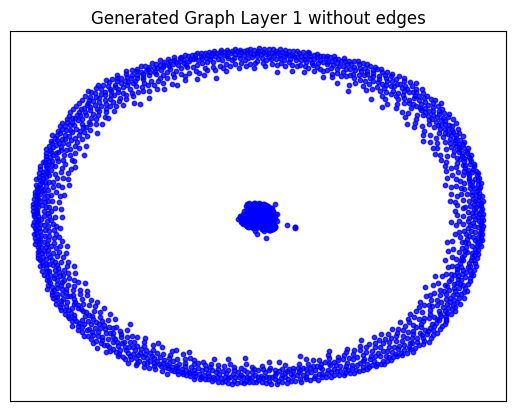

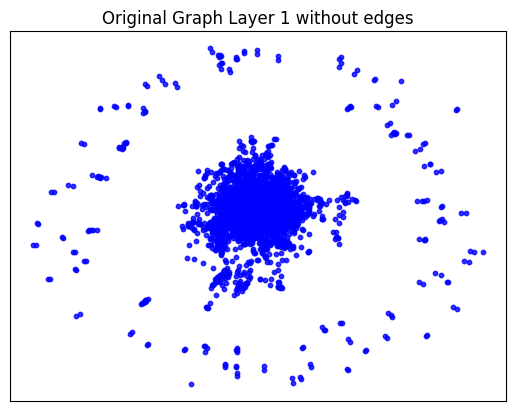

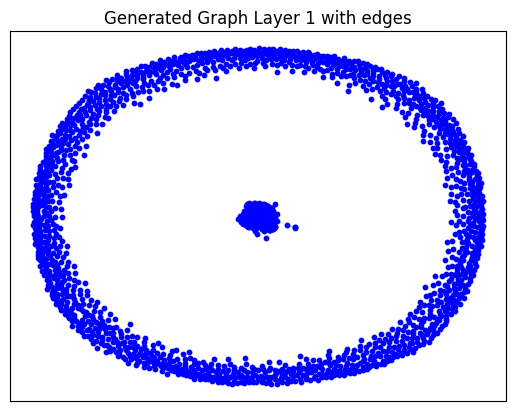

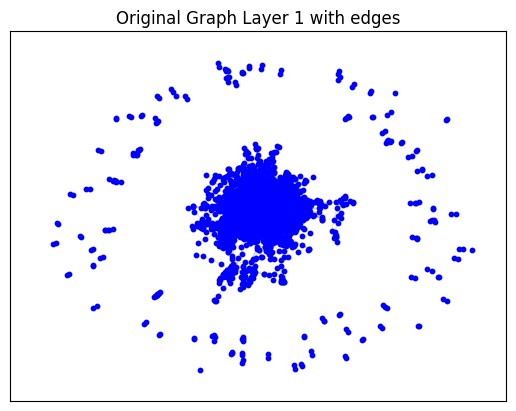

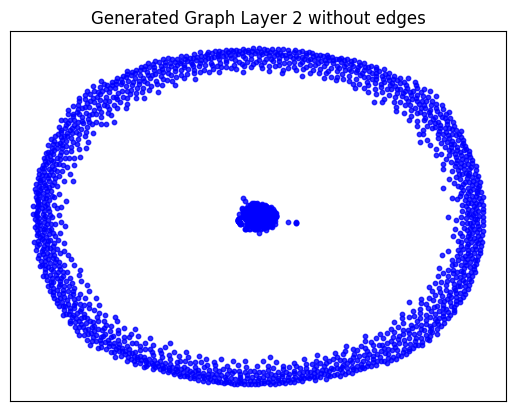

...

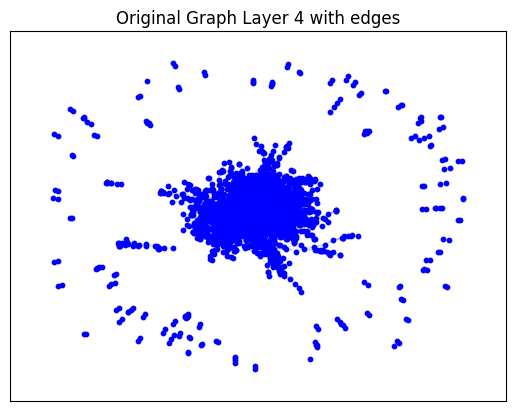

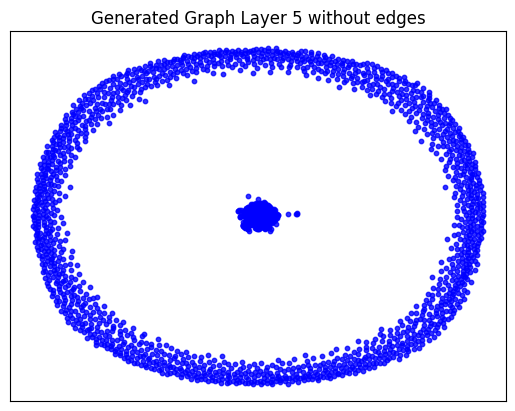

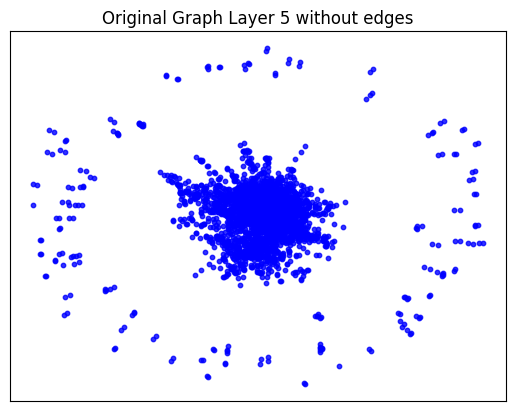

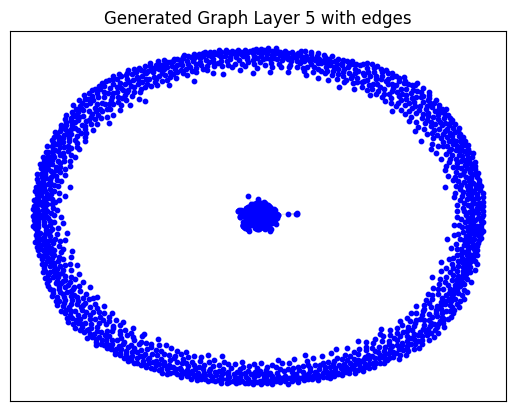

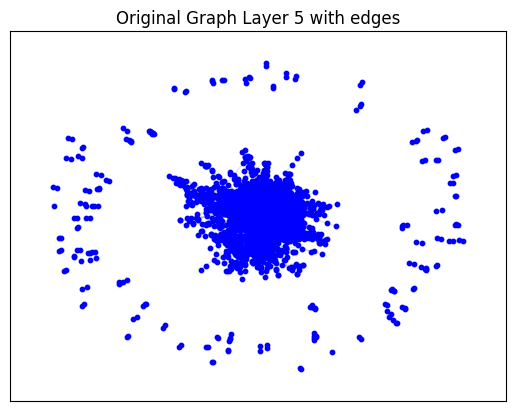

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_cora.
Flag learning_rate not found. Continuing...
Flag epochs not found. Continuing...
Flag hidden1 not found. Continuing...
Flag hidden2 not found. Continuing...
Flag weight_decay not found. Continuing...
Flag dropout not found. Continuing...
Flag filename not found. Continuing...
Flag model not found. Continuing...
Flag dataset not found. Continuing...
Flag features not found. Continuing...
Flag f not found. Continuing...


Instructions for updating:
targets is deprecated, use labels instead


GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.006153106689453125 seconds to compute statistics_degrees ---
--- 0.2663259506225586 seconds to compute statistics_LCC ---
--- 0.010721683502197266 seconds to compute statistics_wedge_count ---
--- 0.011260271072387695 seconds to compute statistics_claw_count ---
--- 0.05218958854675293 seconds to compute statistics_triangle_count ---
--- 0.007207632064819336 seconds to compute statistics_power_law_alpha ---
--- 0.006758451461791992 seconds to compute statistics_gini ---
--- 0.029512882232666016 seconds to compute statistics_edge_distribution_entropy ---
--- 0.02303600311279297 seconds to compute degree_assortativity_coefficient ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1341705322265625 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 284, 'd_min': 0, 'd': 1.792466765140325, 'LCC': 1031, 'wedge_count': 110996.0, 'claw_count': 6089576.0, 'triangle_count': 2923, 'power_law_exp': 2.410642978011807, 'gini': 0.8534534858031779, 'rel_edge_distr_entropy': 0.7461602855030767, 'assortativity': -0.31989021837404125, 'clustering_coefficient': 0.0014400017341108806, 'n_components': 1618}
Evaluation Results:
Start computing graph degree


<ipython-input-53-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-53-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  q = np.asarray(q, dtype=np.float)


KL divergence between original network and the network generated by Music_GAN: 0.2478801919066378
KL divergence between original network and the network generated by Random E-R: 5.038268753512175
KL divergence between original network and the network generated by Random B-A: 0.7635834529637299
KL divergence between original network and the network generated by GAE: 1.3225525044997068
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.0484735621870134
KL divergence between original network and the network generated by Random E-R: 1.2190435345565196
KL divergence between original network and the network generated by Random B-A: 0.9452662512987277
KL divergence between original network and the network generated by GAE: 0.19616415314682498


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

**PubMed Simulation:** <br>
The file taken from here: https://github.com/chennnM/GCNII/blob/master/data/ind.pubmed.graph <br>
Training MiscGan with the integrate G-Unets that trained with PROTEINS
<br>
We will split the dataset because of the limitation of GPU.

First batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_1.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_1'
args.filename = 'pubmed_1_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_1'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [1], Step: [0], Time: [11.0491]
Epoch: [2], Step: [0], Time: [11.2637]
Epoch: [3], Step: [0], Time: [11.4785]
Epoch: [4], Step: [0], Time: [11.6927]
Epoch: [5], Step: [0], Time: [11.9077]
Epoch: [6], Step: [0], Time: [12.1220]
Epoch: [7], Step: [0], Time: [12.3372]
Epoch: [8], Step: [0], Time: [12.5521]
Epoch: [9], Step: [0], Time: [12.7666]
Epoch: [10], Step: [0], Time: [12.9809]
Epoch: [11], Step: [0], Time: [13.1962]
Epoch: [12], Step: [0], Time: [13.4124]
Epoch: [13], Step: [0], Time: [13.6282]
Epoch: [14], Step: [0], Time: [13.8432]
Epoch: [15], Step: [0], Time: [14.0603]
Epoch: [16], Step: [0], Time: [14.2939]
Epoch: [17], Step: [0], Time: [14.5090]
Epoch: [18], Step: [0], Time: [14.7235]
Epoch: [19], Step: [0], Time: [14.9382]
Epoch: [20], Step: [0], Time: [15.1522]
Epoch: [21], Step: [0], Time: [15.3666]
Epoch: [22], Step: [0], Time: [15.5827]
Epoch: [23], Step: [0], Time: [15.7981]
Epoch: [24], Step: [0], Time: [16.0135]
Epoch: [25], Step: [0],

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6706, 6706])
Shape of feature_tensor before unpooling: torch.Size([6706, 48])
Shapes in down_outs: [torch.Size([6706, 48]), torch.Size([6035, 48]), torch.Size([4828, 48])]
Shapes in indices_list: [torch.Size([6035]), torch.Size([4828]), torch.Size([3379])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6706, 48])
Shape of indices_list[0]: torch.Size([6035])
Shape of new_h before assignment: torch.Size([6706, 48])
Shape of h_subset: torch.Size([6035, 48])
Shape of idx: torch.Size([6035])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([6035, 48])
Shape of indices_list[1]: torch.Size([4828])
Shape of new_h before assignment: torch.Size([6706, 48])
Shape of h_subset: torch.Size([4828, 48])
Shape of idx: torch.Size([4828])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4828, 48])
Shape of

<ipython-input-51-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.03638052940368652 seconds to compute statistics_degrees ---
--- 1.6150469779968262 seconds to compute statistics_LCC ---
--- 0.04796648025512695 seconds to compute statistics_wedge_count ---
--- 0.04980611801147461 seconds to compute statistics_claw_count ---
--- 0.2754991054534912 seconds to compute statistics_triangle_count ---
--- 0.03842568397521973 seconds to compute statistics_power_law_alpha ---
--- 0.03839612007141113 seconds to compute statistics_gini ---
--- 0.17836618423461914 seconds to compute statistics_edge_distribution_entropy ---
--- 0.06080126762390137 seconds to compute degree_assortativity_coefficient ---
--- 0.8125810623168945 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 125, 'd_min': 1, 'd': 2.3755406413124533, 'LCC': 5620, 'wedge_count': 72247.0, 'claw_count': 926637.0, 'triangle_count': 239, 'power_law_exp': 3.2411099164062187, 'gini': 0.

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07761693000793457 seconds to compute degree_assortativity_coefficient ---
--- 0.6815750598907471 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 95, 'd_min': 0, 'd': 2.3758389261744965, 'LCC': 1735, 'wedge_count': 248949.0, 'claw_count': 3912779.0, 'triangle_count': 4930, 'power_law_exp': 1.5134976230452588, 'gini': 0.9227487708388631, 'rel_edge_distr_entropy': 0.7411999993744551, 'assortativity': -0.11143615434751798, 'clustering_coefficient': 0.0037799221474046963, 'n_components': 4959}
Computing metrics for ER graph
--- 0.03316926956176758 seconds to compute statistics_degrees ---
--- 2.0382611751556396 seconds to compute statistics_LCC ---
--- 0.03583645820617676 seconds to compute statistics_wedge_count ---
--- 0.0367436408996582 seconds to compute statistics_claw_count ---
--- 0.4162025451660156 seconds to compute statistics_triangle_count ---
--- 0.035616397857666016 seconds to compute statisti

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.17028021812438965 seconds to compute statistics_edge_distribution_entropy ---
--- 0.07923650741577148 seconds to compute degree_assortativity_coefficient ---
--- 1.0096917152404785 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 15.0, 'd_min': 0.0, 'd': 4.751081282624907, 'LCC': 6643, 'wedge_count': 75737.0, 'claw_count': 120144.0, 'triangle_count': 19, 'power_law_exp': 1.6893657286137458, 'gini': 0.25538165593043427, 'rel_edge_distr_entropy': 0.9873915703632893, 'assortativity': -0.010499269355488698, 'clustering_coefficient': 0.0004744306831801838, 'n_components': 62}
Computing metrics for bara graph
--- 0.033539772033691406 seconds to compute statistics_degrees ---
--- 2.6844305992126465 seconds to compute statistics_LCC ---
--- 0.035732269287109375 seconds to compute statistics_wedge_count ---
--- 0.03647422790527344 seconds to compute statistics_claw_count ---
--- 34.8210027217865 seconds to comp

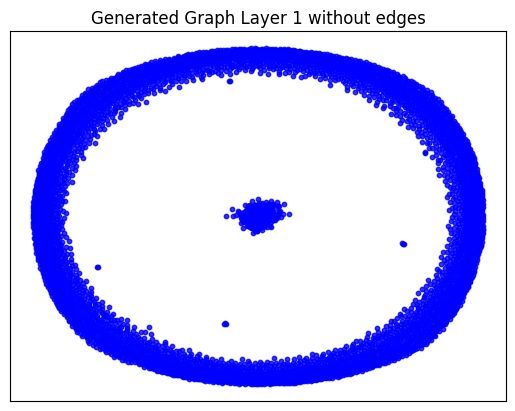

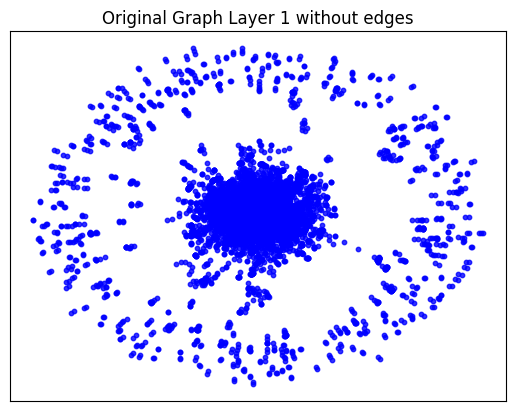

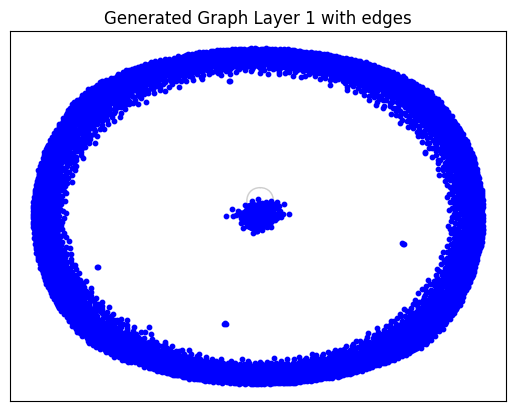

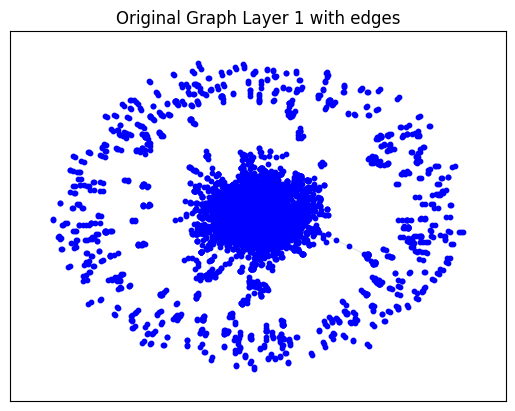

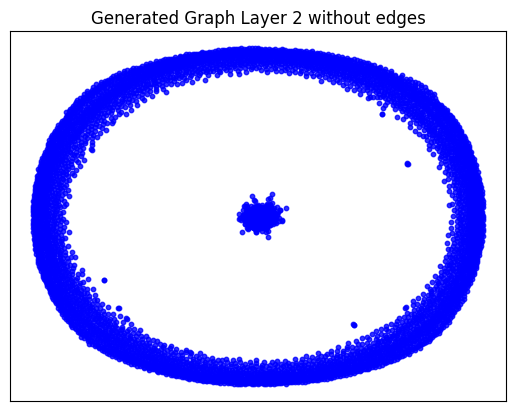

...

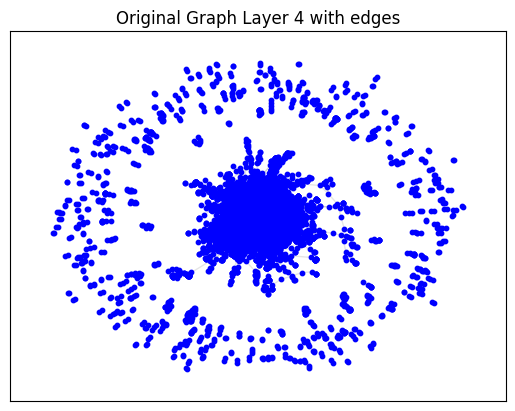

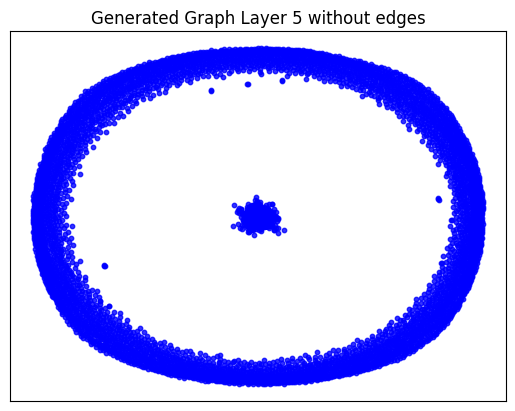

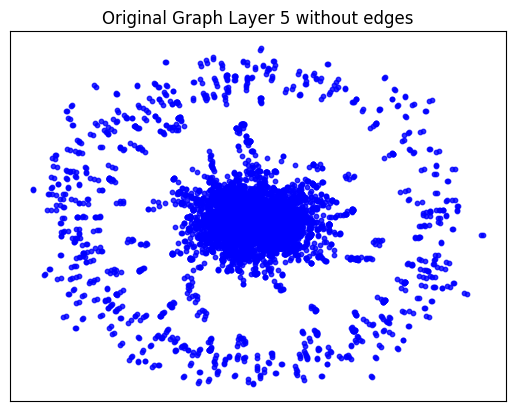

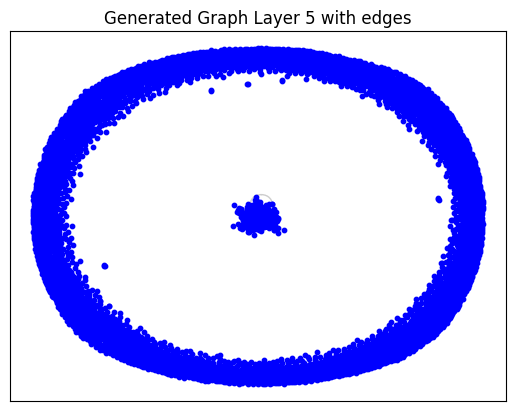

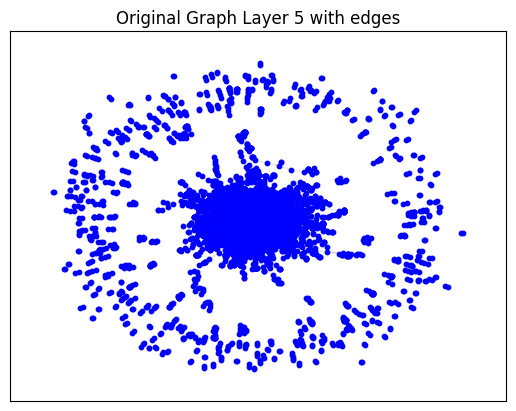

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_1.
Flag learning_rate not found. Continuing...
Flag epochs not found. Continuing...
Flag hidden1 not found. Continuing...
Flag hidden2 not found. Continuing...
Flag weight_decay not found. Continuing...
Flag dropout not found. Continuing...
Flag filename not found. Continuing...
Flag model not found. Continuing...
Flag dataset not found. Continuing...
Flag features not found. Continuing...
Flag f not found. Continuing...


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
targets is deprecated, use labels instead


GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.0353693962097168 seconds to compute statistics_degrees ---
--- 1.6279547214508057 seconds to compute statistics_LCC ---
--- 0.04704117774963379 seconds to compute statistics_wedge_count ---
--- 0.048367977142333984 seconds to compute statistics_claw_count ---
--- 0.6199648380279541 seconds to compute statistics_triangle_count ---
--- 0.038655757904052734 seconds to compute statistics_power_law_alpha ---
--- 0.03782296180725098 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1776409149169922 seconds to compute statistics_edge_distribution_entropy ---
--- 0.050165653228759766 seconds to compute degree_assortativity_coefficient ---
--- 0.8148963451385498 seconds to compute connected_components ---
--- 1.430511474609375e-06 seconds to compute statistics_cluster_props ---
{'d_max': 314, 'd_min': 0, 'd': 1.235759021771548, 'LCC': 1580, 'wedge_count': 180046.0, 'claw_count': 8684977.0, 'triangle_count': 7706, 'power_law_exp': 2.364584012574074, 'gini': 0.9256350906027071, 'rel_edge_distr_entropy': 0.7074477967453188, 'assortativity': -0.28790176326149414, 'clustering_coefficient': 0.002661837791855983, 'n_components': 5126}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 7.808430351182661e-05
KL divergence between original network and the network generated by Random E-R: 6.427211553272805
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.0010390105580574147
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 4.34380542199144
KL divergence between original network and the network generated by Random E-R: 11.863910089025422
KL divergence between original network and the network generated by Random B-A: 1.8906935176830066
KL divergence between original network and the network generated by GAE: 34.79759750605279


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Second batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_2.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_2'
args.filename = 'pubmed_2_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_2'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [1], Step: [0], Time: [10.2900]
Epoch: [2], Step: [0], Time: [10.4689]
Epoch: [3], Step: [0], Time: [10.6479]
Epoch: [4], Step: [0], Time: [10.8261]
Epoch: [5], Step: [0], Time: [11.0049]
Epoch: [6], Step: [0], Time: [11.1839]
Epoch: [7], Step: [0], Time: [11.3636]
Epoch: [8], Step: [0], Time: [11.5443]
Epoch: [9], Step: [0], Time: [11.7246]
Epoch: [10], Step: [0], Time: [11.9053]
Epoch: [11], Step: [0], Time: [12.0837]
Epoch: [12], Step: [0], Time: [12.2638]
Epoch: [13], Step: [0], Time: [12.4428]
Epoch: [14], Step: [0], Time: [12.6212]
Epoch: [15], Step: [0], Time: [12.7993]
Epoch: [16], Step: [0], Time: [12.9781]
Epoch: [17], Step: [0], Time: [13.1566]
Epoch: [18], Step: [0], Time: [13.3342]
Epoch: [19], Step: [0], Time: [13.5127]
Epoch: [20], Step: [0], Time: [13.6902]
Epoch: [21], Step: [0], Time: [13.8685]
Epoch: [22], Step: [0], Time: [14.0473]
Epoch: [23], Step: [0], Time: [14.2275]
Epoch: [24], Step: [0], Time: [14.4079]
Epoch: [25], Step: [0],

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6179, 6179])
Shape of feature_tensor before unpooling: torch.Size([6179, 48])
Shapes in down_outs: [torch.Size([6179, 48]), torch.Size([5561, 48]), torch.Size([4448, 48])]
Shapes in indices_list: [torch.Size([5561]), torch.Size([4448]), torch.Size([3113])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6179, 48])
Shape of indices_list[0]: torch.Size([5561])
Shape of new_h before assignment: torch.Size([6179, 48])
Shape of h_subset: torch.Size([5561, 48])
Shape of idx: torch.Size([5561])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5561, 48])
Shape of indices_list[1]: torch.Size([4448])
Shape of new_h before assignment: torch.Size([6179, 48])
Shape of h_subset: torch.Size([4448, 48])
Shape of idx: torch.Size([4448])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4448, 48])
Shape of

<ipython-input-51-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.029842853546142578 seconds to compute statistics_degrees ---
--- 1.2891905307769775 seconds to compute statistics_LCC ---
--- 0.040930986404418945 seconds to compute statistics_wedge_count ---
--- 0.041974782943725586 seconds to compute statistics_claw_count ---
--- 0.23809170722961426 seconds to compute statistics_triangle_count ---
--- 0.03137373924255371 seconds to compute statistics_power_law_alpha ---
--- 0.03168368339538574 seconds to compute statistics_gini ---
--- 0.1499488353729248 seconds to compute statistics_edge_distribution_entropy ---
--- 0.056276559829711914 seconds to compute degree_assortativity_coefficient ---
--- 0.6459996700286865 seconds to compute connected_components ---
--- 1.1920928955078125e-06 seconds to compute statistics_cluster_props ---
{'d_max': 121, 'd_min': 1, 'd': 2.42667529944966, 'LCC': 5083, 'wedge_count': 68270.0, 'claw_count': 838883.0, 'triangle_count': 315, 'power_law_exp': 3.1452805865076616, 'gini':

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5407116413116455 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 80, 'd_min': 0, 'd': 2.4268371641307867, 'LCC': 2056, 'wedge_count': 188121.0, 'claw_count': 2614717.0, 'triangle_count': 20928, 'power_law_exp': 1.6108003137833533, 'gini': 0.8946109997549951, 'rel_edge_distr_entropy': 0.7730204378794588, 'assortativity': -0.14523393115675454, 'clustering_coefficient': 0.02401177641786855, 'n_components': 4113}
Computing metrics for ER graph
--- 0.02803969383239746 seconds to compute statistics_degrees ---
--- 1.6596102714538574 seconds to compute statistics_LCC ---
--- 0.030034303665161133 seconds to compute statistics_wedge_count ---
--- 0.031340599060058594 seconds to compute statistics_claw_count ---
--- 0.35878801345825195 seconds to compute statistics_triangle_count ---
--- 0.02998518943786621 seconds to compute statistics_power_law_alpha ---
--- 0.029559612274169922 seconds to compute statistics_

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.143660306930542 seconds to compute statistics_edge_distribution_entropy ---
--- 0.07153153419494629 seconds to compute degree_assortativity_coefficient ---
--- 0.8267788887023926 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 14.0, 'd_min': 0.0, 'd': 4.85335059889932, 'LCC': 6122, 'wedge_count': 72331.0, 'claw_count': 115250.0, 'triangle_count': 19, 'power_law_exp': 1.6767030184567235, 'gini': 0.24955907205759553, 'rel_edge_distr_entropy': 0.9879117922175772, 'assortativity': -0.012024630428567998, 'clustering_coefficient': 0.0004945770065075922, 'n_components': 55}
Computing metrics for bara graph
--- 0.027884721755981445 seconds to compute statistics_degrees ---
--- 2.128708600997925 seconds to compute statistics_LCC ---
--- 0.03011035919189453 seconds to compute statistics_wedge_count ---
--- 0.03063058853149414 seconds to compute statistics_claw_count ---
--- 32.21317505836487 seconds to compute s

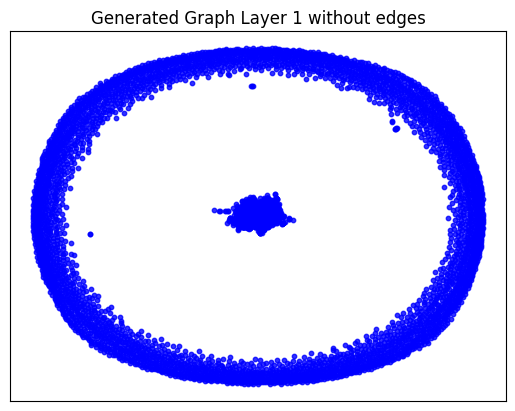

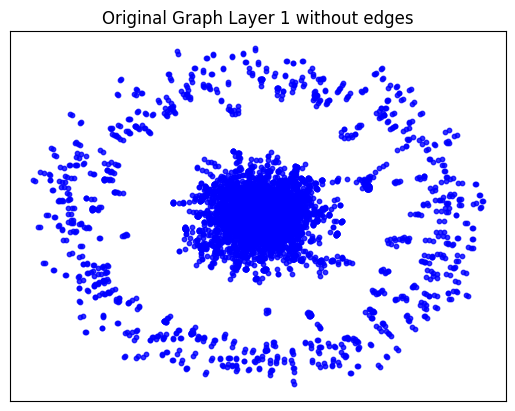

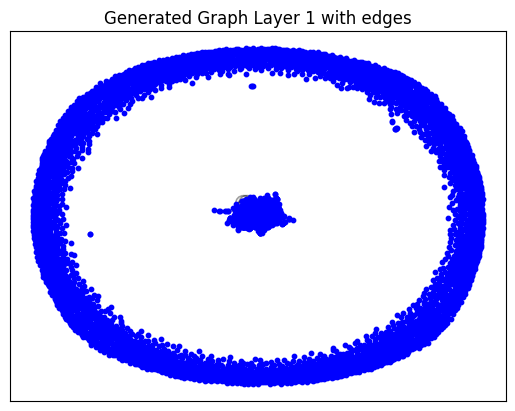

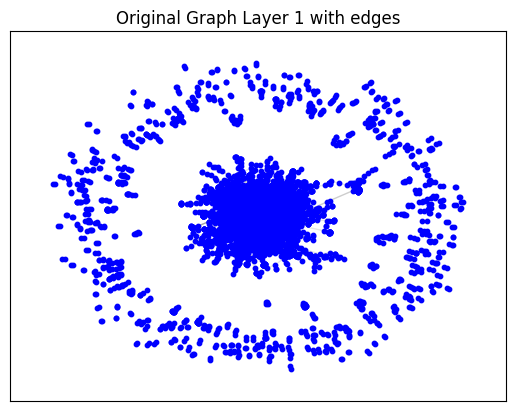

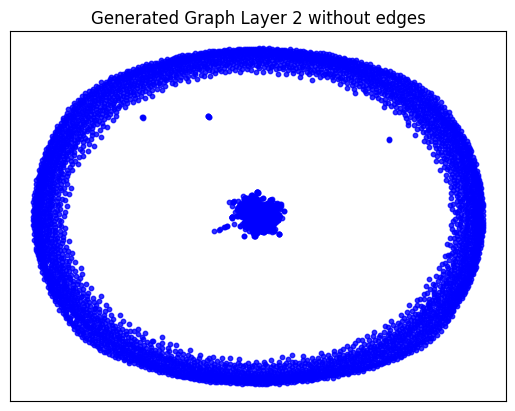

...

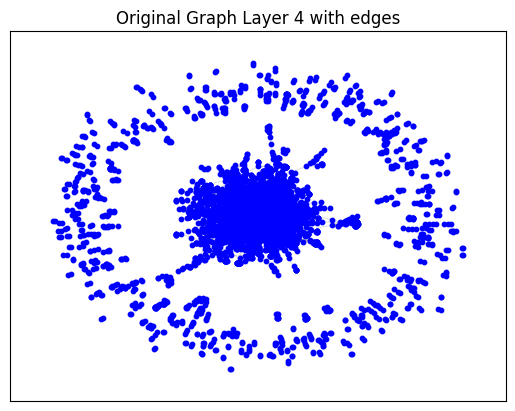

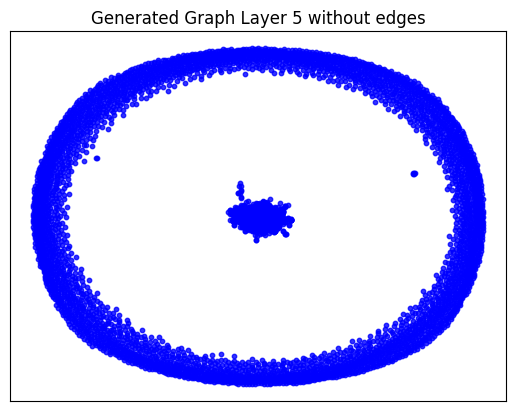

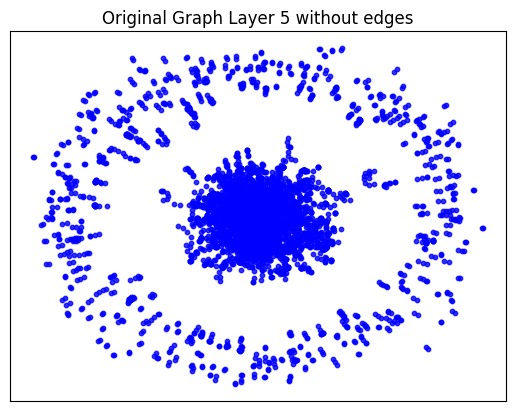

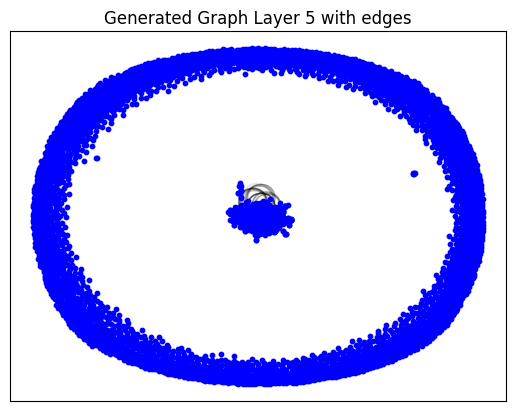

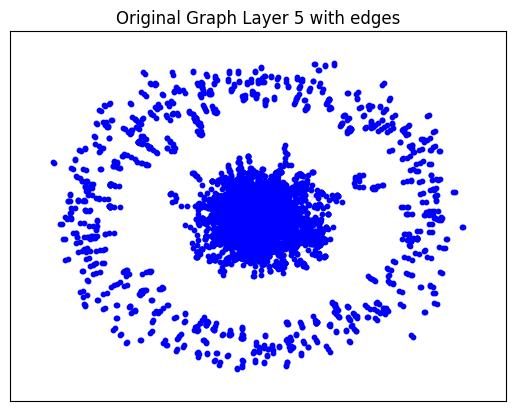

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_2.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.030404329299926758 seconds to compute statistics_degrees ---
--- 1.2814297676086426 seconds to compute statistics_LCC ---
--- 0.04210948944091797 seconds to compute statistics_wedge_count ---
--- 0.04286694526672363 seconds to compute statistics_claw_count ---
--- 0.2153794765472412 seconds to compute statistics_triangle_count ---
--- 0.03191876411437988 seconds to compute statistics_power_law_alpha ---
--- 0.03264260292053223 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.152421236038208 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04799342155456543 seconds to compute degree_assortativity_coefficient ---
--- 0.6405932903289795 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 287, 'd_min': 0, 'd': 1.266062469655284, 'LCC': 1572, 'wedge_count': 179548.0, 'claw_count': 8754898.0, 'triangle_count': 7860, 'power_law_exp': 2.4843426955281083, 'gini': 0.9208192333216731, 'rel_edge_distr_entropy': 0.7064329509385864, 'assortativity': -0.3039878523192646, 'clustering_coefficient': 0.0026933494827695308, 'n_components': 4596}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.025575419666346105
KL divergence between original network and the network generated by Random E-R: 6.16771872292523
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.0009088886205132038
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.1305981394005475
KL divergence between original network and the network generated by Random E-R: 2.935655865993934
KL divergence between original network and the network generated by Random B-A: 2.112956992043959
KL divergence between original network and the network generated by GAE: 31.69442058699412


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Third batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_3.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_3'
args.filename = 'pubmed_3_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_3'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [1], Step: [0], Time: [10.3567]
Epoch: [2], Step: [0], Time: [10.7012]
Epoch: [3], Step: [0], Time: [11.0461]
Epoch: [4], Step: [0], Time: [11.3904]
Epoch: [5], Step: [0], Time: [11.7352]
Epoch: [6], Step: [0], Time: [12.0797]
Epoch: [7], Step: [0], Time: [12.4231]
Epoch: [8], Step: [0], Time: [12.7672]
Epoch: [9], Step: [0], Time: [13.1101]
Epoch: [10], Step: [0], Time: [13.4532]
Epoch: [11], Step: [0], Time: [13.7968]
Epoch: [12], Step: [0], Time: [14.1413]
Epoch: [13], Step: [0], Time: [14.4848]
Epoch: [14], Step: [0], Time: [14.8289]
Epoch: [15], Step: [0], Time: [15.1738]
Epoch: [16], Step: [0], Time: [15.5183]
Epoch: [17], Step: [0], Time: [15.8623]
Epoch: [18], Step: [0], Time: [16.2059]
Epoch: [19], Step: [0], Time: [16.5502]
Epoch: [20], Step: [0], Time: [16.8944]
Epoch: [21], Step: [0], Time: [17.2381]
Epoch: [22], Step: [0], Time: [17.5813]
Epoch: [23], Step: [0], Time: [17.9253]
Epoch: [24], Step: [0], Time: [18.2685]
Epoch: [25], Step: [0],

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6249, 6249])
Shape of feature_tensor before unpooling: torch.Size([6249, 48])
Shapes in down_outs: [torch.Size([6249, 48]), torch.Size([5624, 48]), torch.Size([4499, 48])]
Shapes in indices_list: [torch.Size([5624]), torch.Size([4499]), torch.Size([3149])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6249, 48])
Shape of indices_list[0]: torch.Size([5624])
Shape of new_h before assignment: torch.Size([6249, 48])
Shape of h_subset: torch.Size([5624, 48])
Shape of idx: torch.Size([5624])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5624, 48])
Shape of indices_list[1]: torch.Size([4499])
Shape of new_h before assignment: torch.Size([6249, 48])
Shape of h_subset: torch.Size([4499, 48])
Shape of idx: torch.Size([4499])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4499, 48])
Shape of

<ipython-input-51-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.031072616577148438 seconds to compute statistics_degrees ---
--- 1.3127660751342773 seconds to compute statistics_LCC ---
--- 0.041216135025024414 seconds to compute statistics_wedge_count ---
--- 0.041758060455322266 seconds to compute statistics_claw_count ---
--- 0.242995023727417 seconds to compute statistics_triangle_count ---
--- 0.03149676322937012 seconds to compute statistics_power_law_alpha ---
--- 0.03143763542175293 seconds to compute statistics_gini ---
--- 0.15155982971191406 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05472612380981445 seconds to compute degree_assortativity_coefficient ---
--- 0.6551012992858887 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 67, 'd_min': 1, 'd': 2.3970870678617158, 'LCC': 5101, 'wedge_count': 61532.0, 'claw_count': 513132.0, 'triangle_count': 269, 'power_law_exp': 3.196356649714029, 'gini': 0.

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5312440395355225 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 123, 'd_min': 0, 'd': 2.3994878361075545, 'LCC': 2182, 'wedge_count': 248518.0, 'claw_count': 4823272.0, 'triangle_count': 34984, 'power_law_exp': 1.6284749952926627, 'gini': 0.9102803185172936, 'rel_edge_distr_entropy': 0.7522185062913315, 'assortativity': 0.14240465315208312, 'clustering_coefficient': 0.021759502677850224, 'n_components': 3949}
Computing metrics for ER graph
--- 0.029138565063476562 seconds to compute statistics_degrees ---
--- 1.692307949066162 seconds to compute statistics_LCC ---
--- 0.031346797943115234 seconds to compute statistics_wedge_count ---
--- 0.03308224678039551 seconds to compute statistics_claw_count ---
--- 0.3787238597869873 seconds to compute statistics_triangle_count ---
--- 0.03219199180603027 seconds to compute statistics_power_law_alpha ---
--- 0.03149008750915527 seconds to compute statistics_gini

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15105986595153809 seconds to compute statistics_edge_distribution_entropy ---
--- 0.07591652870178223 seconds to compute degree_assortativity_coefficient ---
--- 0.8839364051818848 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 15.0, 'd_min': 0.0, 'd': 4.7941741357234315, 'LCC': 6188, 'wedge_count': 71783.0, 'claw_count': 114564.0, 'triangle_count': 19, 'power_law_exp': 1.6847382076574924, 'gini': 0.25373142574482754, 'rel_edge_distr_entropy': 0.9874546143713004, 'assortativity': 0.00016130009465430167, 'clustering_coefficient': 0.0004975384937676757, 'n_components': 58}
Computing metrics for bara graph
--- 0.029343128204345703 seconds to compute statistics_degrees ---
--- 2.1564176082611084 seconds to compute statistics_LCC ---
--- 0.030228614807128906 seconds to compute statistics_wedge_count ---
--- 0.031723976135253906 seconds to compute statistics_claw_count ---
--- 31.90762209892273 seconds to c

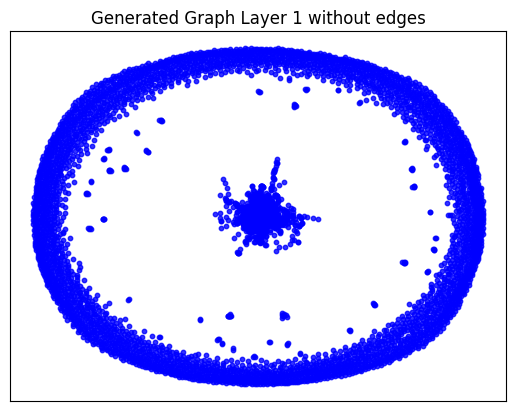

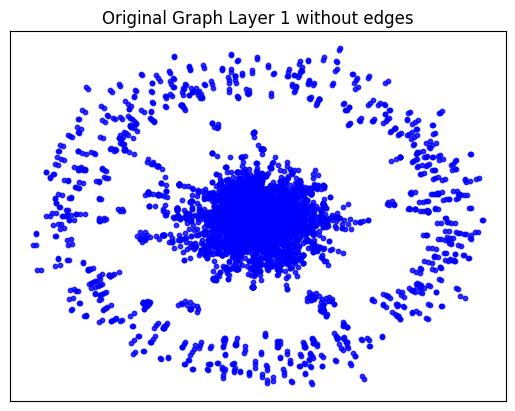

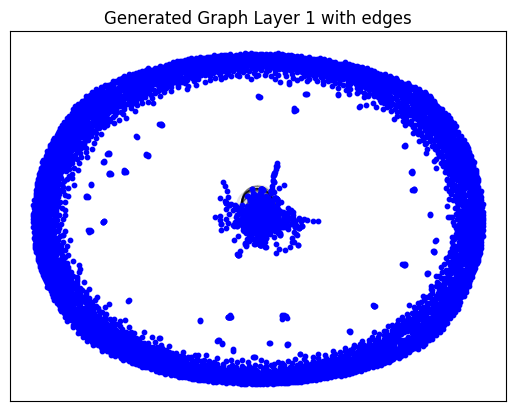

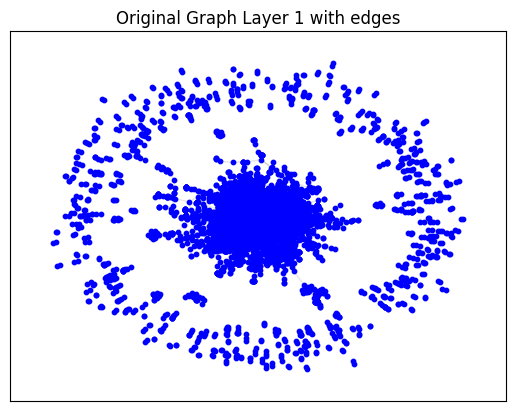

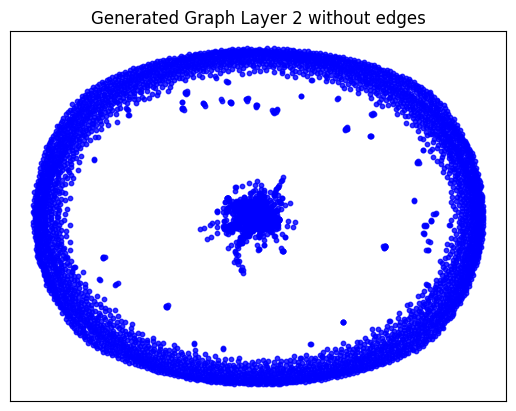

...

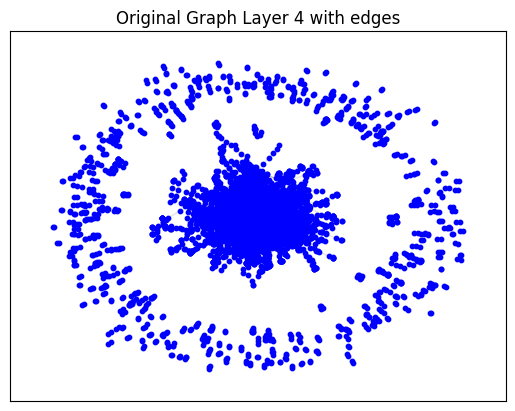

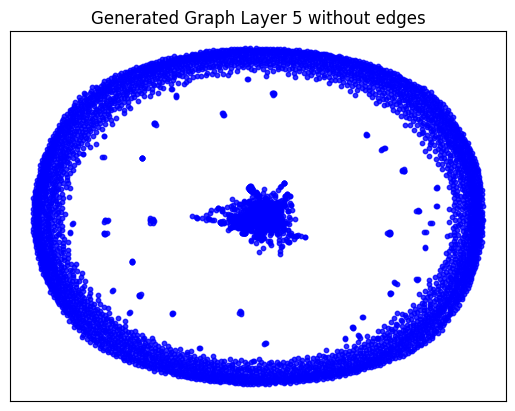

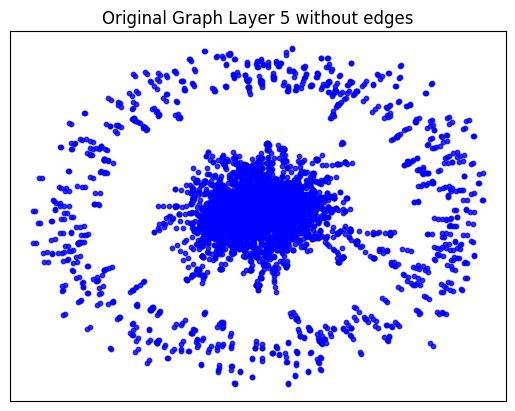

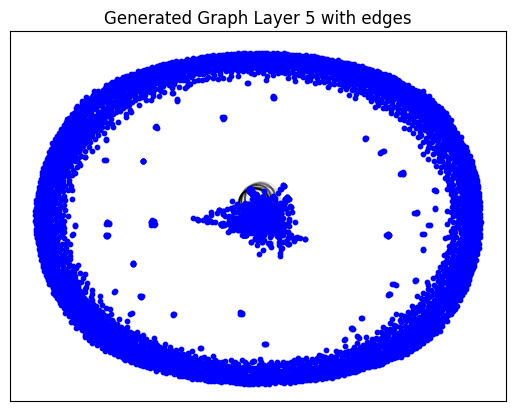

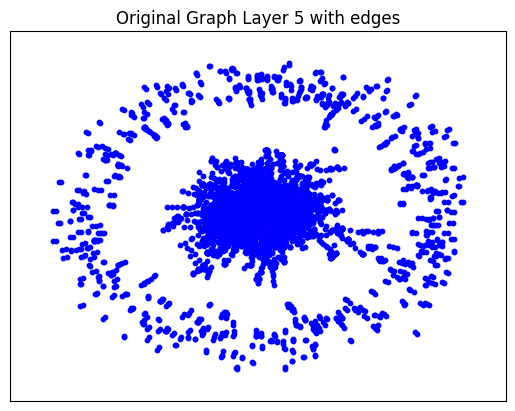

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_3.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.03153061866760254 seconds to compute statistics_degrees ---
--- 1.3156991004943848 seconds to compute statistics_LCC ---
--- 0.04253411293029785 seconds to compute statistics_wedge_count ---
--- 0.04385185241699219 seconds to compute statistics_claw_count ---
--- 0.22118663787841797 seconds to compute statistics_triangle_count ---
--- 0.03272604942321777 seconds to compute statistics_power_law_alpha ---
--- 0.03319382667541504 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15430164337158203 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0557401180267334 seconds to compute degree_assortativity_coefficient ---
--- 0.6562082767486572 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 115, 'd_min': 0, 'd': 1.247559609537526, 'LCC': 1099, 'wedge_count': 131620.0, 'claw_count': 2730721.0, 'triangle_count': 11856, 'power_law_exp': 2.0298908184563658, 'gini': 0.9451252580094704, 'rel_edge_distr_entropy': 0.6887451106009724, 'assortativity': -0.318329579471986, 'clustering_coefficient': 0.01302513145795561, 'n_components': 5150}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.14266605068217408
KL divergence between original network and the network generated by Random E-R: 5.175229959037314
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.3720603569995001
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.397863659532281
KL divergence between original network and the network generated by Random E-R: 3.4680463448486467
KL divergence between original network and the network generated by Random B-A: 1.8783259294334038
KL divergence between original network and the network generated by GAE: 34.60937083322126


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Fourth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_4.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_4'
args.filename = 'pubmed_4_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_4'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [1], Step: [0], Time: [11.5678]
Epoch: [2], Step: [0], Time: [11.9266]
Epoch: [3], Step: [0], Time: [12.2852]
Epoch: [4], Step: [0], Time: [12.6444]
Epoch: [5], Step: [0], Time: [13.0032]
Epoch: [6], Step: [0], Time: [13.3625]
Epoch: [7], Step: [0], Time: [13.7208]
Epoch: [8], Step: [0], Time: [14.0788]
Epoch: [9], Step: [0], Time: [14.4395]
Epoch: [10], Step: [0], Time: [14.7996]
Epoch: [11], Step: [0], Time: [15.1585]
Epoch: [12], Step: [0], Time: [15.5177]
Epoch: [13], Step: [0], Time: [15.9087]
Epoch: [14], Step: [0], Time: [16.2679]
Epoch: [15], Step: [0], Time: [16.6275]
Epoch: [16], Step: [0], Time: [16.9858]
Epoch: [17], Step: [0], Time: [17.3460]
Epoch: [18], Step: [0], Time: [17.7055]
Epoch: [19], Step: [0], Time: [18.0641]
Epoch: [20], Step: [0], Time: [18.4230]
Epoch: [21], Step: [0], Time: [18.7813]
Epoch: [22], Step: [0], Time: [19.1399]
Epoch: [23], Step: [0], Time: [19.4985]
Epoch: [24], Step: [0], Time: [19.8580]
Epoch: [25], Step: [0],

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6377, 6377])
Shape of feature_tensor before unpooling: torch.Size([6377, 48])
Shapes in down_outs: [torch.Size([6377, 48]), torch.Size([5739, 48]), torch.Size([4591, 48])]
Shapes in indices_list: [torch.Size([5739]), torch.Size([4591]), torch.Size([3213])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6377, 48])
Shape of indices_list[0]: torch.Size([5739])
Shape of new_h before assignment: torch.Size([6377, 48])
Shape of h_subset: torch.Size([5739, 48])
Shape of idx: torch.Size([5739])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5739, 48])
Shape of indices_list[1]: torch.Size([4591])
Shape of new_h before assignment: torch.Size([6377, 48])
Shape of h_subset: torch.Size([4591, 48])
Shape of idx: torch.Size([4591])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4591, 48])
Shape of

<ipython-input-51-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.03178000450134277 seconds to compute statistics_degrees ---
--- 1.3997390270233154 seconds to compute statistics_LCC ---
--- 0.04280281066894531 seconds to compute statistics_wedge_count ---
--- 0.04369497299194336 seconds to compute statistics_claw_count ---
--- 0.25043463706970215 seconds to compute statistics_triangle_count ---
--- 0.033420562744140625 seconds to compute statistics_power_law_alpha ---
--- 0.033124446868896484 seconds to compute statistics_gini ---
--- 0.15855073928833008 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05769515037536621 seconds to compute degree_assortativity_coefficient ---
--- 0.681067943572998 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 77, 'd_min': 1, 'd': 2.363393977415307, 'LCC': 5306, 'wedge_count': 62382.0, 'claw_count': 599389.0, 'triangle_count': 226, 'power_law_exp': 3.210872721331903, 'gini': 0.4

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.0740654468536377 seconds to compute degree_assortativity_coefficient ---
--- 0.5749080181121826 seconds to compute connected_components ---
--- 1.1920928955078125e-06 seconds to compute statistics_cluster_props ---
{'d_max': 139, 'd_min': 0, 'd': 2.3651191969887075, 'LCC': 1697, 'wedge_count': 304261.0, 'claw_count': 6432338.0, 'triangle_count': 1946, 'power_law_exp': 1.526247328543017, 'gini': 0.9382652827745956, 'rel_edge_distr_entropy': 0.7140943398732215, 'assortativity': -0.19423273644311767, 'clustering_coefficient': 0.0009076015594951634, 'n_components': 4632}
Computing metrics for ER graph
--- 0.030602455139160156 seconds to compute statistics_degrees ---
--- 1.8536267280578613 seconds to compute statistics_LCC ---
--- 0.03220391273498535 seconds to compute statistics_wedge_count ---
--- 0.032624006271362305 seconds to compute statistics_claw_count ---
--- 0.38259172439575195 seconds to compute statistics_triangle_count ---
--- 0.03187084197998047 seconds to compute stati

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15401840209960938 seconds to compute statistics_edge_distribution_entropy ---
--- 0.07616138458251953 seconds to compute degree_assortativity_coefficient ---
--- 0.8801414966583252 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 13.0, 'd_min': 0.0, 'd': 4.726787954830614, 'LCC': 6320, 'wedge_count': 70811.0, 'claw_count': 110264.0, 'triangle_count': 14, 'power_law_exp': 1.6900265167243766, 'gini': 0.2521934754666386, 'rel_edge_distr_entropy': 0.9876602245362062, 'assortativity': -0.0036919058220131395, 'clustering_coefficient': 0.0003809040121889284, 'n_components': 57}
Computing metrics for bara graph
--- 0.029943227767944336 seconds to compute statistics_degrees ---
--- 2.235452175140381 seconds to compute statistics_LCC ---
--- 0.03244590759277344 seconds to compute statistics_wedge_count ---
--- 0.03352928161621094 seconds to compute statistics_claw_count ---
--- 32.85282778739929 seconds to compu

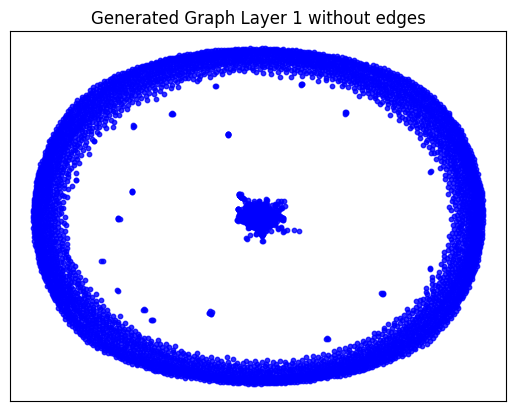

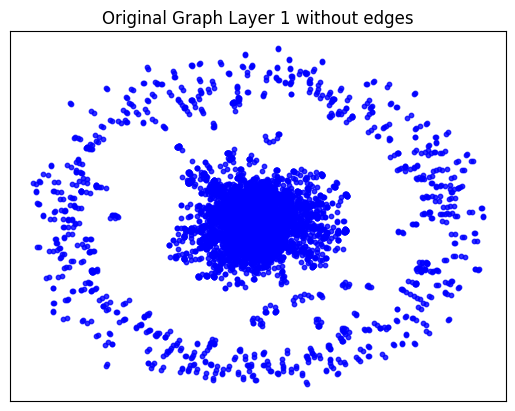

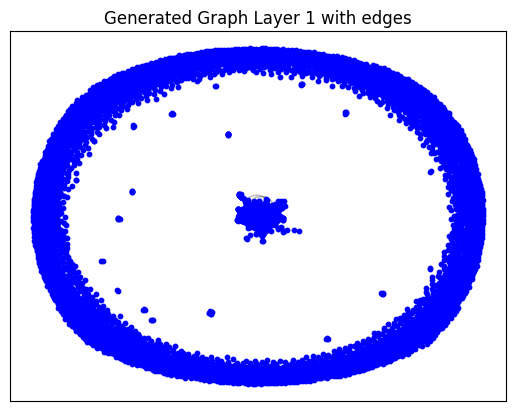

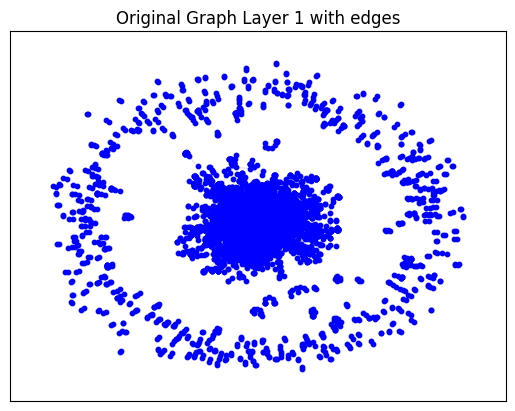

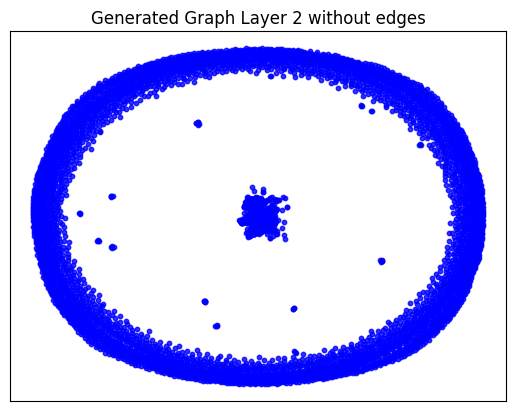

...

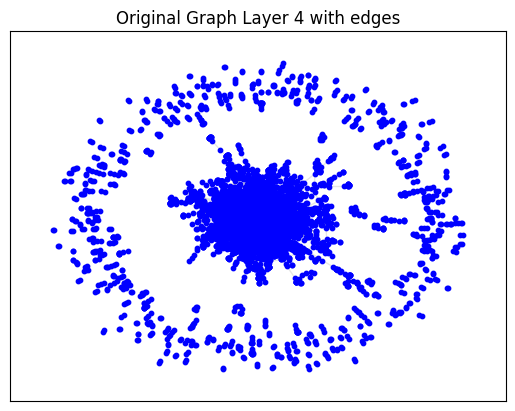

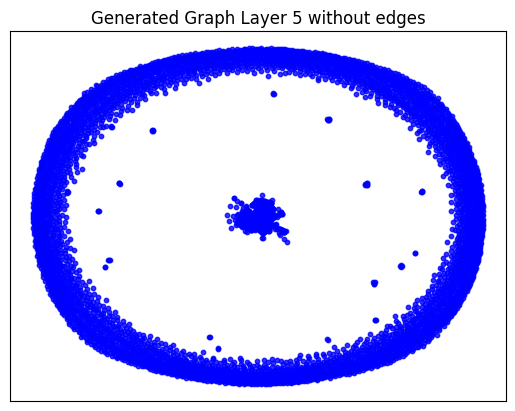

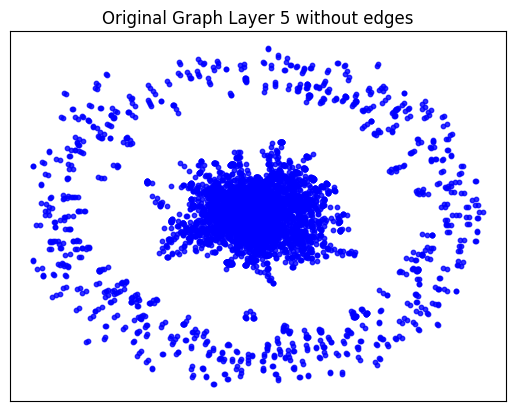

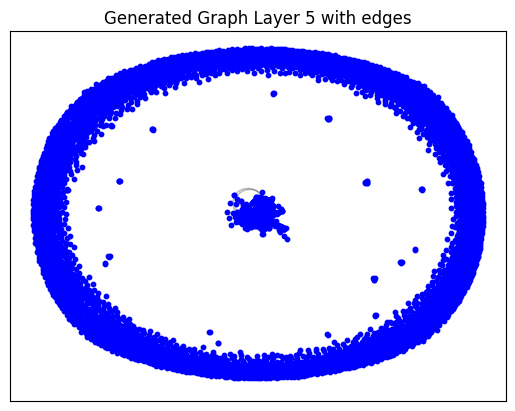

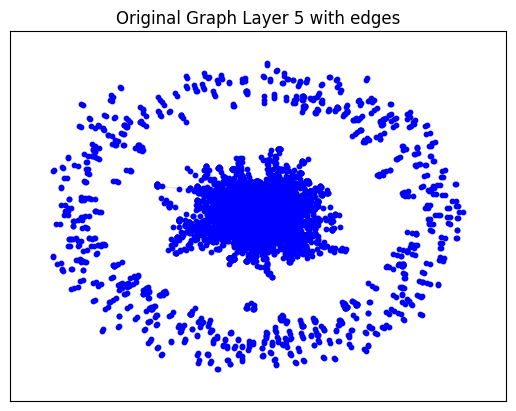

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_4.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.0330660343170166 seconds to compute statistics_degrees ---
--- 1.3620715141296387 seconds to compute statistics_LCC ---
--- 0.04438018798828125 seconds to compute statistics_wedge_count ---
--- 0.044797658920288086 seconds to compute statistics_claw_count ---
--- 0.2275693416595459 seconds to compute statistics_triangle_count ---
--- 0.03409552574157715 seconds to compute statistics_power_law_alpha ---
--- 0.03421759605407715 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1612224578857422 seconds to compute statistics_edge_distribution_entropy ---
--- 0.049192190170288086 seconds to compute degree_assortativity_coefficient ---
--- 0.6763825416564941 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 200, 'd_min': 0, 'd': 1.228163713344833, 'LCC': 1210, 'wedge_count': 149218.0, 'claw_count': 4563258.0, 'triangle_count': 11208, 'power_law_exp': 2.0894230304396255, 'gini': 0.9402619667238126, 'rel_edge_distr_entropy': 0.6921577110251071, 'assortativity': -0.3015522536860476, 'clustering_coefficient': 0.007368419668578897, 'n_components': 5166}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.47361602075074516
KL divergence between original network and the network generated by Random E-R: 5.462268292770476
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 2.0668717023505865
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.8526314047156682
KL divergence between original network and the network generated by Random E-R: 12.566285802207801
KL divergence between original network and the network generated by Random B-A: 2.035700185203284
KL divergence between original network and the network generated by GAE: 47.447751109227184


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Fifth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_5.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_5'
args.filename = 'pubmed_5_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_5'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [1], Step: [0], Time: [7.2158]
Epoch: [2], Step: [0], Time: [7.5603]
Epoch: [3], Step: [0], Time: [7.9036]
Epoch: [4], Step: [0], Time: [8.2473]
Epoch: [5], Step: [0], Time: [8.5914]
Epoch: [6], Step: [0], Time: [8.9355]
Epoch: [7], Step: [0], Time: [9.2785]
Epoch: [8], Step: [0], Time: [9.6220]
Epoch: [9], Step: [0], Time: [9.9655]
Epoch: [10], Step: [0], Time: [10.3094]
Epoch: [11], Step: [0], Time: [10.6536]
Epoch: [12], Step: [0], Time: [10.9969]
Epoch: [13], Step: [0], Time: [11.3409]
Epoch: [14], Step: [0], Time: [11.6848]
Epoch: [15], Step: [0], Time: [12.0279]
Epoch: [16], Step: [0], Time: [12.3715]
Epoch: [17], Step: [0], Time: [12.7146]
Epoch: [18], Step: [0], Time: [13.0577]
Epoch: [19], Step: [0], Time: [13.4012]
Epoch: [20], Step: [0], Time: [13.7452]
Epoch: [21], Step: [0], Time: [14.0887]
Epoch: [22], Step: [0], Time: [14.4321]
Epoch: [23], Step: [0], Time: [14.7754]
Epoch: [24], Step: [0], Time: [15.1186]
Epoch: [25], Step: [0], Time: [1

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6249, 6249])
Shape of feature_tensor before unpooling: torch.Size([6249, 48])
Shapes in down_outs: [torch.Size([6249, 48]), torch.Size([5624, 48]), torch.Size([4499, 48])]
Shapes in indices_list: [torch.Size([5624]), torch.Size([4499]), torch.Size([3149])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6249, 48])
Shape of indices_list[0]: torch.Size([5624])
Shape of new_h before assignment: torch.Size([6249, 48])
Shape of h_subset: torch.Size([5624, 48])
Shape of idx: torch.Size([5624])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5624, 48])
Shape of indices_list[1]: torch.Size([4499])
Shape of new_h before assignment: torch.Size([6249, 48])
Shape of h_subset: torch.Size([4499, 48])
Shape of idx: torch.Size([4499])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4499, 48])
Shape of

<ipython-input-51-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.030733585357666016 seconds to compute statistics_degrees ---
--- 1.3436846733093262 seconds to compute statistics_LCC ---
--- 0.04129791259765625 seconds to compute statistics_wedge_count ---
--- 0.0426936149597168 seconds to compute statistics_claw_count ---
--- 0.24487733840942383 seconds to compute statistics_triangle_count ---
--- 0.03258943557739258 seconds to compute statistics_power_law_alpha ---
--- 0.03201913833618164 seconds to compute statistics_gini ---
--- 0.15331578254699707 seconds to compute statistics_edge_distribution_entropy ---
--- 0.057123661041259766 seconds to compute degree_assortativity_coefficient ---
--- 0.6693763732910156 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 72, 'd_min': 1, 'd': 2.399807938540333, 'LCC': 5123, 'wedge_count': 66593.0, 'claw_count': 613491.0, 'triangle_count': 387, 'power_law_exp': 3.2149085473681556, 'gini': 0.

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5723202228546143 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 106, 'd_min': 0, 'd': 2.399967989756722, 'LCC': 2220, 'wedge_count': 221935.0, 'claw_count': 3971501.0, 'triangle_count': 2927, 'power_law_exp': 1.6743079665553287, 'gini': 0.9000082720702034, 'rel_edge_distr_entropy': 0.7649743928828336, 'assortativity': -0.05615184956024641, 'clustering_coefficient': 0.002211002842502117, 'n_components': 3977}
Computing metrics for ER graph
--- 0.028179645538330078 seconds to compute statistics_degrees ---
--- 1.7706260681152344 seconds to compute statistics_LCC ---
--- 0.030614852905273438 seconds to compute statistics_wedge_count ---
--- 0.03107166290283203 seconds to compute statistics_claw_count ---
--- 0.36417627334594727 seconds to compute statistics_triangle_count ---
--- 0.03100728988647461 seconds to compute statistics_power_law_alpha ---
--- 0.03035759925842285 seconds to compute statistics_gi

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14660120010375977 seconds to compute statistics_edge_distribution_entropy ---
--- 0.07320499420166016 seconds to compute degree_assortativity_coefficient ---
--- 0.8871457576751709 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 16.0, 'd_min': 0.0, 'd': 4.799615877080666, 'LCC': 6197, 'wedge_count': 72090.0, 'claw_count': 116168.0, 'triangle_count': 13, 'power_law_exp': 1.6841781759644827, 'gini': 0.25429628744370136, 'rel_edge_distr_entropy': 0.9874563276071705, 'assortativity': -0.01212557568545555, 'clustering_coefficient': 0.0003357206803939123, 'n_components': 52}
Computing metrics for bara graph
--- 0.028560161590576172 seconds to compute statistics_degrees ---
--- 2.1924681663513184 seconds to compute statistics_LCC ---
--- 0.03110480308532715 seconds to compute statistics_wedge_count ---
--- 0.03208661079406738 seconds to compute statistics_claw_count ---
--- 31.601128339767456 seconds to comp

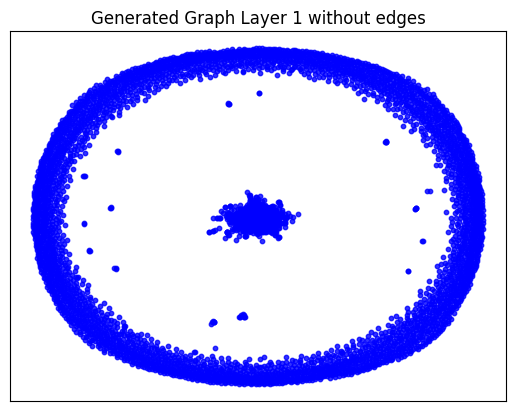

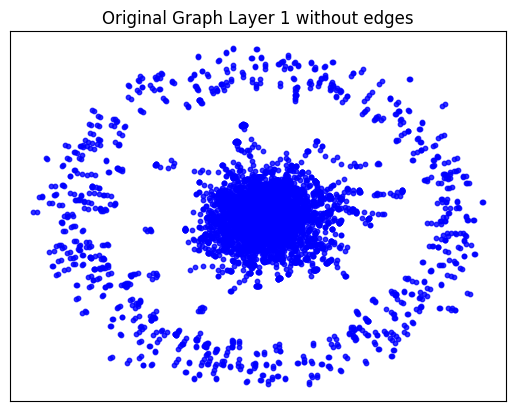

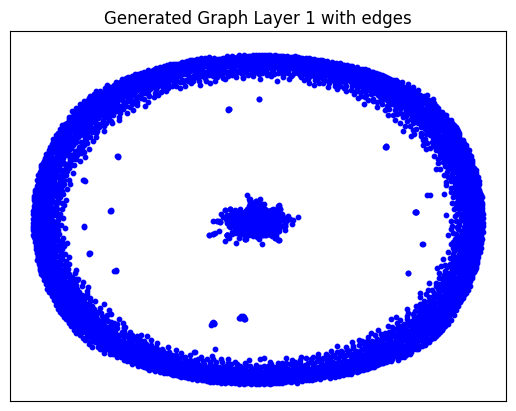

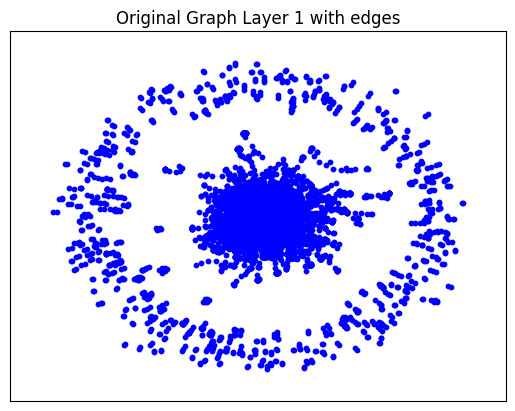

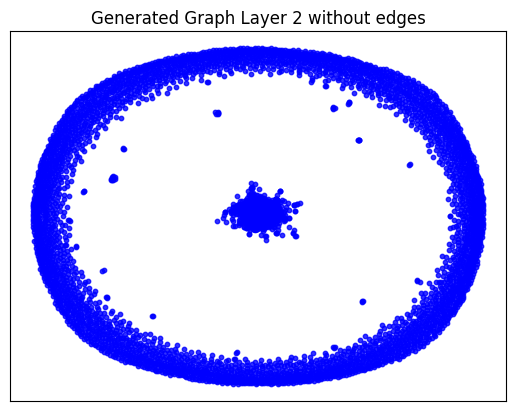

...

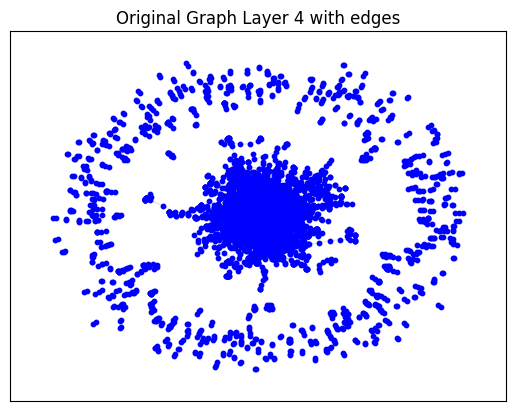

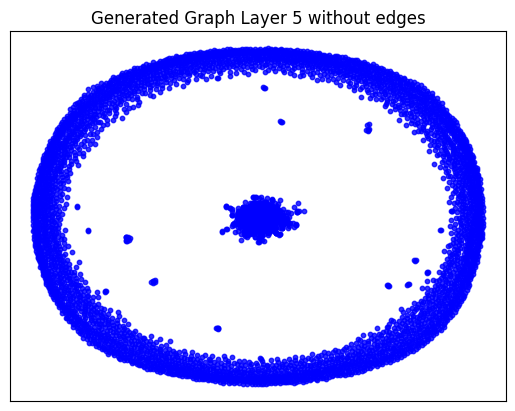

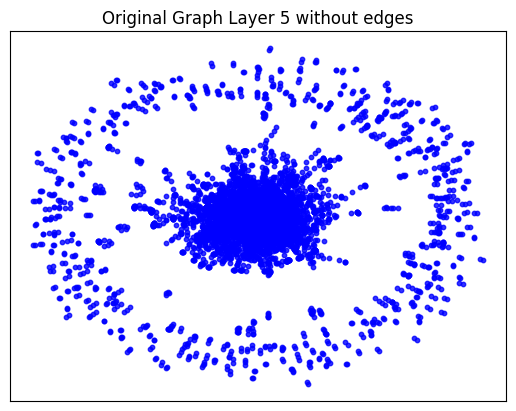

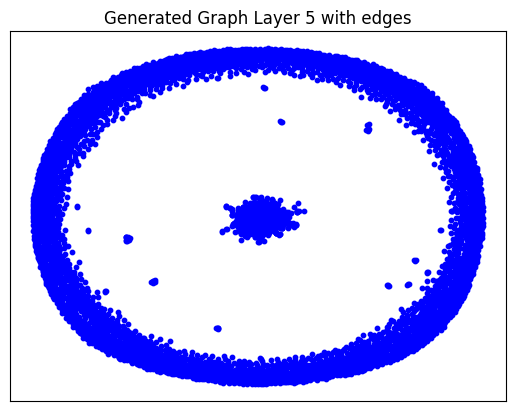

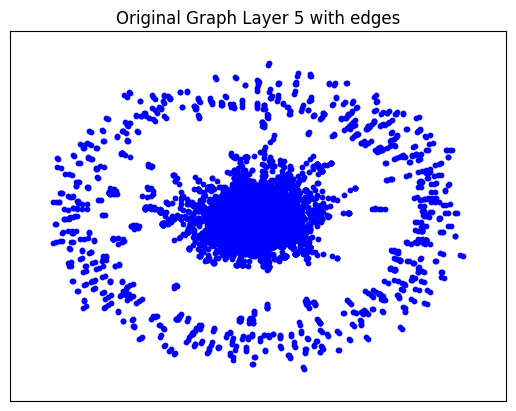

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_5.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.032482147216796875 seconds to compute statistics_degrees ---
--- 1.3132750988006592 seconds to compute statistics_LCC ---
--- 0.04267525672912598 seconds to compute statistics_wedge_count ---
--- 0.044317007064819336 seconds to compute statistics_claw_count ---
--- 0.22140812873840332 seconds to compute statistics_triangle_count ---
--- 0.03263974189758301 seconds to compute statistics_power_law_alpha ---
--- 0.03294110298156738 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15397357940673828 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05620551109313965 seconds to compute degree_assortativity_coefficient ---
--- 0.6562063694000244 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 236, 'd_min': 0, 'd': 1.250760121619459, 'LCC': 1120, 'wedge_count': 158349.0, 'claw_count': 5077108.0, 'triangle_count': 13034, 'power_law_exp': 2.0522562116231553, 'gini': 0.9449390715206347, 'rel_edge_distr_entropy': 0.6837991570839227, 'assortativity': -0.2775284642694495, 'clustering_coefficient': 0.007701628564923181, 'n_components': 5125}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 5.131804738135191
KL divergence between original network and the network generated by Random E-R: 5.207366301172057
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 4.62734814162299
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 4.369441222653826
KL divergence between original network and the network generated by Random E-R: 10.006501696703507
KL divergence between original network and the network generated by Random B-A: 1.9706137414234932
KL divergence between original network and the network generated by GAE: 29.440858213391664


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Sixth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_6.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_6'
args.filename = 'pubmed_6_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_6'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [1], Step: [0], Time: [10.4409]
Epoch: [2], Step: [0], Time: [10.7799]
Epoch: [3], Step: [0], Time: [11.1189]
Epoch: [4], Step: [0], Time: [11.4672]
Epoch: [5], Step: [0], Time: [11.8053]
Epoch: [6], Step: [0], Time: [12.1444]
Epoch: [7], Step: [0], Time: [12.4821]
Epoch: [8], Step: [0], Time: [12.8206]
Epoch: [9], Step: [0], Time: [13.1583]
Epoch: [10], Step: [0], Time: [13.4959]
Epoch: [11], Step: [0], Time: [13.8335]
Epoch: [12], Step: [0], Time: [14.1717]
Epoch: [13], Step: [0], Time: [14.5098]
Epoch: [14], Step: [0], Time: [14.8485]
Epoch: [15], Step: [0], Time: [15.1870]
Epoch: [16], Step: [0], Time: [15.5249]
Epoch: [17], Step: [0], Time: [15.8628]
Epoch: [18], Step: [0], Time: [16.2003]
Epoch: [19], Step: [0], Time: [16.5382]
Epoch: [20], Step: [0], Time: [16.8760]
Epoch: [21], Step: [0], Time: [17.2138]
Epoch: [22], Step: [0], Time: [17.5514]
Epoch: [23], Step: [0], Time: [17.8896]
Epoch: [24], Step: [0], Time: [18.2282]
Epoch: [25], Step: [0],

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6131, 6131])
Shape of feature_tensor before unpooling: torch.Size([6131, 48])
Shapes in down_outs: [torch.Size([6131, 48]), torch.Size([5517, 48]), torch.Size([4413, 48])]
Shapes in indices_list: [torch.Size([5517]), torch.Size([4413]), torch.Size([3089])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6131, 48])
Shape of indices_list[0]: torch.Size([5517])
Shape of new_h before assignment: torch.Size([6131, 48])
Shape of h_subset: torch.Size([5517, 48])
Shape of idx: torch.Size([5517])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5517, 48])
Shape of indices_list[1]: torch.Size([4413])
Shape of new_h before assignment: torch.Size([6131, 48])
Shape of h_subset: torch.Size([4413, 48])
Shape of idx: torch.Size([4413])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4413, 48])
Shape of

<ipython-input-51-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.02928781509399414 seconds to compute statistics_degrees ---
--- 1.262380838394165 seconds to compute statistics_LCC ---
--- 0.041567325592041016 seconds to compute statistics_wedge_count ---
--- 0.043633460998535156 seconds to compute statistics_claw_count ---
--- 0.24365901947021484 seconds to compute statistics_triangle_count ---
--- 0.032356977462768555 seconds to compute statistics_power_law_alpha ---
--- 0.0328216552734375 seconds to compute statistics_gini ---
--- 0.15379047393798828 seconds to compute statistics_edge_distribution_entropy ---
--- 0.058058738708496094 seconds to compute degree_assortativity_coefficient ---
--- 0.6625993251800537 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 74, 'd_min': 1, 'd': 2.3845024469820553, 'LCC': 5080, 'wedge_count': 62385.0, 'claw_count': 572252.0, 'triangle_count': 276, 'power_law_exp': 3.2183053218669566, 'gini': 0

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5132546424865723 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 151, 'd_min': 0, 'd': 2.3846655791190865, 'LCC': 2521, 'wedge_count': 226513.0, 'claw_count': 5102600.0, 'triangle_count': 1105, 'power_law_exp': 1.7069098034528567, 'gini': 0.8897470034597226, 'rel_edge_distr_entropy': 0.7714740609970164, 'assortativity': -0.26463991910934404, 'clustering_coefficient': 0.0006496687962999256, 'n_components': 3592}
Computing metrics for ER graph
--- 0.027612686157226562 seconds to compute statistics_degrees ---
--- 1.655808687210083 seconds to compute statistics_LCC ---
--- 0.033495187759399414 seconds to compute statistics_wedge_count ---
--- 0.030148744583129883 seconds to compute statistics_claw_count ---
--- 0.35759782791137695 seconds to compute statistics_triangle_count ---
--- 0.029813528060913086 seconds to compute statistics_power_law_alpha ---
--- 0.029417991638183594 seconds to compute statistic

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14286446571350098 seconds to compute statistics_edge_distribution_entropy ---
--- 0.07202887535095215 seconds to compute degree_assortativity_coefficient ---
--- 0.8107607364654541 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 18.0, 'd_min': 0.0, 'd': 4.7690048939641105, 'LCC': 6073, 'wedge_count': 70204.0, 'claw_count': 112956.0, 'triangle_count': 19, 'power_law_exp': 1.6893188342980532, 'gini': 0.25918049342756166, 'rel_edge_distr_entropy': 0.9869254090713576, 'assortativity': 0.012257161519536666, 'clustering_coefficient': 0.0005046212684585148, 'n_components': 57}
Computing metrics for bara graph
--- 0.027983903884887695 seconds to compute statistics_degrees ---
--- 2.1183149814605713 seconds to compute statistics_LCC ---
--- 0.029958009719848633 seconds to compute statistics_wedge_count ---
--- 0.030880451202392578 seconds to compute statistics_claw_count ---
--- 30.84384512901306 seconds to comp

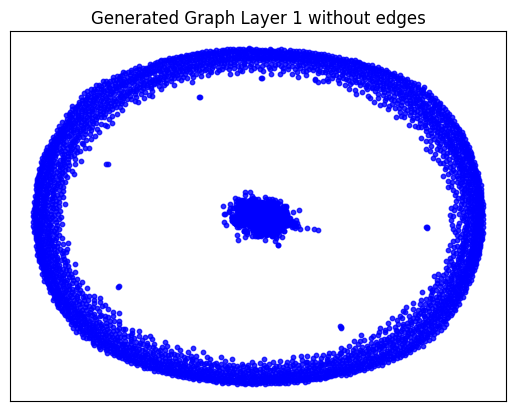

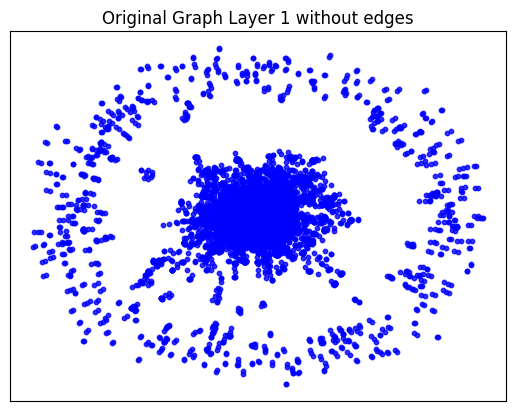

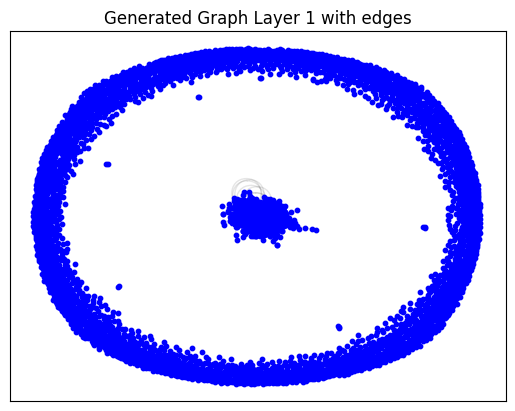

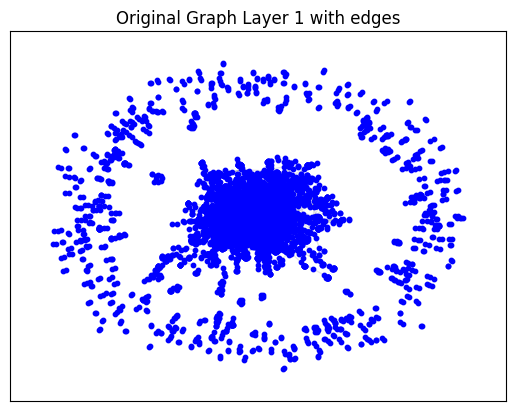

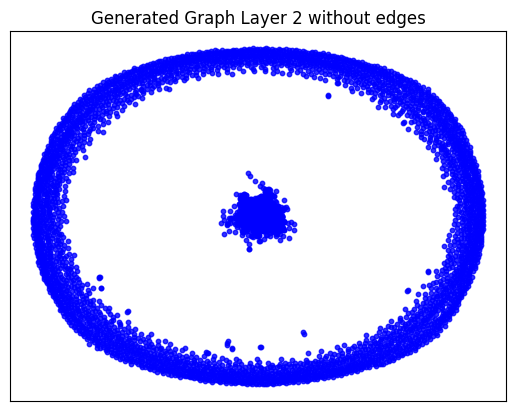

...

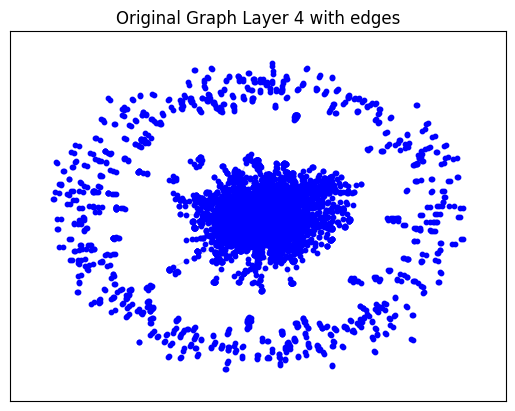

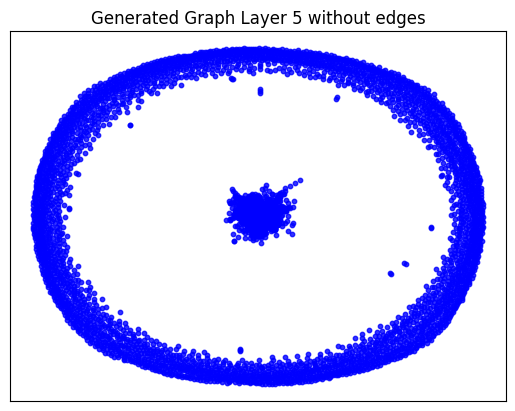

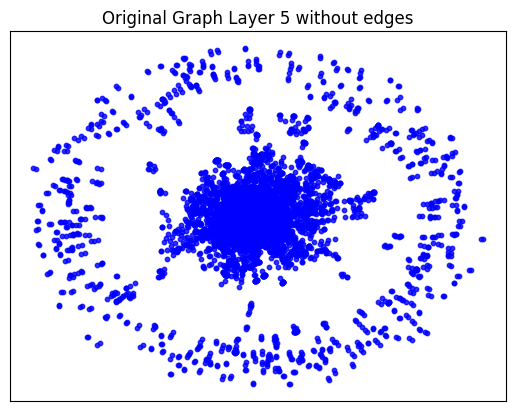

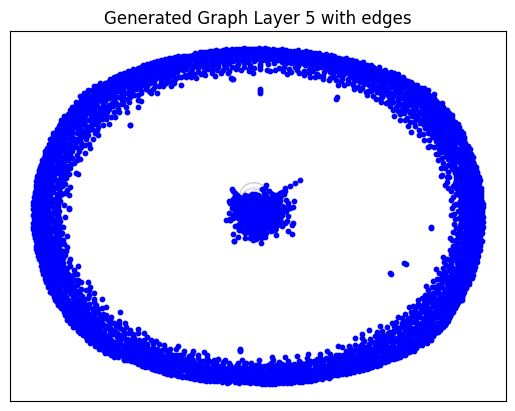

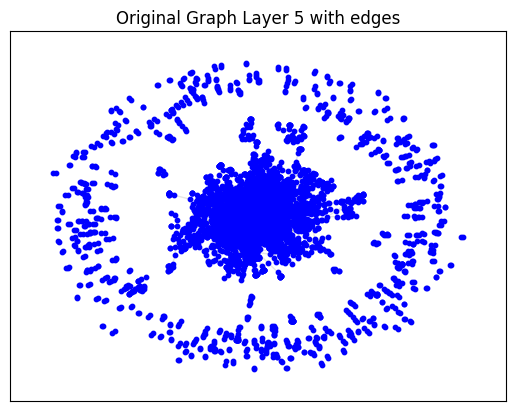

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_6.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.030254840850830078 seconds to compute statistics_degrees ---
--- 1.2578282356262207 seconds to compute statistics_LCC ---
--- 0.04096198081970215 seconds to compute statistics_wedge_count ---
--- 0.04199504852294922 seconds to compute statistics_claw_count ---
--- 0.2116243839263916 seconds to compute statistics_triangle_count ---
--- 0.032011985778808594 seconds to compute statistics_power_law_alpha ---
--- 0.031865596771240234 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14844942092895508 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04951214790344238 seconds to compute degree_assortativity_coefficient ---
--- 0.623887300491333 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 203, 'd_min': 0, 'd': 1.2433534496819443, 'LCC': 1001, 'wedge_count': 174066.0, 'claw_count': 6187115.0, 'triangle_count': 13117, 'power_law_exp': 1.9568675566797955, 'gini': 0.9497520926473642, 'rel_edge_distr_entropy': 0.6725139307202059, 'assortativity': -0.2637022994878958, 'clustering_coefficient': 0.006360153318630735, 'n_components': 5128}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.3925531087834848
KL divergence between original network and the network generated by Random E-R: 5.642269930359208
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.9712482223098992
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.314186004720276
KL divergence between original network and the network generated by Random E-R: 12.64360182600582
KL divergence between original network and the network generated by Random B-A: 1.9959036274002802
KL divergence between original network and the network generated by GAE: 39.56867127422019


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Seventh batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_7.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_7'
args.filename = 'pubmed_7_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_7'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [1], Step: [0], Time: [10.9111]
Epoch: [2], Step: [0], Time: [11.2015]
Epoch: [3], Step: [0], Time: [11.4923]
Epoch: [4], Step: [0], Time: [11.7903]
Epoch: [5], Step: [0], Time: [12.0809]
Epoch: [6], Step: [0], Time: [12.3720]
Epoch: [7], Step: [0], Time: [12.6626]
Epoch: [8], Step: [0], Time: [12.9541]
Epoch: [9], Step: [0], Time: [13.2546]
Epoch: [10], Step: [0], Time: [13.5450]
Epoch: [11], Step: [0], Time: [13.8349]
Epoch: [12], Step: [0], Time: [14.1248]
Epoch: [13], Step: [0], Time: [14.4145]
Epoch: [14], Step: [0], Time: [14.7046]
Epoch: [15], Step: [0], Time: [14.9944]
Epoch: [16], Step: [0], Time: [15.2839]
Epoch: [17], Step: [0], Time: [15.5748]
Epoch: [18], Step: [0], Time: [15.8657]
Epoch: [19], Step: [0], Time: [16.1558]
Epoch: [20], Step: [0], Time: [16.4461]
Epoch: [21], Step: [0], Time: [16.7365]
Epoch: [22], Step: [0], Time: [17.0271]
Epoch: [23], Step: [0], Time: [17.3171]
Epoch: [24], Step: [0], Time: [17.6073]
Epoch: [25], Step: [0],

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([5714, 5714])
Shape of feature_tensor before unpooling: torch.Size([5714, 48])
Shapes in down_outs: [torch.Size([5714, 48]), torch.Size([5142, 48]), torch.Size([4113, 48])]
Shapes in indices_list: [torch.Size([5142]), torch.Size([4113]), torch.Size([2879])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([5714, 48])
Shape of indices_list[0]: torch.Size([5142])
Shape of new_h before assignment: torch.Size([5714, 48])
Shape of h_subset: torch.Size([5142, 48])
Shape of idx: torch.Size([5142])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5142, 48])
Shape of indices_list[1]: torch.Size([4113])
Shape of new_h before assignment: torch.Size([5714, 48])
Shape of h_subset: torch.Size([4113, 48])
Shape of idx: torch.Size([4113])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4113, 48])
Shape of

<ipython-input-51-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.026180028915405273 seconds to compute statistics_degrees ---
--- 1.1426787376403809 seconds to compute statistics_LCC ---
--- 0.03633689880371094 seconds to compute statistics_wedge_count ---
--- 0.03779411315917969 seconds to compute statistics_claw_count ---
--- 0.20529699325561523 seconds to compute statistics_triangle_count ---
--- 0.027718782424926758 seconds to compute statistics_power_law_alpha ---
--- 0.02791881561279297 seconds to compute statistics_gini ---
--- 0.13022994995117188 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05219006538391113 seconds to compute degree_assortativity_coefficient ---
--- 0.5478627681732178 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 171, 'd_min': 1, 'd': 2.3980395589007526, 'LCC': 4687, 'wedge_count': 90231.0, 'claw_count': 2322979.0, 'triangle_count': 333, 'power_law_exp': 3.265572740743697, 'gini':

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.4439115524291992 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 206, 'd_min': 0, 'd': 2.399964992123228, 'LCC': 2140, 'wedge_count': 309759.0, 'claw_count': 10344044.0, 'triangle_count': 2287, 'power_law_exp': 1.7458738120892536, 'gini': 0.9015155351825652, 'rel_edge_distr_entropy': 0.7468182590953066, 'assortativity': -0.07908782576146975, 'clustering_coefficient': 0.0006632802412673419, 'n_components': 3552}
Computing metrics for ER graph
--- 0.024050235748291016 seconds to compute statistics_degrees ---
--- 1.4373300075531006 seconds to compute statistics_LCC ---
--- 0.02609109878540039 seconds to compute statistics_wedge_count ---
--- 0.02668595314025879 seconds to compute statistics_claw_count ---
--- 0.3176863193511963 seconds to compute statistics_triangle_count ---
--- 0.026731252670288086 seconds to compute statistics_power_law_alpha ---
--- 0.026017427444458008 seconds to compute statistics_g

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.06926631927490234 seconds to compute degree_assortativity_coefficient ---
--- 0.7379758358001709 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 15.0, 'd_min': 0.0, 'd': 4.796079117801505, 'LCC': 5648, 'wedge_count': 65638.0, 'claw_count': 104367.0, 'triangle_count': 22, 'power_law_exp': 1.682212618837379, 'gini': 0.25336107558507237, 'rel_edge_distr_entropy': 0.9872670537463083, 'assortativity': 0.004623536071903687, 'clustering_coefficient': 0.0006323837994768461, 'n_components': 65}
Computing metrics for bara graph
--- 0.024161338806152344 seconds to compute statistics_degrees ---
--- 1.824368953704834 seconds to compute statistics_LCC ---
--- 0.026731252670288086 seconds to compute statistics_wedge_count ---
--- 0.02696847915649414 seconds to compute statistics_claw_count ---
--- 29.174700260162354 seconds to compute statistics_triangle_count ---
--- 0.026427745819091797 seconds to compute statistic

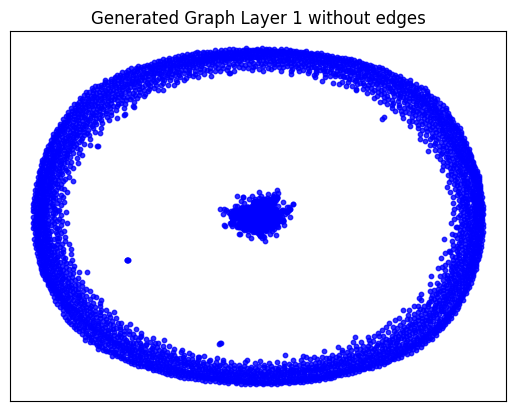

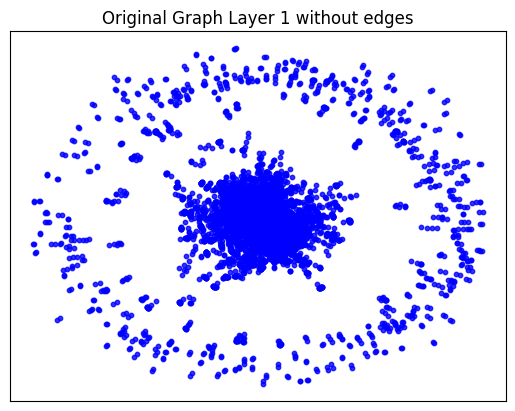

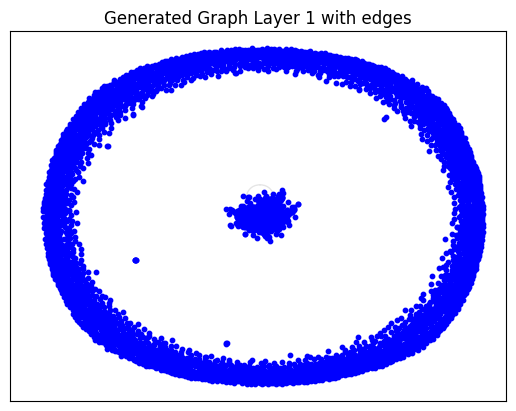

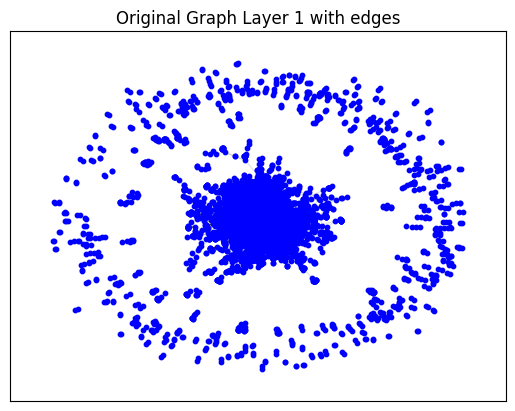

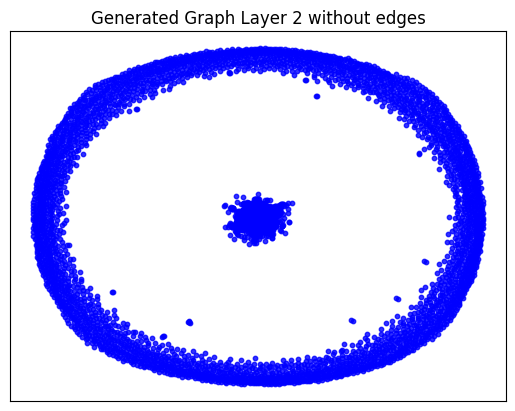

...

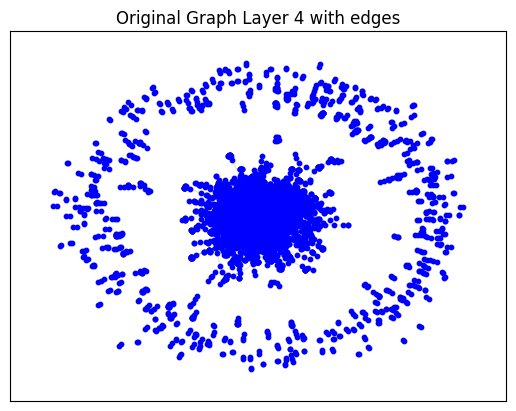

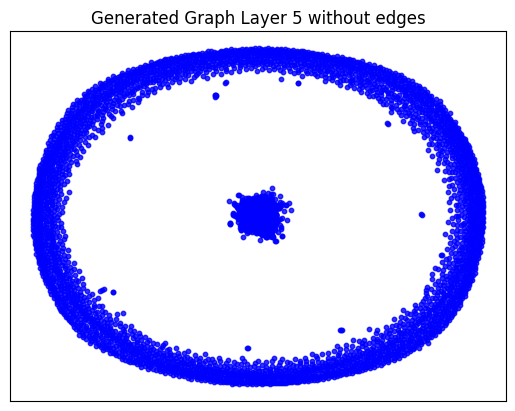

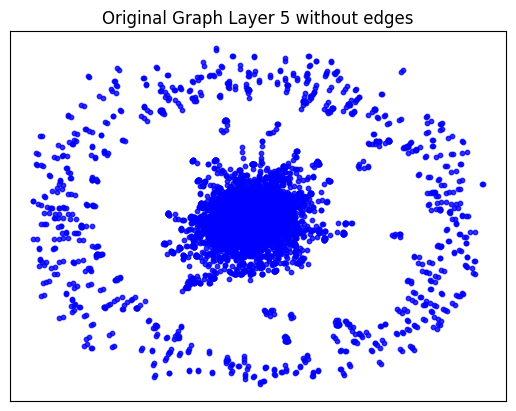

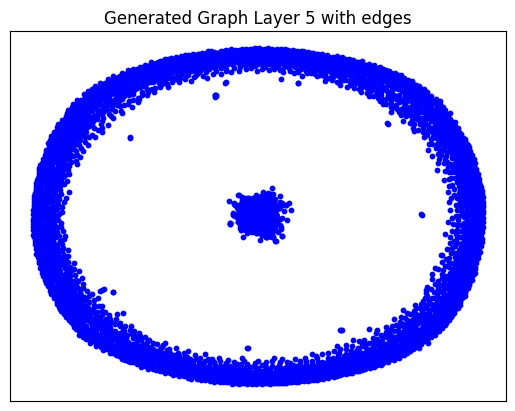

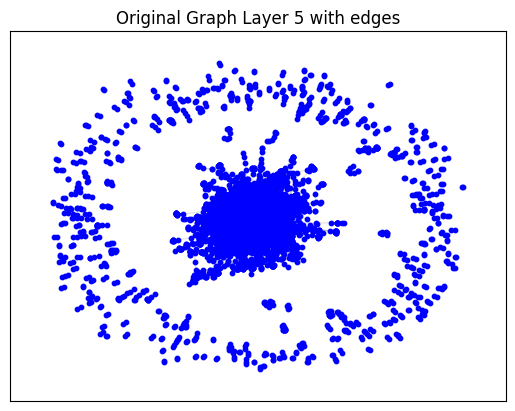

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_7.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.025574207305908203 seconds to compute statistics_degrees ---
--- 1.0923423767089844 seconds to compute statistics_LCC ---
--- 0.03574228286743164 seconds to compute statistics_wedge_count ---
--- 0.03679370880126953 seconds to compute statistics_claw_count ---
--- 0.18699932098388672 seconds to compute statistics_triangle_count ---
--- 0.027292251586914062 seconds to compute statistics_power_law_alpha ---
--- 0.027258634567260742 seconds to compute statistics_gini ---
--- 0.1302497386932373 seconds to compute statistics_edge_distribution_entropy ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04648876190185547 seconds to compute degree_assortativity_coefficient ---
--- 0.547696590423584 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 278, 'd_min': 0, 'd': 1.2388869443472175, 'LCC': 1277, 'wedge_count': 189286.0, 'claw_count': 10652703.0, 'triangle_count': 6510, 'power_law_exp': 2.2019900802296997, 'gini': 0.9260820542086576, 'rel_edge_distr_entropy': 0.6946019663120709, 'assortativity': -0.33267073375806205, 'clustering_coefficient': 0.0018333375106768678, 'n_components': 4428}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.04102101239748115
KL divergence between original network and the network generated by Random E-R: 5.97754220056796
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.00657523588177405
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.692925756485478
KL divergence between original network and the network generated by Random E-R: 6.868411213969212
KL divergence between original network and the network generated by Random B-A: 2.0213021236686792
KL divergence between original network and the network generated by GAE: 27.70462916681199


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Eighth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_8.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_8'
args.filename = 'pubmed_8_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_8'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [1], Step: [0], Time: [10.3430]
Epoch: [2], Step: [0], Time: [10.6589]
Epoch: [3], Step: [0], Time: [11.0432]
Epoch: [4], Step: [0], Time: [11.3590]
Epoch: [5], Step: [0], Time: [11.6745]
Epoch: [6], Step: [0], Time: [11.9896]
Epoch: [7], Step: [0], Time: [12.3063]
Epoch: [8], Step: [0], Time: [12.6225]
Epoch: [9], Step: [0], Time: [12.9385]
Epoch: [10], Step: [0], Time: [13.2541]
Epoch: [11], Step: [0], Time: [13.5702]
Epoch: [12], Step: [0], Time: [13.8859]
Epoch: [13], Step: [0], Time: [14.2015]
Epoch: [14], Step: [0], Time: [14.5171]
Epoch: [15], Step: [0], Time: [14.8331]
Epoch: [16], Step: [0], Time: [15.1491]
Epoch: [17], Step: [0], Time: [15.4652]
Epoch: [18], Step: [0], Time: [15.7813]
Epoch: [19], Step: [0], Time: [16.0977]
Epoch: [20], Step: [0], Time: [16.4137]
Epoch: [21], Step: [0], Time: [16.7291]
Epoch: [22], Step: [0], Time: [17.0447]
Epoch: [23], Step: [0], Time: [17.3599]
Epoch: [24], Step: [0], Time: [17.6771]
Epoch: [25], Step: [0],

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6066, 6066])
Shape of feature_tensor before unpooling: torch.Size([6066, 48])
Shapes in down_outs: [torch.Size([6066, 48]), torch.Size([5459, 48]), torch.Size([4367, 48])]
Shapes in indices_list: [torch.Size([5459]), torch.Size([4367]), torch.Size([3056])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6066, 48])
Shape of indices_list[0]: torch.Size([5459])
Shape of new_h before assignment: torch.Size([6066, 48])
Shape of h_subset: torch.Size([5459, 48])
Shape of idx: torch.Size([5459])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5459, 48])
Shape of indices_list[1]: torch.Size([4367])
Shape of new_h before assignment: torch.Size([6066, 48])
Shape of h_subset: torch.Size([4367, 48])
Shape of idx: torch.Size([4367])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4367, 48])
Shape of

<ipython-input-51-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.02956676483154297 seconds to compute statistics_degrees ---
--- 1.236879825592041 seconds to compute statistics_LCC ---
--- 0.04005289077758789 seconds to compute statistics_wedge_count ---
--- 0.04136013984680176 seconds to compute statistics_claw_count ---
--- 0.22668004035949707 seconds to compute statistics_triangle_count ---
--- 0.03110527992248535 seconds to compute statistics_power_law_alpha ---
--- 0.030977725982666016 seconds to compute statistics_gini ---
--- 0.1452469825744629 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0538027286529541 seconds to compute degree_assortativity_coefficient ---
--- 0.6157541275024414 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 130, 'd_min': 1, 'd': 2.2667765869744434, 'LCC': 4731, 'wedge_count': 57302.0, 'claw_count': 741223.0, 'triangle_count': 244, 'power_law_exp': 3.352070470682542, 'gini': 0.47

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.513383150100708 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 88, 'd_min': 0, 'd': 2.266941467436109, 'LCC': 2597, 'wedge_count': 141014.0, 'claw_count': 1971071.0, 'triangle_count': 510, 'power_law_exp': 1.7731184851378052, 'gini': 0.8589119844255182, 'rel_edge_distr_entropy': 0.8017033871535019, 'assortativity': -0.09792368570551403, 'clustering_coefficient': 0.0007762277462354223, 'n_components': 3446}
Computing metrics for ER graph
--- 0.027333974838256836 seconds to compute statistics_degrees ---
--- 1.5917253494262695 seconds to compute statistics_LCC ---
--- 0.029366493225097656 seconds to compute statistics_wedge_count ---
--- 0.02992391586303711 seconds to compute statistics_claw_count ---
--- 0.34795236587524414 seconds to compute statistics_triangle_count ---
--- 0.029477834701538086 seconds to compute statistics_power_law_alpha ---
--- 0.028748750686645508 seconds to compute statistics_g

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07138752937316895 seconds to compute degree_assortativity_coefficient ---
--- 0.7934963703155518 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 13.0, 'd_min': 0.0, 'd': 4.533553173948887, 'LCC': 5995, 'wedge_count': 62062.0, 'claw_count': 92928.0, 'triangle_count': 12, 'power_law_exp': 1.7116076696167632, 'gini': 0.2583777216129888, 'rel_edge_distr_entropy': 0.9868716146484234, 'assortativity': -0.0005074683261052567, 'clustering_coefficient': 0.00038739669421487604, 'n_components': 70}
Computing metrics for bara graph
--- 0.027117490768432617 seconds to compute statistics_degrees ---
--- 2.039388418197632 seconds to compute statistics_LCC ---
--- 0.029282331466674805 seconds to compute statistics_wedge_count ---
--- 0.029822826385498047 seconds to compute statistics_claw_count ---
--- 31.049856901168823 seconds to compute statistics_triangle_count ---
--- 0.029366254806518555 seconds to compute stat

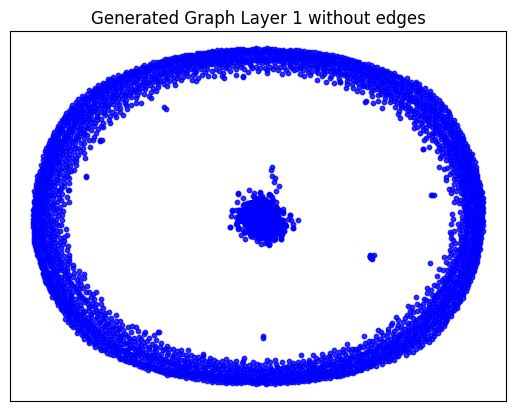

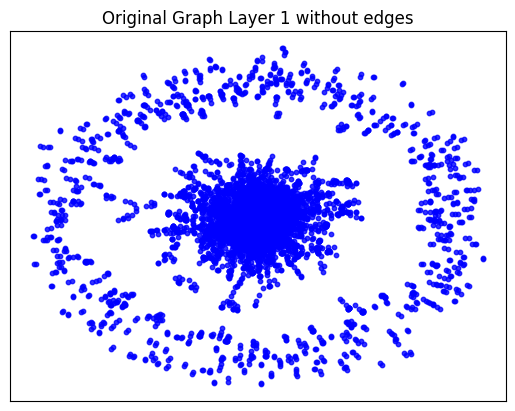

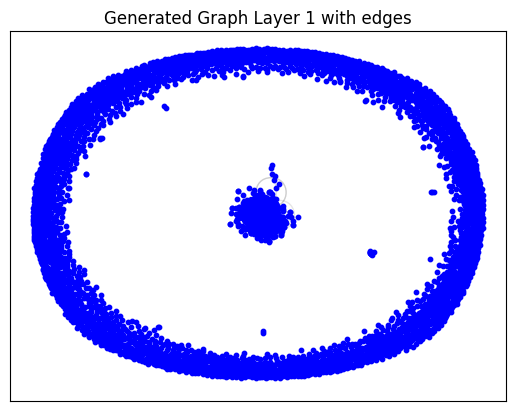

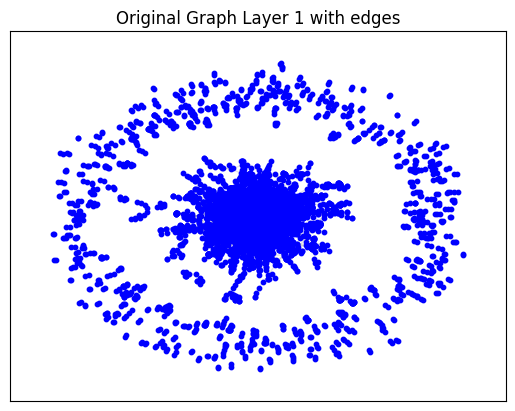

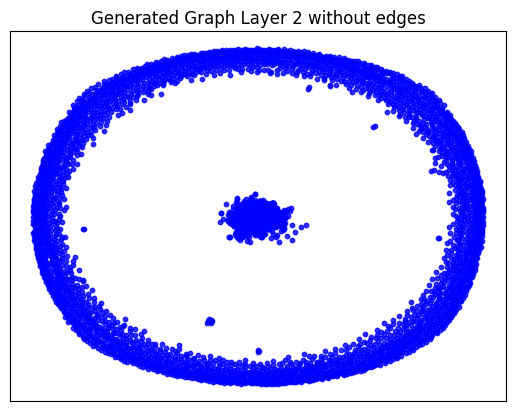

...

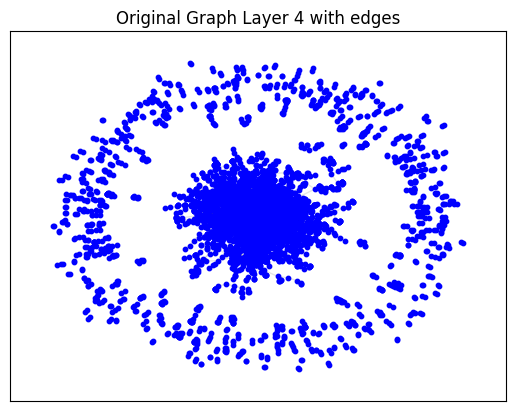

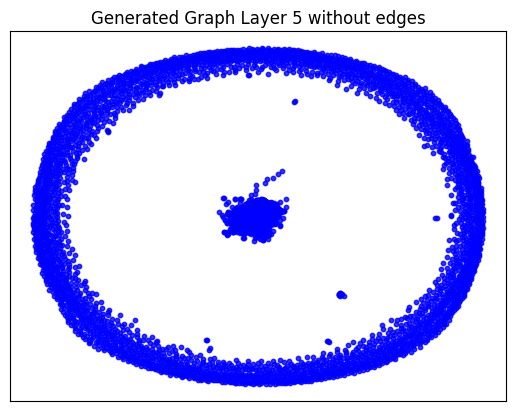

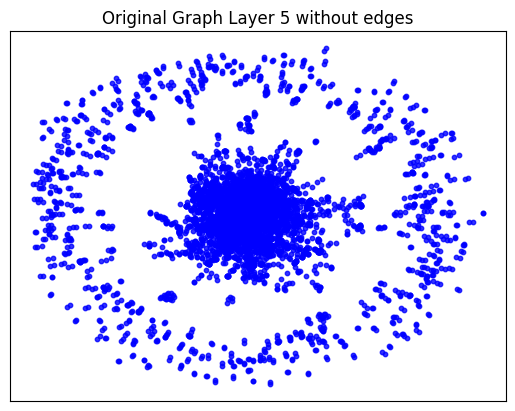

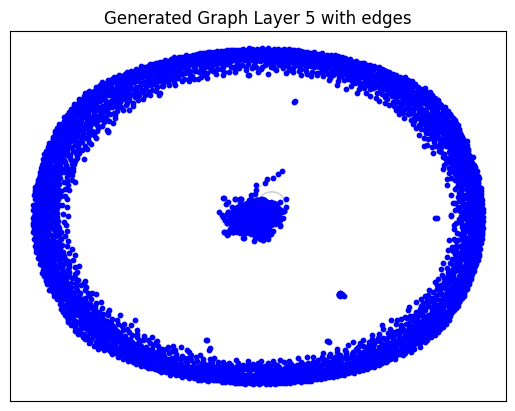

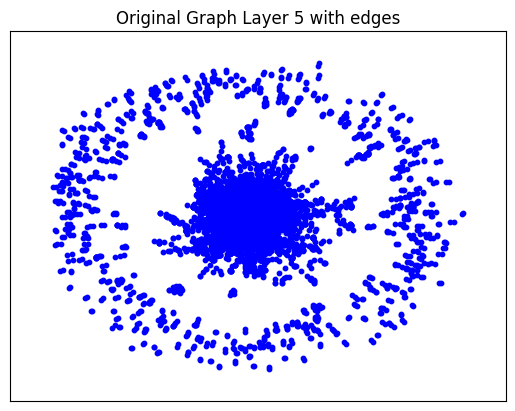

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_8.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.029996633529663086 seconds to compute statistics_degrees ---
--- 1.2612717151641846 seconds to compute statistics_LCC ---
--- 0.03947615623474121 seconds to compute statistics_wedge_count ---
--- 0.04023408889770508 seconds to compute statistics_claw_count ---
--- 0.20563006401062012 seconds to compute statistics_triangle_count ---
--- 0.03022146224975586 seconds to compute statistics_power_law_alpha ---
--- 0.030740976333618164 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14600539207458496 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04724931716918945 seconds to compute degree_assortativity_coefficient ---
--- 0.6309995651245117 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 281, 'd_min': 0, 'd': 1.1795252225519288, 'LCC': 1275, 'wedge_count': 138232.0, 'claw_count': 5845476.0, 'triangle_count': 6078, 'power_law_exp': 2.218920380973952, 'gini': 0.9317717315446694, 'rel_edge_distr_entropy': 0.7009988427224377, 'assortativity': -0.2557034651651533, 'clustering_coefficient': 0.0031193353629370814, 'n_components': 4788}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.1509412615886744
KL divergence between original network and the network generated by Random E-R: 6.212115367116204
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 2.6156742858675765e-05
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.1202656114020395
KL divergence between original network and the network generated by Random E-R: 9.820923538720558
KL divergence between original network and the network generated by Random B-A: 1.9545664717067786
KL divergence between original network and the network generated by GAE: 29.988150354982828


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Ninth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_9.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_9'
args.filename = 'pubmed_9_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_9'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [1], Step: [0], Time: [10.1184]
Epoch: [2], Step: [0], Time: [10.4323]
Epoch: [3], Step: [0], Time: [10.7458]
Epoch: [4], Step: [0], Time: [11.0592]
Epoch: [5], Step: [0], Time: [11.3736]
Epoch: [6], Step: [0], Time: [11.6878]
Epoch: [7], Step: [0], Time: [12.0022]
Epoch: [8], Step: [0], Time: [12.3160]
Epoch: [9], Step: [0], Time: [12.6302]
Epoch: [10], Step: [0], Time: [12.9440]
Epoch: [11], Step: [0], Time: [13.2589]
Epoch: [12], Step: [0], Time: [13.5730]
Epoch: [13], Step: [0], Time: [13.8876]
Epoch: [14], Step: [0], Time: [14.2025]
Epoch: [15], Step: [0], Time: [14.5170]
Epoch: [16], Step: [0], Time: [14.8326]
Epoch: [17], Step: [0], Time: [15.1479]
Epoch: [18], Step: [0], Time: [15.4621]
Epoch: [19], Step: [0], Time: [15.7759]
Epoch: [20], Step: [0], Time: [16.0902]
Epoch: [21], Step: [0], Time: [16.4048]
Epoch: [22], Step: [0], Time: [16.7190]
Epoch: [23], Step: [0], Time: [17.0338]
Epoch: [24], Step: [0], Time: [17.3480]
Epoch: [25], Step: [0],

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([5936, 5936])
Shape of feature_tensor before unpooling: torch.Size([5936, 48])
Shapes in down_outs: [torch.Size([5936, 48]), torch.Size([5342, 48]), torch.Size([4273, 48])]
Shapes in indices_list: [torch.Size([5342]), torch.Size([4273]), torch.Size([2991])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([5936, 48])
Shape of indices_list[0]: torch.Size([5342])
Shape of new_h before assignment: torch.Size([5936, 48])
Shape of h_subset: torch.Size([5342, 48])
Shape of idx: torch.Size([5342])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5342, 48])
Shape of indices_list[1]: torch.Size([4273])
Shape of new_h before assignment: torch.Size([5936, 48])
Shape of h_subset: torch.Size([4273, 48])
Shape of idx: torch.Size([4273])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4273, 48])
Shape of

<ipython-input-51-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.02847003936767578 seconds to compute statistics_degrees ---
--- 1.1855764389038086 seconds to compute statistics_LCC ---
--- 0.03840184211730957 seconds to compute statistics_wedge_count ---
--- 0.039589881896972656 seconds to compute statistics_claw_count ---
--- 0.21814727783203125 seconds to compute statistics_triangle_count ---
--- 0.029391050338745117 seconds to compute statistics_power_law_alpha ---
--- 0.029402971267700195 seconds to compute statistics_gini ---
--- 0.13883185386657715 seconds to compute statistics_edge_distribution_entropy ---
--- 0.053467512130737305 seconds to compute degree_assortativity_coefficient ---
--- 0.5899789333343506 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 88, 'd_min': 1, 'd': 2.318786857624263, 'LCC': 4666, 'wedge_count': 62653.0, 'claw_count': 678007.0, 'triangle_count': 255, 'power_law_exp': 3.3236412505818898, 'gini':

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5006544589996338 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 122, 'd_min': 0, 'd': 2.3194608256107836, 'LCC': 2441, 'wedge_count': 121818.0, 'claw_count': 1678796.0, 'triangle_count': 795, 'power_law_exp': 1.7020640037241404, 'gini': 0.8486737466923686, 'rel_edge_distr_entropy': 0.8115701927361316, 'assortativity': -0.09799220534956761, 'clustering_coefficient': 0.0014206609975244164, 'n_components': 3480}
Computing metrics for ER graph
--- 0.02617621421813965 seconds to compute statistics_degrees ---
--- 1.5785655975341797 seconds to compute statistics_LCC ---
--- 0.027942657470703125 seconds to compute statistics_wedge_count ---
--- 0.029273033142089844 seconds to compute statistics_claw_count ---
--- 0.8701162338256836 seconds to compute statistics_triangle_count ---
--- 0.027915477752685547 seconds to compute statistics_power_law_alpha ---
--- 0.027608394622802734 seconds to compute statistics

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.20801877975463867 seconds to compute statistics_edge_distribution_entropy ---
--- 0.06806564331054688 seconds to compute degree_assortativity_coefficient ---
--- 0.7543139457702637 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 13.0, 'd_min': 0.0, 'd': 4.637573715248526, 'LCC': 5880, 'wedge_count': 63834.0, 'claw_count': 98692.0, 'triangle_count': 20, 'power_law_exp': 1.7022885504057699, 'gini': 0.25820262307341313, 'rel_edge_distr_entropy': 0.986964155077289, 'assortativity': 0.0021591870377720237, 'clustering_coefficient': 0.0006079520123211607, 'n_components': 55}
Computing metrics for bara graph
--- 0.026341915130615234 seconds to compute statistics_degrees ---
--- 1.961228847503662 seconds to compute statistics_LCC ---
--- 0.028146982192993164 seconds to compute statistics_wedge_count ---
--- 0.028630495071411133 seconds to compute statistics_claw_count ---
--- 30.10200548171997 seconds to compu

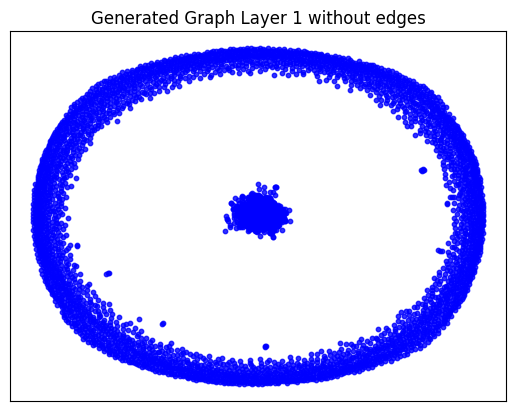

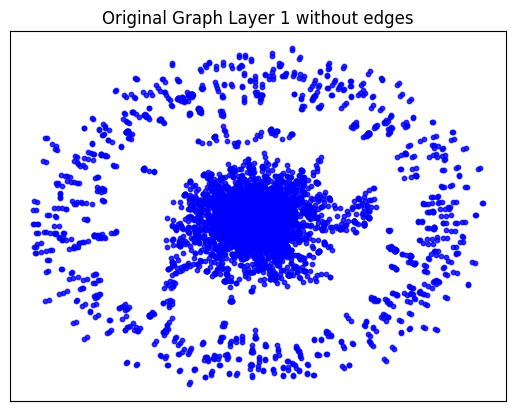

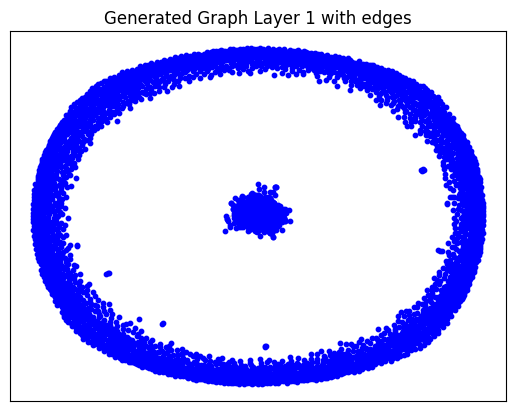

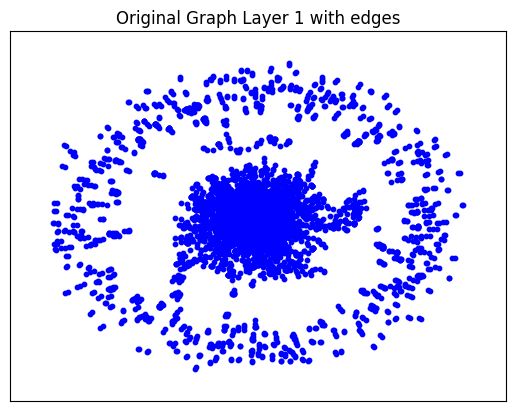

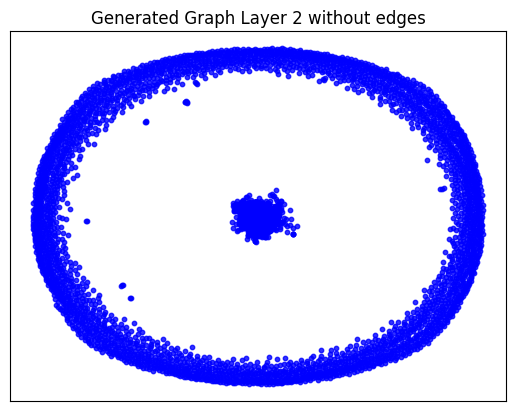

...

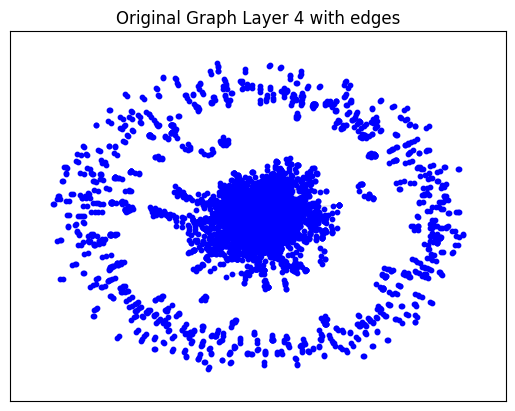

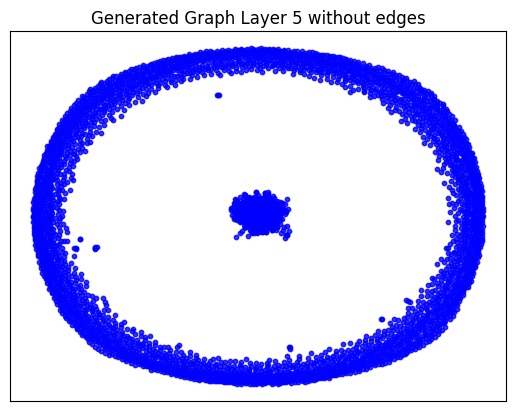

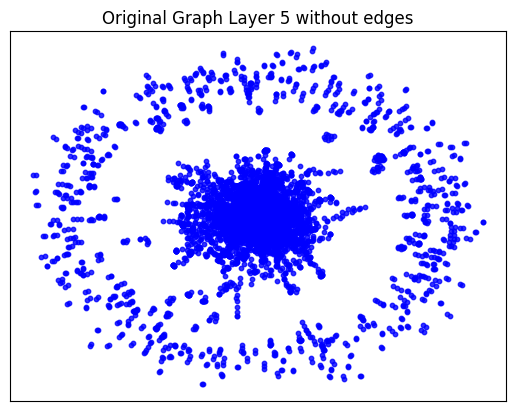

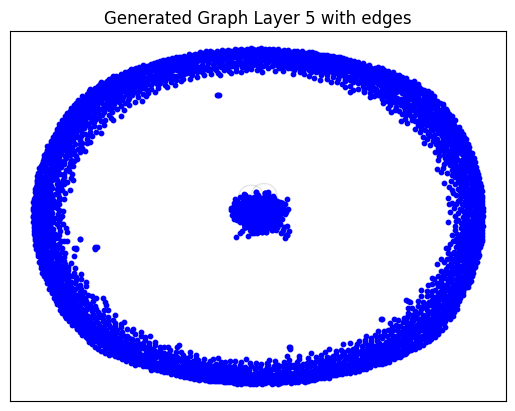

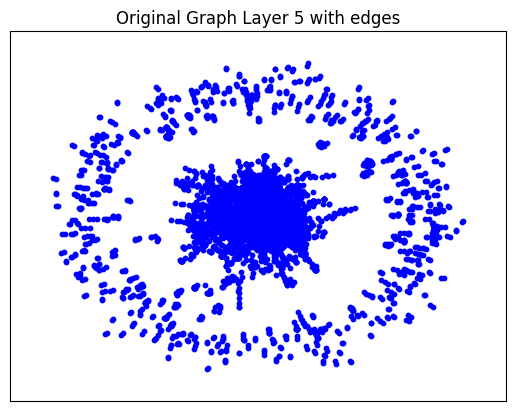

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_9.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.027706623077392578 seconds to compute statistics_degrees ---
--- 1.1782596111297607 seconds to compute statistics_LCC ---
--- 0.03790163993835449 seconds to compute statistics_wedge_count ---
--- 0.038835763931274414 seconds to compute statistics_claw_count ---
--- 0.19830965995788574 seconds to compute statistics_triangle_count ---
--- 0.029162883758544922 seconds to compute statistics_power_law_alpha ---
--- 0.029560565948486328 seconds to compute statistics_gini ---
--- 0.13983154296875 seconds to compute statistics_edge_distribution_entropy ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04758596420288086 seconds to compute degree_assortativity_coefficient ---
--- 0.5881586074829102 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 249, 'd_min': 0, 'd': 1.1987870619946093, 'LCC': 1118, 'wedge_count': 179244.0, 'claw_count': 8502204.0, 'triangle_count': 7581, 'power_law_exp': 2.0986088937547143, 'gini': 0.9403533228334766, 'rel_edge_distr_entropy': 0.6799945504662606, 'assortativity': -0.33750401356155635, 'clustering_coefficient': 0.002674953459126598, 'n_components': 4808}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.20425220363068022
KL divergence between original network and the network generated by Random E-R: 6.0527875291147035
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.04174035981647798
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.526361049123253
KL divergence between original network and the network generated by Random E-R: 12.748637282674403
KL divergence between original network and the network generated by Random B-A: 1.854632351294588
KL divergence between original network and the network generated by GAE: 42.780493453963636


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

10 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_10.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_10'
args.filename = 'pubmed_10_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_10'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [1], Step: [0], Time: [9.8283]
Epoch: [2], Step: [0], Time: [9.9980]
Epoch: [3], Step: [0], Time: [10.1670]
Epoch: [4], Step: [0], Time: [10.3341]
Epoch: [5], Step: [0], Time: [10.5030]
Epoch: [6], Step: [0], Time: [10.6712]
Epoch: [7], Step: [0], Time: [10.8412]
Epoch: [8], Step: [0], Time: [11.0108]
Epoch: [9], Step: [0], Time: [11.1801]
Epoch: [10], Step: [0], Time: [11.3490]
Epoch: [11], Step: [0], Time: [11.5180]
Epoch: [12], Step: [0], Time: [11.6859]
Epoch: [13], Step: [0], Time: [11.8546]
Epoch: [14], Step: [0], Time: [12.0234]
Epoch: [15], Step: [0], Time: [12.1928]
Epoch: [16], Step: [0], Time: [12.3618]
Epoch: [17], Step: [0], Time: [12.5302]
Epoch: [18], Step: [0], Time: [12.6989]
Epoch: [19], Step: [0], Time: [12.8679]
Epoch: [20], Step: [0], Time: [13.0365]
Epoch: [21], Step: [0], Time: [13.2057]
Epoch: [22], Step: [0], Time: [13.3730]
Epoch: [23], Step: [0], Time: [13.5415]
Epoch: [24], Step: [0], Time: [13.7101]
Epoch: [25], Step: [0], T

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([5919, 5919])
Shape of feature_tensor before unpooling: torch.Size([5919, 48])
Shapes in down_outs: [torch.Size([5919, 48]), torch.Size([5327, 48]), torch.Size([4261, 48])]
Shapes in indices_list: [torch.Size([5327]), torch.Size([4261]), torch.Size([2982])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([5919, 48])
Shape of indices_list[0]: torch.Size([5327])
Shape of new_h before assignment: torch.Size([5919, 48])
Shape of h_subset: torch.Size([5327, 48])
Shape of idx: torch.Size([5327])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5327, 48])
Shape of indices_list[1]: torch.Size([4261])
Shape of new_h before assignment: torch.Size([5919, 48])
Shape of h_subset: torch.Size([4261, 48])
Shape of idx: torch.Size([4261])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4261, 48])
Shape of

<ipython-input-51-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.027805805206298828 seconds to compute statistics_degrees ---
--- 1.1824312210083008 seconds to compute statistics_LCC ---
--- 0.03779864311218262 seconds to compute statistics_wedge_count ---
--- 0.03866744041442871 seconds to compute statistics_claw_count ---
--- 0.21863222122192383 seconds to compute statistics_triangle_count ---
--- 0.02904486656188965 seconds to compute statistics_power_law_alpha ---
--- 0.02934861183166504 seconds to compute statistics_gini ---
--- 0.13753914833068848 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05411219596862793 seconds to compute degree_assortativity_coefficient ---
--- 0.6167206764221191 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 68, 'd_min': 1, 'd': 2.314295370057452, 'LCC': 4870, 'wedge_count': 54376.0, 'claw_count': 471800.0, 'triangle_count': 207, 'power_law_exp': 3.3106266630472776, 'gini': 0.

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5041522979736328 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 138, 'd_min': 0, 'd': 2.3156471781007095, 'LCC': 2387, 'wedge_count': 160233.0, 'claw_count': 2520620.0, 'triangle_count': 1636, 'power_law_exp': 1.67549282685592, 'gini': 0.8835874681160132, 'rel_edge_distr_entropy': 0.7818947745341173, 'assortativity': -0.20291891925247518, 'clustering_coefficient': 0.0019471399893676953, 'n_components': 3517}
Computing metrics for ER graph
--- 0.0258023738861084 seconds to compute statistics_degrees ---
--- 1.5168724060058594 seconds to compute statistics_LCC ---
--- 0.028149843215942383 seconds to compute statistics_wedge_count ---
--- 0.028670787811279297 seconds to compute statistics_claw_count ---
--- 0.3373830318450928 seconds to compute statistics_triangle_count ---
--- 0.028249502182006836 seconds to compute statistics_power_law_alpha ---
--- 0.027709484100341797 seconds to compute statistics_g

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07278156280517578 seconds to compute degree_assortativity_coefficient ---
--- 0.7599408626556396 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 15.0, 'd_min': 0.0, 'd': 4.628590740114904, 'LCC': 5862, 'wedge_count': 63105.0, 'claw_count': 97002.0, 'triangle_count': 20, 'power_law_exp': 1.7003074309042945, 'gini': 0.25490247557743984, 'rel_edge_distr_entropy': 0.9872836388885369, 'assortativity': 0.0028504319552064466, 'clustering_coefficient': 0.0006185439475474733, 'n_components': 57}
Computing metrics for bara graph
--- 0.025778770446777344 seconds to compute statistics_degrees ---
--- 1.9534070491790771 seconds to compute statistics_LCC ---
--- 0.0274660587310791 seconds to compute statistics_wedge_count ---
--- 0.02822589874267578 seconds to compute statistics_claw_count ---
--- 30.283326148986816 seconds to compute statistics_triangle_count ---
--- 0.027918100357055664 seconds to compute statistic

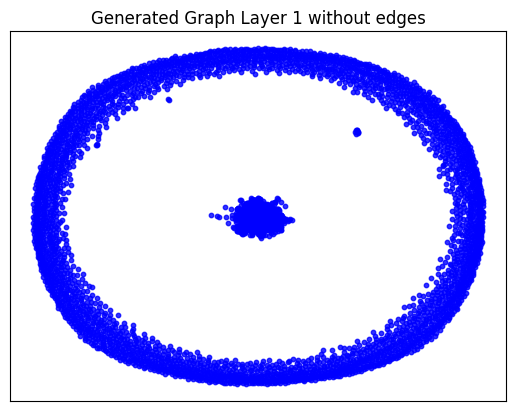

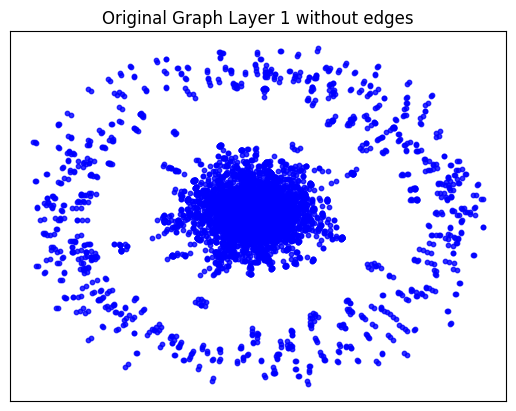

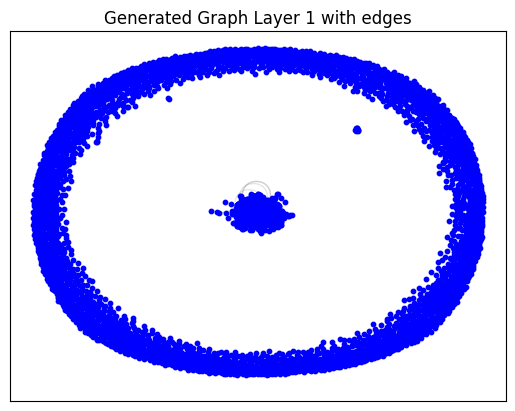

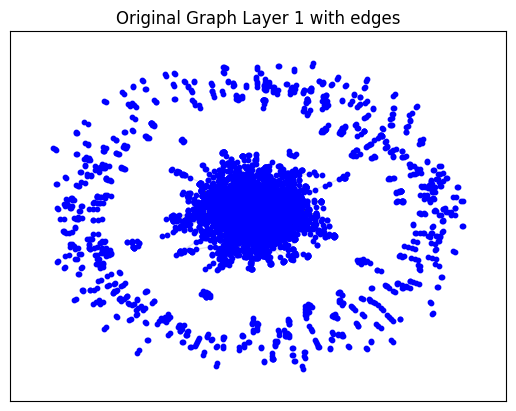

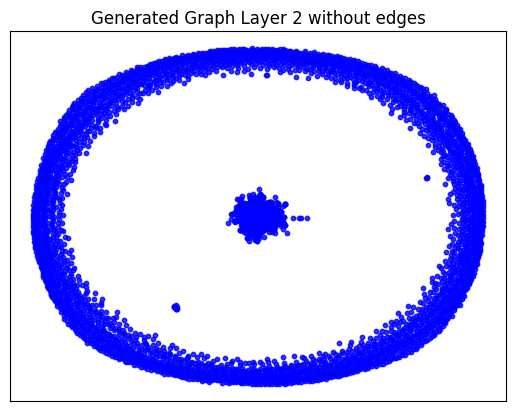

...

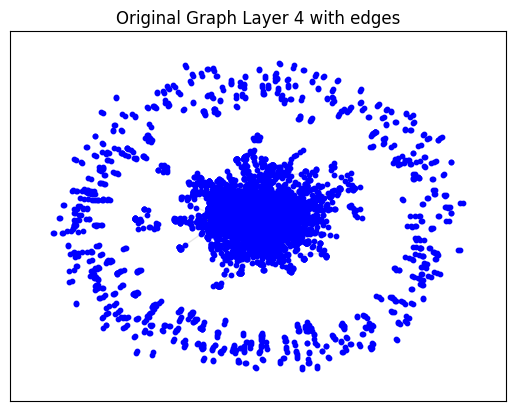

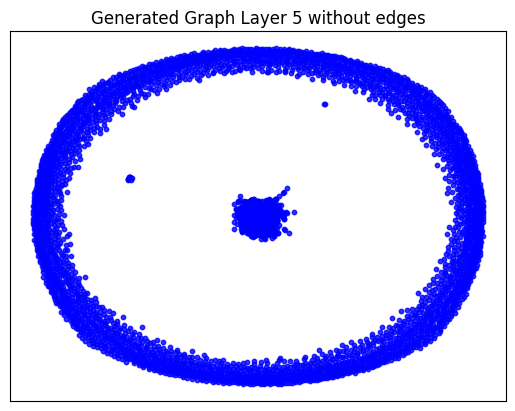

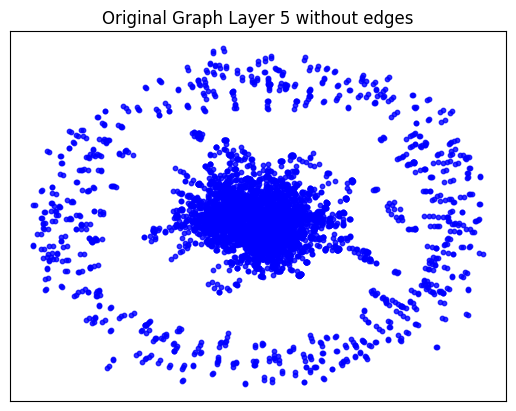

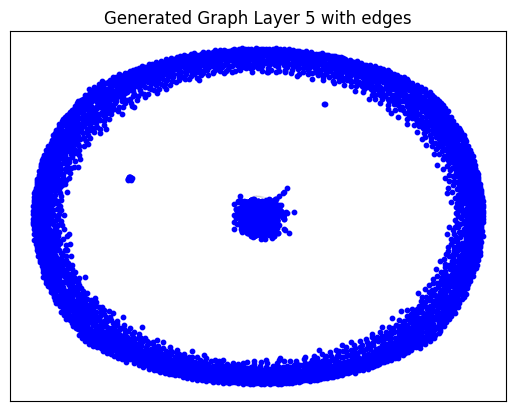

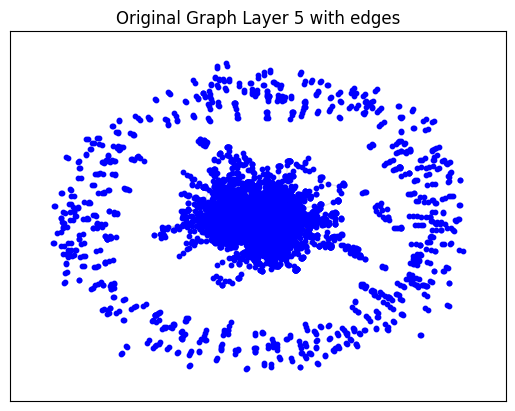

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_10.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.027896881103515625 seconds to compute statistics_degrees ---
--- 1.1720685958862305 seconds to compute statistics_LCC ---
--- 0.03835749626159668 seconds to compute statistics_wedge_count ---
--- 0.040070295333862305 seconds to compute statistics_claw_count ---
--- 0.1982259750366211 seconds to compute statistics_triangle_count ---
--- 0.029880285263061523 seconds to compute statistics_power_law_alpha ---
--- 0.030003786087036133 seconds to compute statistics_gini ---
--- 0.13880395889282227 seconds to compute statistics_edge_distribution_entropy ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.047083377838134766 seconds to compute degree_assortativity_coefficient ---
--- 0.5907747745513916 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 177, 'd_min': 0, 'd': 1.2023990538942388, 'LCC': 919, 'wedge_count': 128685.0, 'claw_count': 3298583.0, 'triangle_count': 10200, 'power_law_exp': 1.9185614981009018, 'gini': 0.9490942106522926, 'rel_edge_distr_entropy': 0.678933846517755, 'assortativity': -0.24254647919762887, 'clustering_coefficient': 0.009276710636051904, 'n_components': 4993}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.47777930000676155
KL divergence between original network and the network generated by Random E-R: 5.207513210229711
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 4.675686031925005
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 4.043051130069741
KL divergence between original network and the network generated by Random E-R: 12.712115932552129
KL divergence between original network and the network generated by Random B-A: 1.955228264255366
KL divergence between original network and the network generated by GAE: 39.4969279226122


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

11 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_11.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_11'
args.filename = 'pubmed_11_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_11'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [1], Step: [0], Time: [9.9711]
Epoch: [2], Step: [0], Time: [10.2908]
Epoch: [3], Step: [0], Time: [10.6107]
Epoch: [4], Step: [0], Time: [10.9306]
Epoch: [5], Step: [0], Time: [11.2500]
Epoch: [6], Step: [0], Time: [11.5699]
Epoch: [7], Step: [0], Time: [11.8907]
Epoch: [8], Step: [0], Time: [12.2112]
Epoch: [9], Step: [0], Time: [12.5316]
Epoch: [10], Step: [0], Time: [12.8512]
Epoch: [11], Step: [0], Time: [13.1718]
Epoch: [12], Step: [0], Time: [13.4922]
Epoch: [13], Step: [0], Time: [13.8116]
Epoch: [14], Step: [0], Time: [14.1310]
Epoch: [15], Step: [0], Time: [14.4516]
Epoch: [16], Step: [0], Time: [14.7720]
Epoch: [17], Step: [0], Time: [15.0929]
Epoch: [18], Step: [0], Time: [15.4138]
Epoch: [19], Step: [0], Time: [15.7347]
Epoch: [20], Step: [0], Time: [16.0562]
Epoch: [21], Step: [0], Time: [16.3772]
Epoch: [22], Step: [0], Time: [16.6979]
Epoch: [23], Step: [0], Time: [17.0180]
Epoch: [24], Step: [0], Time: [17.3387]
Epoch: [25], Step: [0], 

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6030, 6030])
Shape of feature_tensor before unpooling: torch.Size([6030, 48])
Shapes in down_outs: [torch.Size([6030, 48]), torch.Size([5427, 48]), torch.Size([4341, 48])]
Shapes in indices_list: [torch.Size([5427]), torch.Size([4341]), torch.Size([3038])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6030, 48])
Shape of indices_list[0]: torch.Size([5427])
Shape of new_h before assignment: torch.Size([6030, 48])
Shape of h_subset: torch.Size([5427, 48])
Shape of idx: torch.Size([5427])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5427, 48])
Shape of indices_list[1]: torch.Size([4341])
Shape of new_h before assignment: torch.Size([6030, 48])
Shape of h_subset: torch.Size([4341, 48])
Shape of idx: torch.Size([4341])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([4341, 48])
Shape of

<ipython-input-51-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.029471635818481445 seconds to compute statistics_degrees ---
--- 1.275395154953003 seconds to compute statistics_LCC ---
--- 0.040023088455200195 seconds to compute statistics_wedge_count ---
--- 0.04071855545043945 seconds to compute statistics_claw_count ---
--- 0.2228407859802246 seconds to compute statistics_triangle_count ---
--- 0.030849456787109375 seconds to compute statistics_power_law_alpha ---
--- 0.030818462371826172 seconds to compute statistics_gini ---
--- 0.14456939697265625 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0541534423828125 seconds to compute degree_assortativity_coefficient ---
--- 0.6325280666351318 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 69, 'd_min': 1, 'd': 2.27301376679383, 'LCC': 4751, 'wedge_count': 53338.0, 'claw_count': 474398.0, 'triangle_count': 211, 'power_law_exp': 3.3312306128720413, 'gini': 0.4

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5414204597473145 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 102, 'd_min': 0, 'd': 2.2731796317797315, 'LCC': 1838, 'wedge_count': 161796.0, 'claw_count': 2118438.0, 'triangle_count': 2222, 'power_law_exp': 1.6105359930321668, 'gini': 0.8975424327836834, 'rel_edge_distr_entropy': 0.7693967031728102, 'assortativity': -0.1499119002485987, 'clustering_coefficient': 0.003146658056549212, 'n_components': 4160}
Computing metrics for ER graph
--- 0.02789592742919922 seconds to compute statistics_degrees ---
--- 1.6203687191009521 seconds to compute statistics_LCC ---
--- 0.029219865798950195 seconds to compute statistics_wedge_count ---
--- 0.029686450958251953 seconds to compute statistics_claw_count ---
--- 0.3394806385040283 seconds to compute statistics_triangle_count ---
--- 0.028886079788208008 seconds to compute statistics_power_law_alpha ---
--- 0.028534889221191406 seconds to compute statistics_gi

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.06995511054992676 seconds to compute degree_assortativity_coefficient ---
--- 0.8615167140960693 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 16.0, 'd_min': 0.0, 'd': 4.54602753358766, 'LCC': 5958, 'wedge_count': 62133.0, 'claw_count': 93527.0, 'triangle_count': 19, 'power_law_exp': 1.7106756545944086, 'gini': 0.2592796279356915, 'rel_edge_distr_entropy': 0.9868010833936319, 'assortativity': -0.0060120462684309425, 'clustering_coefficient': 0.0006094496776331968, 'n_components': 70}
Computing metrics for bara graph
--- 0.026623249053955078 seconds to compute statistics_degrees ---
--- 2.1701979637145996 seconds to compute statistics_LCC ---
--- 0.028842687606811523 seconds to compute statistics_wedge_count ---
--- 0.029673337936401367 seconds to compute statistics_claw_count ---
--- 30.734225034713745 seconds to compute statistics_triangle_count ---
--- 0.028964996337890625 seconds to compute stati

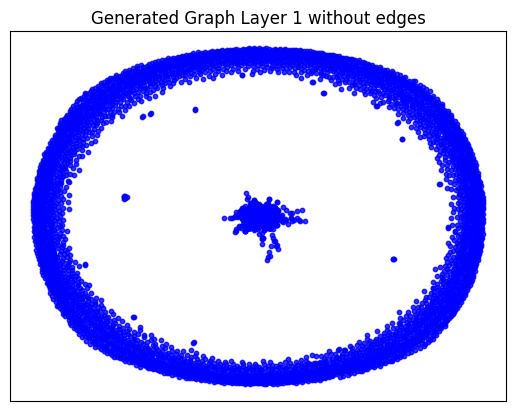

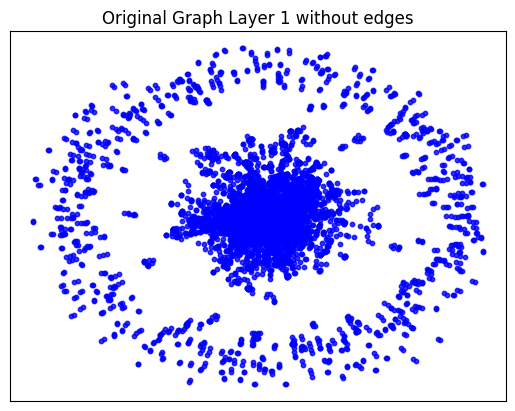

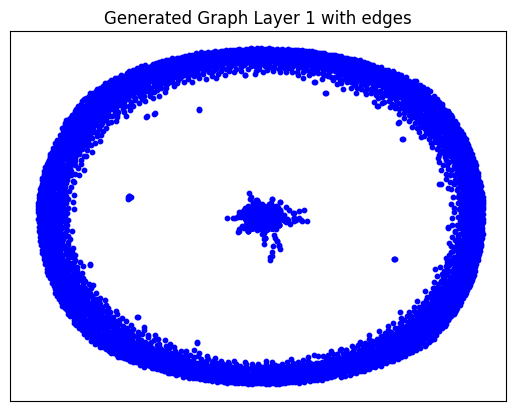

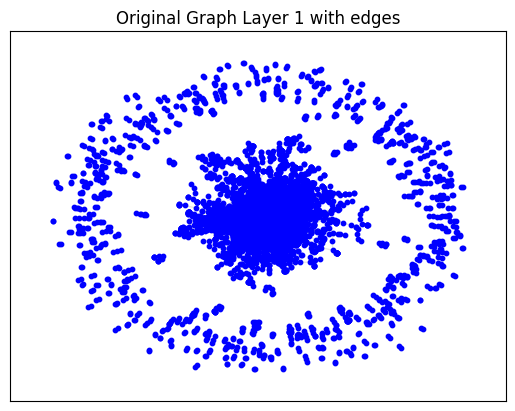

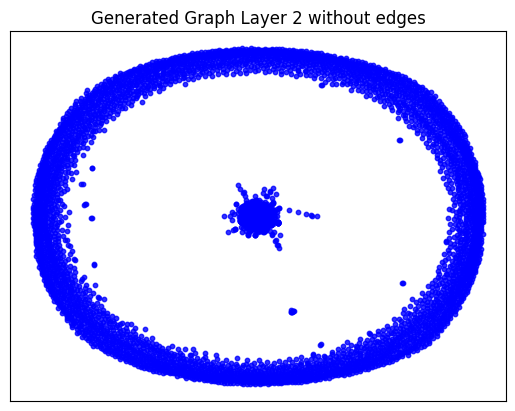

...

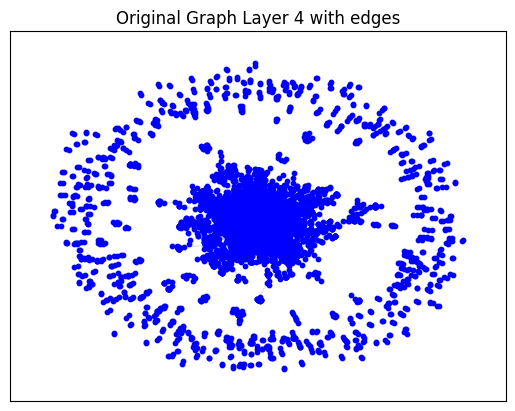

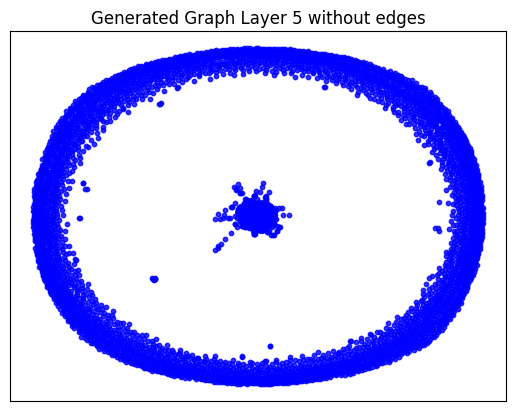

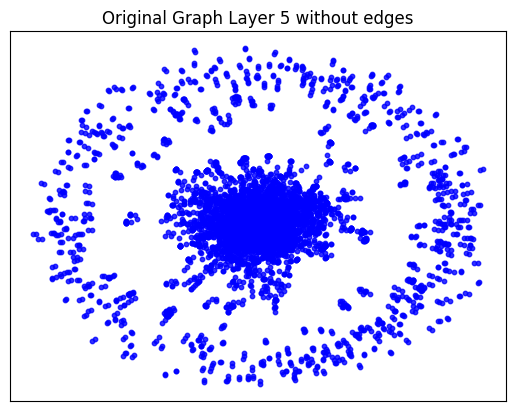

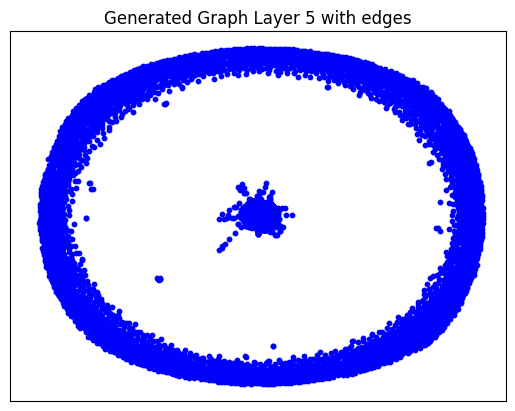

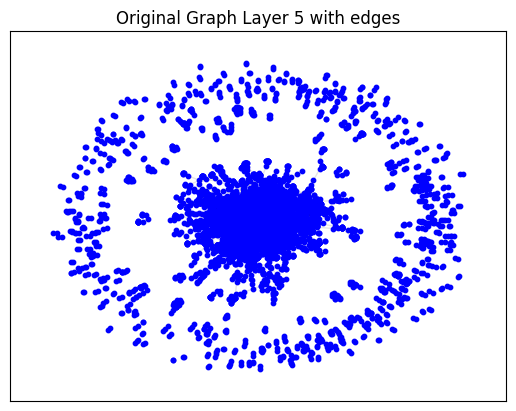

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_11.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.02830815315246582 seconds to compute statistics_degrees ---
--- 1.232771873474121 seconds to compute statistics_LCC ---
--- 0.03851795196533203 seconds to compute statistics_wedge_count ---
--- 0.03973054885864258 seconds to compute statistics_claw_count ---
--- 0.20387673377990723 seconds to compute statistics_triangle_count ---
--- 0.029245853424072266 seconds to compute statistics_power_law_alpha ---
--- 0.029944181442260742 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14301848411560059 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04834890365600586 seconds to compute degree_assortativity_coefficient ---
--- 0.6202392578125 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 159, 'd_min': 0, 'd': 1.1704809286898838, 'LCC': 676, 'wedge_count': 126615.0, 'claw_count': 2807554.0, 'triangle_count': 12397, 'power_law_exp': 1.7578740709801823, 'gini': 0.9558046172274548, 'rel_edge_distr_entropy': 0.6669945024430189, 'assortativity': -0.2331282780404502, 'clustering_coefficient': 0.01324676212817278, 'n_components': 5278}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.24871517928364004
KL divergence between original network and the network generated by Random E-R: 5.365168864753334
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 2.809313434855437
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.3672960437595276
KL divergence between original network and the network generated by Random E-R: 14.228810144935785
KL divergence between original network and the network generated by Random B-A: 1.823424294575882
KL divergence between original network and the network generated by GAE: 45.87692682566862


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

12 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_12.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_12'
args.filename = 'pubmed_12_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_12'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [1], Step: [0], Time: [9.0279]
Epoch: [2], Step: [0], Time: [9.2435]
Epoch: [3], Step: [0], Time: [9.4571]
Epoch: [4], Step: [0], Time: [9.6714]
Epoch: [5], Step: [0], Time: [9.8855]
Epoch: [6], Step: [0], Time: [10.0995]
Epoch: [7], Step: [0], Time: [10.3132]
Epoch: [8], Step: [0], Time: [10.5264]
Epoch: [9], Step: [0], Time: [10.7392]
Epoch: [10], Step: [0], Time: [10.9537]
Epoch: [11], Step: [0], Time: [11.1734]
Epoch: [12], Step: [0], Time: [11.3923]
Epoch: [13], Step: [0], Time: [11.6064]
Epoch: [14], Step: [0], Time: [11.8204]
Epoch: [15], Step: [0], Time: [12.0344]
Epoch: [16], Step: [0], Time: [12.2478]
Epoch: [17], Step: [0], Time: [12.4621]
Epoch: [18], Step: [0], Time: [12.6822]
Epoch: [19], Step: [0], Time: [12.9022]
Epoch: [20], Step: [0], Time: [13.1163]
Epoch: [21], Step: [0], Time: [13.3299]
Epoch: [22], Step: [0], Time: [13.5433]
Epoch: [23], Step: [0], Time: [13.7569]
Epoch: [24], Step: [0], Time: [13.9704]
Epoch: [25], Step: [0], Time

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([4869, 4869])
Shape of feature_tensor before unpooling: torch.Size([4869, 48])
Shapes in down_outs: [torch.Size([4869, 48]), torch.Size([4382, 48]), torch.Size([3505, 48])]
Shapes in indices_list: [torch.Size([4382]), torch.Size([3505]), torch.Size([2453])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([4869, 48])
Shape of indices_list[0]: torch.Size([4382])
Shape of new_h before assignment: torch.Size([4869, 48])
Shape of h_subset: torch.Size([4382, 48])
Shape of idx: torch.Size([4382])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([4382, 48])
Shape of indices_list[1]: torch.Size([3505])
Shape of new_h before assignment: torch.Size([4869, 48])
Shape of h_subset: torch.Size([3505, 48])
Shape of idx: torch.Size([3505])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([3505, 48])
Shape of

<ipython-input-51-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.018770933151245117 seconds to compute statistics_degrees ---
--- 0.7967829704284668 seconds to compute statistics_LCC ---
--- 0.027546405792236328 seconds to compute statistics_wedge_count ---
--- 0.028421401977539062 seconds to compute statistics_claw_count ---
--- 0.1528613567352295 seconds to compute statistics_triangle_count ---
--- 0.02031421661376953 seconds to compute statistics_power_law_alpha ---
--- 0.02028822898864746 seconds to compute statistics_gini ---
--- 0.09394073486328125 seconds to compute statistics_edge_distribution_entropy ---
--- 0.042028188705444336 seconds to compute degree_assortativity_coefficient ---
--- 0.3961060047149658 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 73, 'd_min': 1, 'd': 2.16557107641742, 'LCC': 3626, 'wedge_count': 42172.0, 'claw_count': 358538.0, 'triangle_count': 135, 'power_law_exp': 3.696549019736893, 'gini': 0.46

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.0193631649017334 seconds to compute statistics_power_law_alpha ---
--- 0.019381046295166016 seconds to compute statistics_gini ---
--- 0.03533339500427246 seconds to compute statistics_edge_distribution_entropy ---
--- 0.054396629333496094 seconds to compute degree_assortativity_coefficient ---
--- 0.32366037368774414 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 114, 'd_min': 0, 'd': 2.1698849630238293, 'LCC': 1573, 'wedge_count': 141150.0, 'claw_count': 2166183.0, 'triangle_count': 3055, 'power_law_exp': 1.65462498731487, 'gini': 0.9052646401980962, 'rel_edge_distr_entropy': 0.7526274934683741, 'assortativity': -0.20978662734321593, 'clustering_coefficient': 0.004230944476990171, 'n_components': 3293}
Computing metrics for ER graph
--- 0.017622947692871094 seconds to compute statistics_degrees ---
--- 1.024230718612671 seconds to compute statistics_LCC ---
--- 0.01938486099243164 seconds to comput

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5086977481842041 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 14.0, 'd_min': 0.0, 'd': 4.33114215283484, 'LCC': 4804, 'wedge_count': 45585.0, 'claw_count': 65401.0, 'triangle_count': 11, 'power_law_exp': 1.7381029897392508, 'gini': 0.26617817574246594, 'rel_edge_distr_entropy': 0.9856579210629055, 'assortativity': -0.0030345150019055866, 'clustering_coefficient': 0.0005045794406813352, 'n_components': 65}
Computing metrics for bara graph
--- 0.01774907112121582 seconds to compute statistics_degrees ---
--- 1.3591670989990234 seconds to compute statistics_LCC ---
--- 0.01928997039794922 seconds to compute statistics_wedge_count ---
--- 0.01983952522277832 seconds to compute statistics_claw_count ---
--- 24.353826761245728 seconds to compute statistics_triangle_count ---
--- 0.019933223724365234 seconds to compute statistics_power_law_alpha ---
--- 0.019507169723510742 seconds to compute statistics_gi

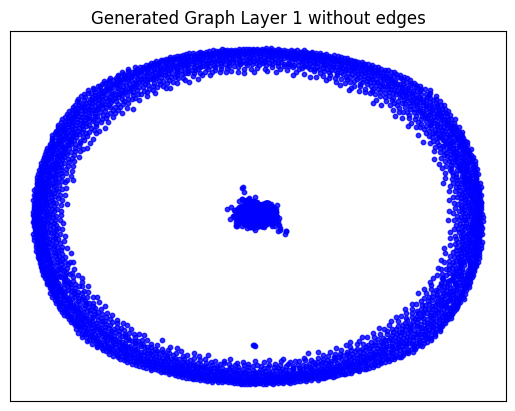

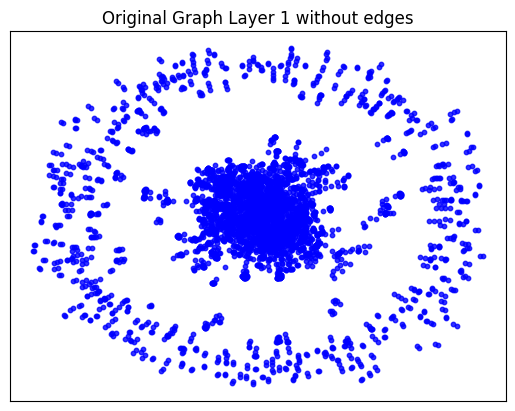

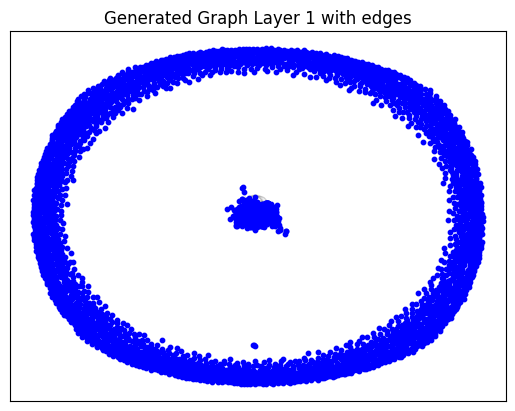

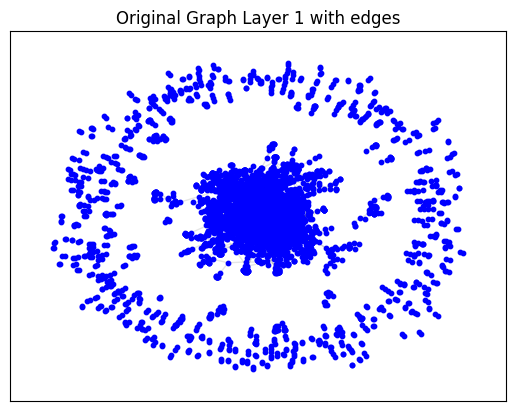

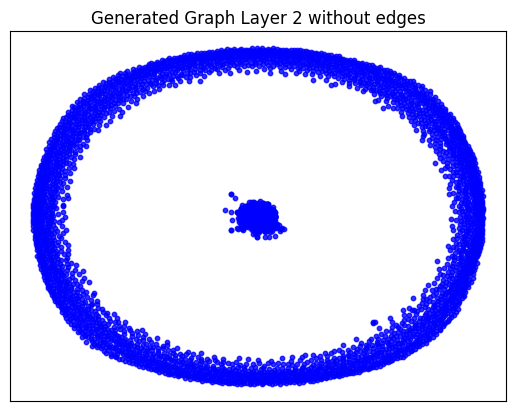

...

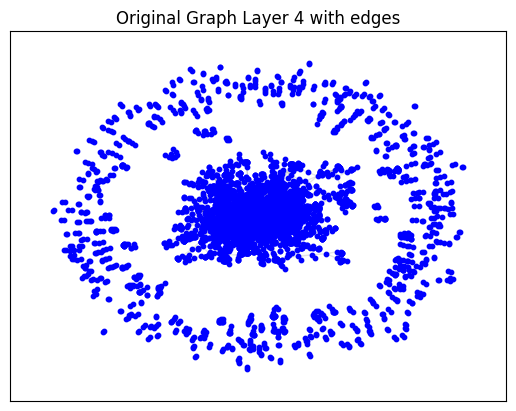

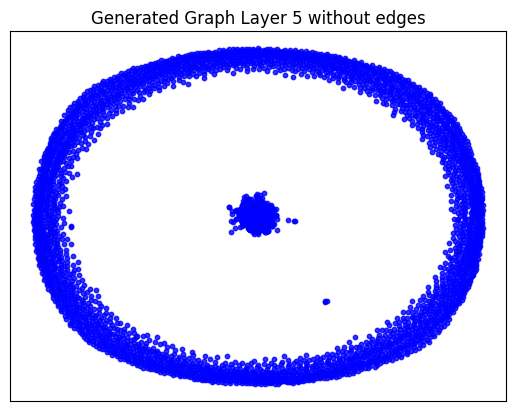

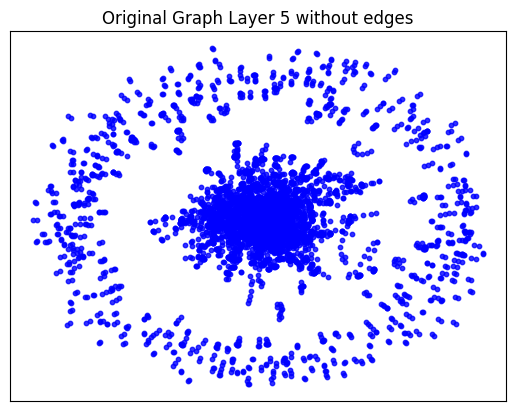

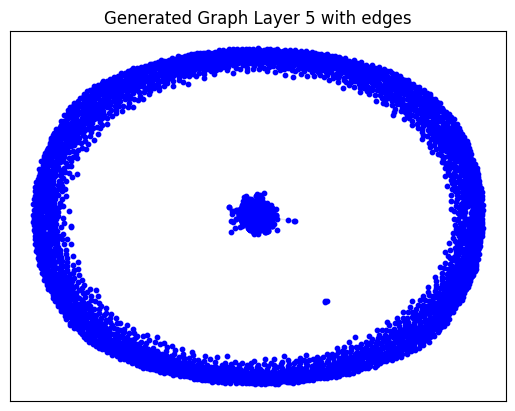

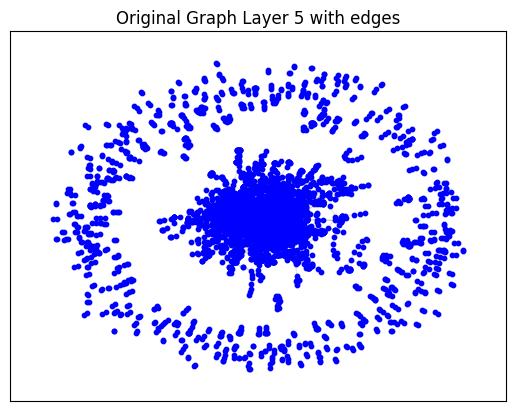

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_12.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.019968032836914062 seconds to compute statistics_degrees ---
--- 0.7987837791442871 seconds to compute statistics_LCC ---
--- 0.028048276901245117 seconds to compute statistics_wedge_count ---
--- 0.0286867618560791 seconds to compute statistics_claw_count ---
--- 0.13659930229187012 seconds to compute statistics_triangle_count ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.020772457122802734 seconds to compute statistics_power_law_alpha ---
--- 0.02099895477294922 seconds to compute statistics_gini ---
--- 0.09358429908752441 seconds to compute statistics_edge_distribution_entropy ---
--- 0.036022186279296875 seconds to compute degree_assortativity_coefficient ---
--- 0.40003180503845215 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 84, 'd_min': 0, 'd': 1.108646539330458, 'LCC': 271, 'wedge_count': 88828.0, 'claw_count': 1292284.0, 'triangle_count': 12997, 'power_law_exp': 1.4127371614437165, 'gini': 0.9686244214956499, 'rel_edge_distr_entropy': 0.6222974563433614, 'assortativity': 0.02015880195707416, 'clustering_coefficient': 0.030172160299129294, 'n_components': 4597}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.009186796986786068
KL divergence between original network and the network generated by Random E-R: 6.173688739431095
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.42758525377371037
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.2631729478859968
KL divergence between original network and the network generated by Random E-R: 55.119905535509446
KL divergence between original network and the network generated by Random B-A: 1.8017070211091302
KL divergence between original network and the network generated by GAE: 0.2522416827566528


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()